# The project "Analysis of the car market in Kazakhstan in 2019"

# Task description:
The dataset presents data on sales of new cars in Kazakhstan for 9 months of 2019. It is necessary to analyze the car market as a whole (capacity, dynamics, competitive environment) and assess the position of the Mercur Auto car center in the market: analysis of the external and internal environment of the car center.

# Description of the data
- year - year of sale (2019)  
- month - month of sale (January - September)
- company - name of the dealer
- brand - brand
- model - model
- release_year - the year of production of the car
- manufacturing_country - the country where the car was produced 
- fuel_type - type of fuel 
- engine_volume - engine_volume
- transmission_type - type of transmission 
 - drive_type - type of drive
- client_type - type of client
- quantity - quantity
- price_usd - the price of the car
 - sell_price_usd - order size (car price multiplied by quantity and minus discounts if any)
 - state - region
- new_segment - segment of car
- new_class - class car
- new_model - model

## Decomposition of the project
1. Uploading data
2. Research data analysis
3. Analysis of the passenger car market
- Calculation of the capacity of the car market: in monetary and quantitative terms;
- Identification of leading brands in the market;
- Market dynamics: general, by segment;
- Analysis of car sales by brand / segment;
- Analysis of car sales by brand;
- Analysis of car sales by region;
- Hypothesis testing: the cost of a car depends on the level of development of the region (average salary in the region);
- Analysis of car center sales;
- Identification of leading models in the market;
4. Analysis of the commercial vehicle market
- Calculation of the capacity of the car market: in monetary and quantitative terms;
- Identification of leading brands in the market;
- Market dynamics: general, by segment;
- Analysis of car sales by brand / segment;
- Analysis of car sales by brand;
- Analysis of car sales by region;
- Hypothesis testing: the cost of a car depends on the level of development of the region (average salary in the region);
- Analysis of car center sales;
- Identification of leading models in the market;
5. Analysis of the position of Mercury
- Calculation of the company's revenue: total, by brand, average, monthly, monthly by brand;
- Analysis of the company's sales by region: general, by brand;
- Competitor analysis;
- BCG analysis of company models (sales analysis by models);

**This project uses already processed and cleaned data. Working with raw data - eliminating omissions, explicit and implicit duplicates is presented here (comments on the code are in Russian): https://github.com/Alex63685/Analysis-of-car-sales-in-Kazahstan/blob/main/Project_Auto_sales_for_portfolio.ipynb

## Step 1. Open the files and examine the general information

In [1]:
# Importing the libraries that will be needed in this project
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter("ignore")
import pandas as pd
from datetime import datetime, timedelta
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import scipy.stats as stats
import re
import plotly.graph_objects as go
from plotly import graph_objects as go
import plotly.express as px
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [2]:
data_english = pd.read_csv('data_english.csv')
data_english.head()

,year,month,company,brand,model,release_year,manufacturing_country,fuel_type,engine_volume,transmission_type,drive_type,client_type,price_usd,quantity,sell_price_usd,state,new_segment,new_class,new_model
0,2019,May,Mercur Auto,Audi,A3,2018.0,Germany,Gasoline,1.4,automatic transmission,FWD,B2C client,28115.00,1.0,28115.00,Almaty,Light vehicle,C class,Audi A3
1,2019,August,Mercur Auto,Audi,A3,2018.0,Germany,Gasoline,1.4,automatic transmission,FWD,B2B client,32246.99,1.0,32246.99,Almaty,Light vehicle,C class,Audi A3
2,2019,April,Mercur Auto,Audi,A4,2018.0,Germany,Gasoline,1.4,automatic transmission,FWD,B2C client,32000.00,1.0,32000.00,Almaty,Light vehicle,D class,Audi A4
3,2019,July,Mercur Auto,Audi,A4,2018.0,Germany,Gasoline,1.4,automatic transmission,FWD,B2B client,31929.00,1.0,31929.00,Almaty,Light vehicle,D class,Audi A4
4,2019,July,Mercur Auto,Audi,A4,2018.0,Germany,Gasoline,1.4,automatic transmission,FWD,B2C client,31929.00,1.0,31929.00,Almaty,Light vehicle,D class,Audi A4


In [3]:
# Let's study the general information about the data in the table
data_english.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39959 entries, 0 to 39958
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   year                   39959 non-null  int64  
 1   month                  39959 non-null  object 
 2   company                39959 non-null  object 
 3   brand                  39959 non-null  object 
 4   model                  39959 non-null  object 
 5   release_year           39953 non-null  float64
 6   manufacturing_country  39959 non-null  object 
 7   fuel_type              39685 non-null  object 
 8   engine_volume          39629 non-null  float64
 9   transmission_type      39336 non-null  object 
 10  drive_type             39390 non-null  object 
 11  client_type            39959 non-null  object 
 12  price_usd              39959 non-null  float64
 13  quantity               39959 non-null  float64
 14  sell_price_usd         39959 non-null  float64
 15  st

## Step 2. Exploratory Data Analysis

#### *Let's categorize the column with engine capacity*.
Let's split the values from this column into 5 categories:
- especially small class — engine capacity up to 1.2 liters
- small class — engine capacity from 1.2 to 1.8 liters
- middle class — engine capacity from 1.8 to 3.5 liters
- large class — engine capacity from 3.5 to 6 liters
- especially large class - engine capacity over 6 liters

In [4]:
def categorize_engine(row):
    try:
        if row <= 1.2:
            return 'especially small class (up to 1.2 liters)'
        elif 1.2 < row <= 1.8:
            return 'small class (from 1.2 to 1.8 liters)'
        elif 1.8 < row <= 3.5:
            return 'middle class (from 1.8 to 3.5 liters)'
        elif 3.5 < row <= 6.0:
            return 'large class (from 3.5 to 6 liters)'
        elif row > 6.0:
            return 'especially large class (over 6 liters)'
    except:
        pass

In [5]:
data_english['engine_type'] = data_english['engine_volume'].apply(categorize_engine)

In [6]:
data_english['engine_type'].unique()

array(['small class (from 1.2 to 1.8 liters)',
       'middle class (from 1.8 to 3.5 liters)',
       'large class (from 3.5 to 6 liters)',
       'especially large class (over 6 liters)', None,
       'especially small class (up to 1.2 liters)'], dtype=object)

#### *Let's check which machines with which production date prevail in our table*.

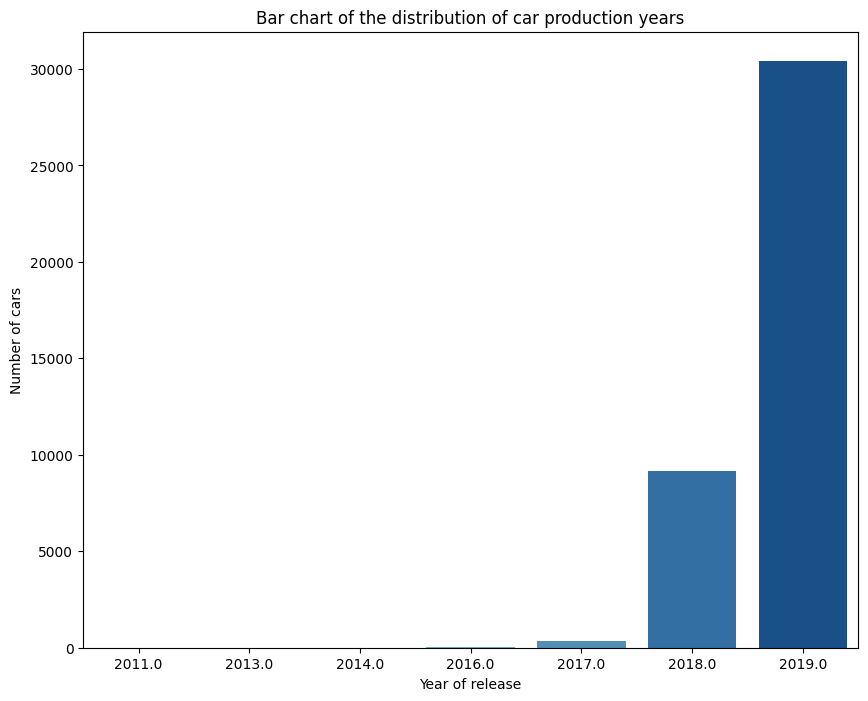

In [7]:
# For better clarity, let's build a bar chart
fig, ax = plt.subplots(figsize=(10, 8))

ax = sns.countplot(x = "release_year", data = data_english.sort_values(by='release_year', ascending=True), palette = "Blues")
plt.xlabel('Year of release')
plt.ylabel('Number of cars')
plt.title('Bar chart of the distribution of car production years')
plt.show();

**We see that 2019 cars predominate in the table.**

#### *Let's check which manufacturing countries prevail in our table*.

In [8]:
country = data_english.groupby('manufacturing_country', as_index=False)['quantity'].agg('sum')

In [9]:
# Let's create a function for building a bar chart
def function_seaborn(table, x, y):
    fig, ax = plt.subplots(figsize=(15, 8))
    ax = sns.barplot(x = x, y=y,
                 data = table.sort_values(by=x, ascending=False))
    plt.ylabel(f'{y}')
    plt.xlabel('Number of cars')
    plt.title(f'Bar chart of the distribution {y}')
    plt.ticklabel_format(useOffset=False,style='plain', axis='x')
    plt.show();

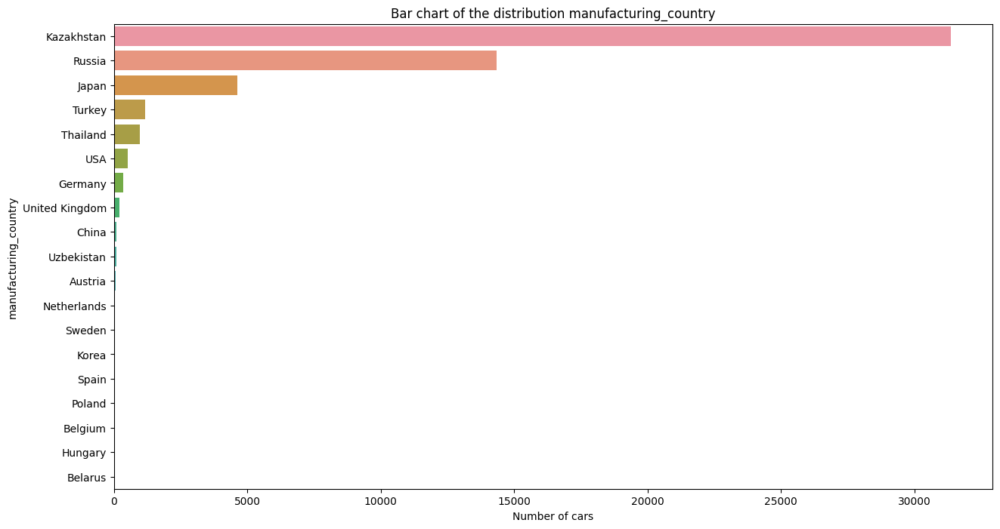

In [10]:
function_seaborn(table=country, x='quantity', y='manufacturing_country')

**We see that the table is dominated by machines manufactured in Kazakhstan and Russia.**

#### *Let's check which type of fuel cars prevail in our table*.

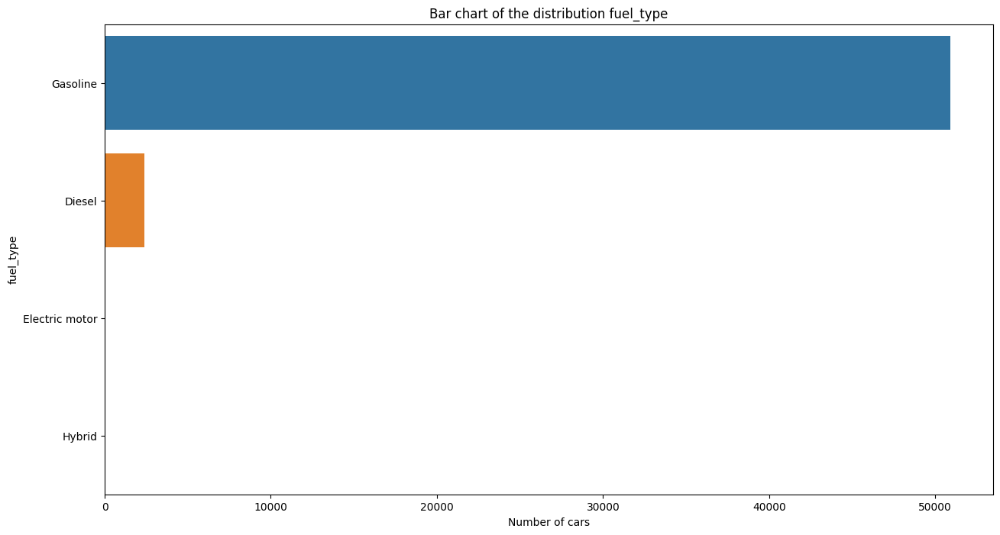

In [11]:
fuel = data_english.groupby('fuel_type', as_index=False)['quantity'].agg('sum')

function_seaborn(table=fuel, x='quantity', y='fuel_type')

**We see that the table is dominated by cars with gasoline engines.**

#### *Let's check the cars with which engine capacity prevail in our table*.

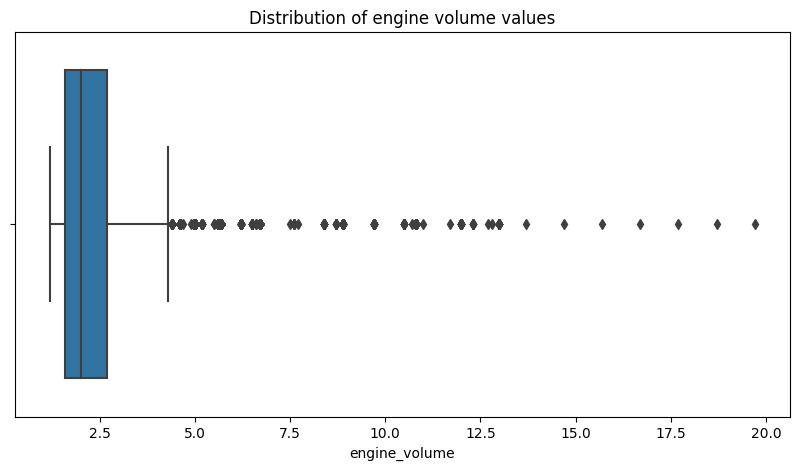

In [12]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.boxplot(data_english.query('engine_volume > 0')['engine_volume'], orient='h')
plt.title('Distribution of engine volume values')
plt.show();

**We see that most of the values are in the range from 1 to 2.5 liters. We also see a large number of emissions. In my opinion, they cannot be deleted because the data related to commercial transport and by deleting them, we will not be able to correctly analyze the market. Therefore, we will leave these values unchanged.**

#### *Let's check which type of drive machines prevail in our table*.

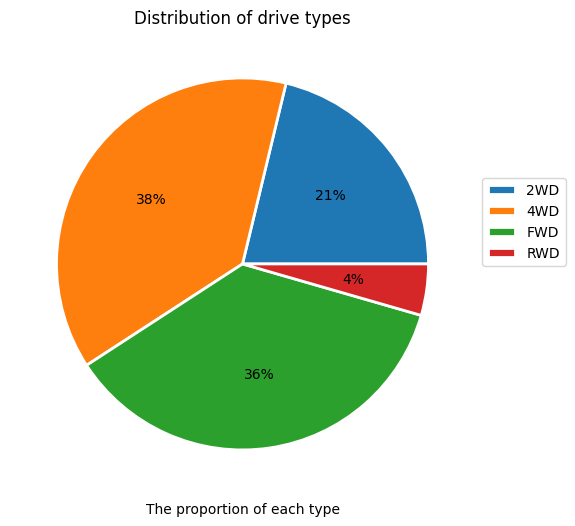

In [13]:
car_drive = data_english.groupby('drive_type', as_index=False)['quantity'].agg('sum')

values= car_drive['quantity']
keys = car_drive['drive_type']
fig, ax = plt.subplots(figsize=(6, 10))
plt.pie(values,
        labels=keys,
        labeldistance=None,
        autopct='%.0f%%', wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'})
plt.legend()
plt.legend(bbox_to_anchor=(1, 0.7))
plt.title('Distribution of drive types')
plt.xlabel("The proportion of each type")
plt.show();

**We see that the table is dominated by cars with all-wheel drive and front-wheel drive.**

#### *Let's check which type of transmission cars prevail in our table*.

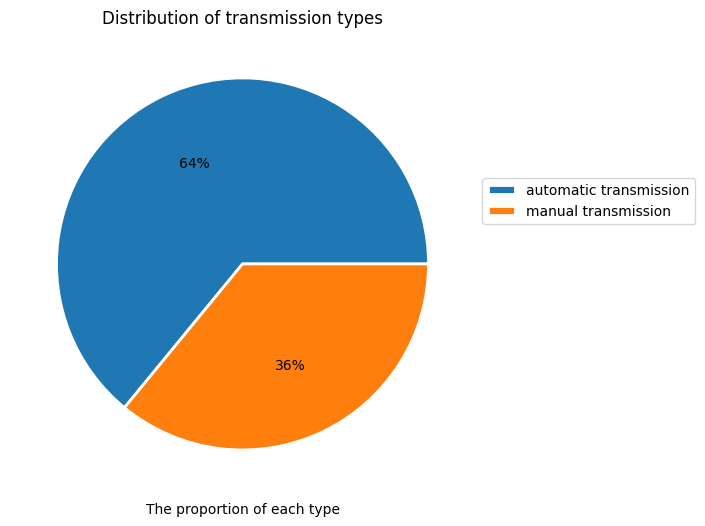

In [14]:
transmission = data_english.groupby('transmission_type', as_index=False)['quantity'].agg('sum')

values= transmission['quantity']
keys = transmission['transmission_type']
fig, ax = plt.subplots(figsize=(6, 10))
plt.pie(values,
        labels=keys,
        labeldistance=None,
        autopct='%.0f%%', wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'})
plt.legend()
plt.legend(bbox_to_anchor=(1, 0.7))
plt.title('Distribution of transmission types')
plt.xlabel("The proportion of each type")
plt.show();

**We see that the table is dominated by cars with automatic transmission.**

#### *Let's check which customers prevail in our table*.

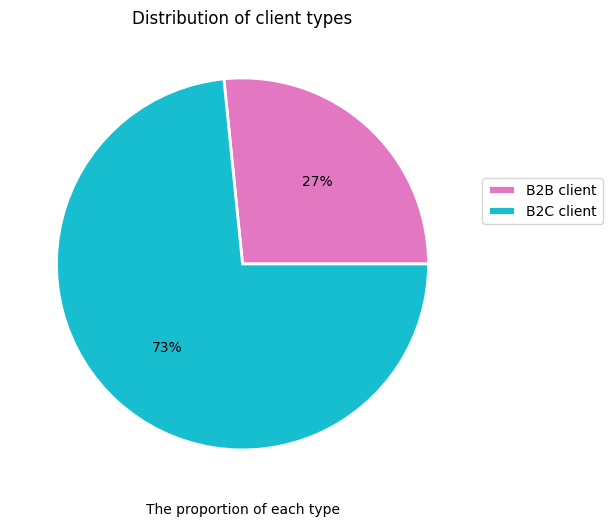

In [15]:
clients = data_english.groupby('client_type', as_index=False)['model'].agg('count')

values= clients['model']
keys = clients['client_type']
colors = ['tab:pink', 'tab:cyan']
fig, ax = plt.subplots(figsize=(6, 10))
plt.pie(values,
        labels=keys,
        labeldistance=None,
        autopct='%.0f%%', wedgeprops={'linewidth': 2.0, 'edgecolor': 'white'}, colors=colors)
plt.legend()
plt.legend(bbox_to_anchor=(1, 0.7))
plt.title('Distribution of client types')
plt.xlabel("The proportion of each type")
plt.show();

**We see that the table is dominated by individuals.**

**Let's check which type of client brings in the most money**

In [16]:
clients_money = data_english.groupby('client_type', as_index=False)['sell_price_usd'].agg('sum')
clients_money

,client_type,sell_price_usd
0,B2B client,5.193044e+08
1,B2C client,8.298901e+08


**We see that individuals bring in more money than legal entities. This is due to the fact that there are many more individuals than legal entities in our table.**

#### *Проверим, какое количество автомобилей как правило фигурирует в заказе*.

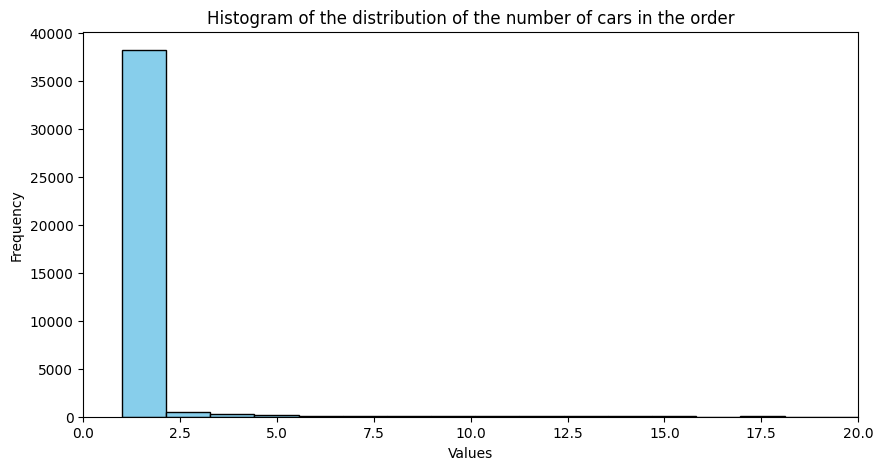

In [17]:
data_english['quantity'].hist(figsize=[10, 5], bins=100, color='skyblue', edgecolor='black', grid=False)
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Histogram of the distribution of the number of cars in the order')
plt.xlim (0, 20)
plt.show()

**We see that as a rule, from 1 to 2 cars appear in the order.**

#### *Let's check the cars with which price prevail in our table*.

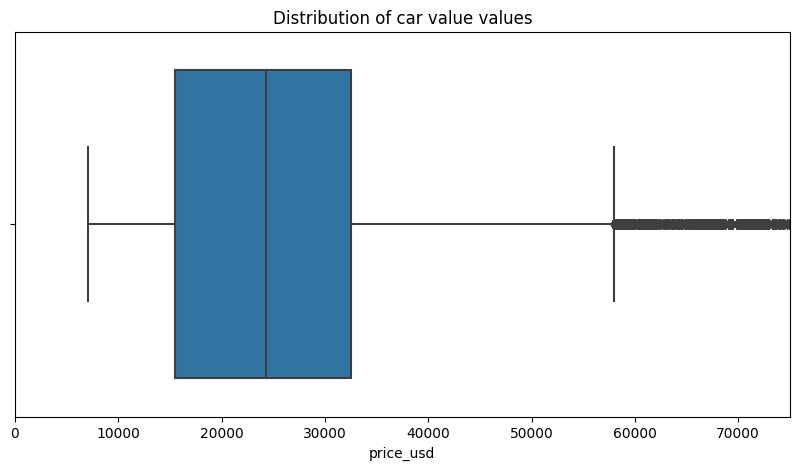

In [18]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.boxplot(data_english['price_usd'], orient='h')
plt.title('Distribution of car value values')
plt.xlim (0, 75000)
plt.show();

**We see that most of the values of the car's value are in the range from 6000 to 58000 dollars. We also see a large number of emissions. In my opinion, they cannot be deleted because the data related to commercial transport and by deleting them, we will not be able to correctly analyze the market. Therefore, we will leave these values unchanged.**

####  *Let's check which car segments prevail in our table*.

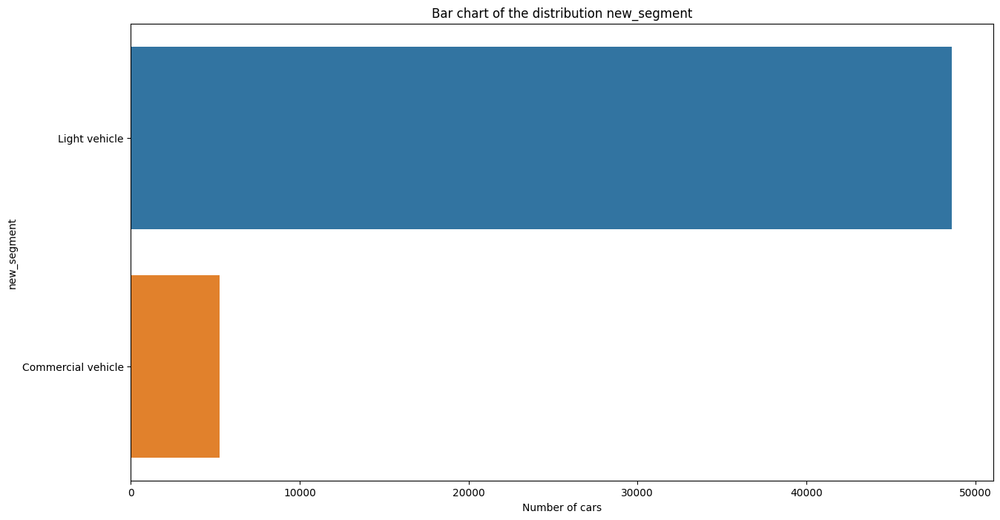

In [19]:
segment = data_english.groupby('new_segment', as_index=False)['quantity'].agg('sum')

function_seaborn(table=segment, x='quantity', y='new_segment')

**We see that light vehicles predominate in the table.**

**Let's check which segment brings in the most money**

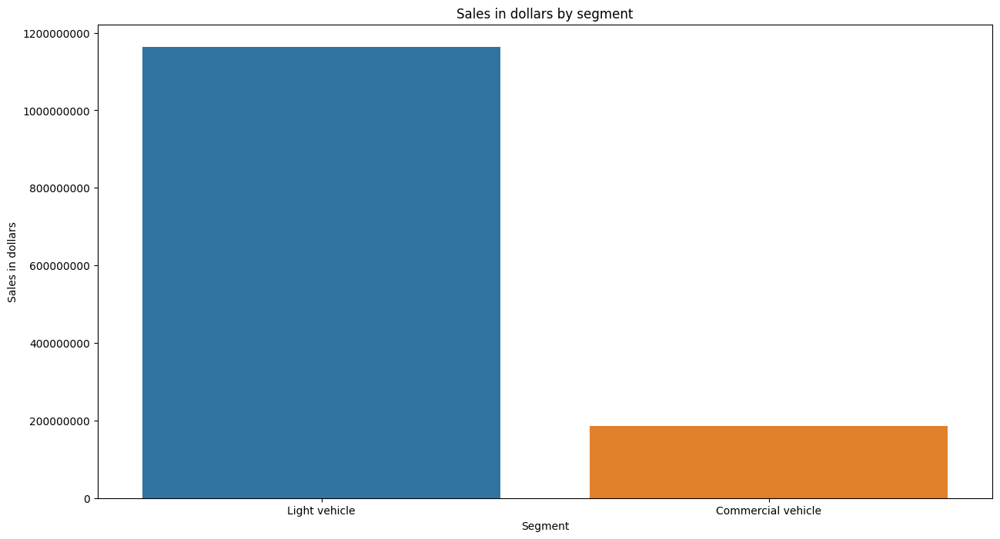

In [20]:
segment_money= data_english.groupby('new_segment', as_index=False)['sell_price_usd'].agg('sum')

fig, ax = plt.subplots(figsize=(15, 8))

ax = sns.barplot(x = "new_segment", y='sell_price_usd',
                 data = segment_money.sort_values(by='sell_price_usd', ascending=False))
plt.xlabel('Segment')
plt.ylabel('Sales in dollars')
plt.title('Sales in dollars by segment')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')
plt.show();

**We see that the light vehicles segment is much more profitable compared to commercial vehicles**

#### *Let's check which classes prevail in our table*.

In [21]:
class_name = data_english.groupby('new_class', as_index=False)['quantity'].agg('sum')
class_money= data_english.groupby('new_class', as_index=False)['sell_price_usd'].agg('sum')

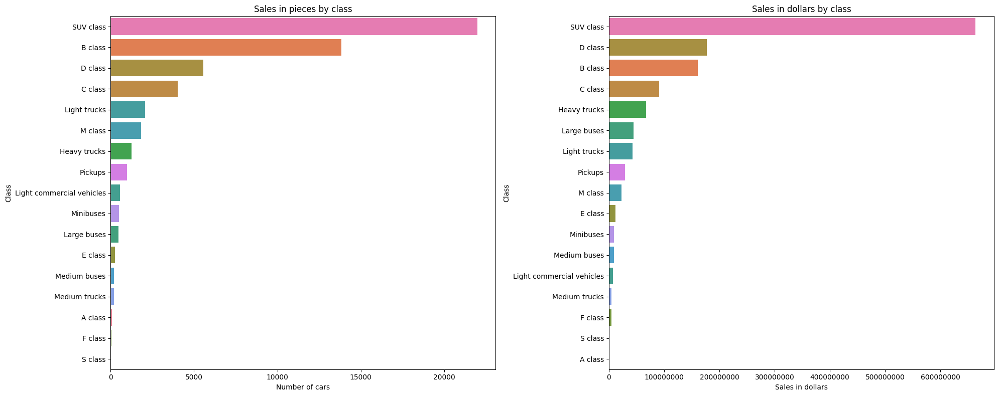

In [22]:
class_names = class_money['new_class'].unique()
class_colors = sns.color_palette("husl", n_colors=len(class_names))

class_color_dict = dict(zip(class_names, class_colors))

plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "new_class", x='quantity',
                 data = class_name.sort_values(by='quantity', ascending=False), palette=class_color_dict)
plt.xlabel('Number of cars')
plt.ylabel('Class')
plt.title('Sales in pieces by class')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "new_class", x='sell_price_usd',
                 data = class_money.sort_values(by='sell_price_usd', ascending=False), palette=class_color_dict)
plt.xlabel('Sales in dollars')
plt.ylabel('Class')
plt.title('Sales in dollars by class')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')
plt.tight_layout()
plt.show();

**We see that SUV class cars are the most profitable. We can also say that cars of this class prevail in our table.**

#### *Let's estimate the number of brands usually represented in the portfolio of car dealers*.

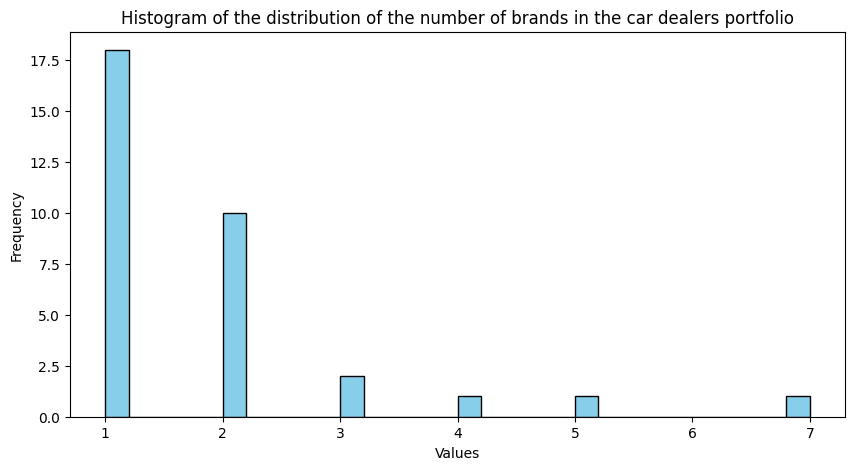

In [23]:
brand_per_company = data_english.groupby('company', as_index=False)['brand'].agg('nunique')
brand_per_company['brand'].hist(figsize=[10, 5], bins=30, color='skyblue', edgecolor='black', grid=False)
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Histogram of the distribution of the number of brands in the car dealers portfolio')
plt.show()

**We see that, as a rule, there are from 1 to 2 brands in the car dealer's portfolio.**

#### *We will find the cheapest and most expensive brands in our table*.

In [24]:
brand_expensive = data_english.groupby('brand', as_index=False)['price_usd'].agg('median')
brand_expensive.sort_values(by='price_usd', ascending=False).head()

,brand,price_usd
30,Nefaz,123251.160
21,Land Rover,116486.760
24,MAN,101048.940
36,Scania,101046.385
5,Daewoo,97460.015


**We see that Land Rover, related to passenger cars, has been included in the list of the top 5 most expensive brands, which is a bit unexpected.**

In [25]:
brand_expensive.sort_values(by='price_usd', ascending=True).head()

,brand,price_usd
34,Ravon,9893.93
4,Chevrolet,10523.30
20,Lada,11600.00
23,Lifan,12145.79
35,Renault,12635.54


**The list of the top 5 cheapest brands looks logical and really consists of the cheapest brands on the market.**

#### *Let's find how many models each car brand has*.

In [26]:
model_per_brand = data_english.groupby('brand', as_index=False)['model'].agg('nunique')
model_per_brand.sort_values(by='model', ascending=False)

,brand,model
18,KAMAZ,24
2,BMW,14
26,Mercedes-Benz,14
43,Volkswagen,13
41,UAZ,10
12,Hyundai Truck & Bus,10
16,Jac,9
19,Kia,9
1,Audi,9
9,GAZ,9


**We see that Kamaz has the most models, and MAN, Shacman, Nefaz, Dong Feng, Yutong have the least.**

### Interim conclusion: at this stage, we have conducted a research analysis of the data. We were able to establish the following:
1. The table is dominated by 2019 cars.
2. The table is dominated by machines manufactured in Kazakhstan and Russia.
3. The table is dominated by cars with gasoline engines.
4. Most of the engine displacement values are in the range from 1 to 2.5 liters. A large number of outliers were also found in this column. It was decided not to delete them in order to correctly analyze the market.
5. The table is dominated by cars with all-wheel drive and front-wheel drive.
6. The table is dominated by cars with automatic transmission.
7. The table is dominated by individual clients.
8. Individuals bring in more money than legal entities.
9. As a rule, the order includes from 1 to 2 cars.
10. Most of the values of the car's value are in the range from $6,000 to $58,000. A large number of outliers were also found in this column. It was decided not to delete them in order to correctly analyze the market.
11. The SUV and passenger car segments are the most profitable.
12. SUV class cars are the most profitable.
13. As a rule, the car dealer's portfolio includes from 1 to 2 brands.
14. Top 5 cheapest brands in terms of price: Chevrolet, Ravon, Lada, Lifan, Renault.
15. Top 5 most expensive brands in terms of price: Nefaz, Land Rover,MAN, Scania, Daewoo.

## Step 3. Light vehicles Market Analysis

### Let's calculate the capacity of the car market: in monetary and quantitative terms

In [27]:
data_english['sell_price_usd'] = round(data_english['sell_price_usd'], 0)
light_vehicles = data_english.query('new_segment == "Light vehicle"')

In [28]:
light_vehicles['quantity'].sum()

48629.0

In [29]:
light_vehicles['sell_price_usd'].sum()

1163382413.0

**Conclusion: the actual capacity of the light vehicles market in Kazakhstan in 2019 as of September is 48,629 units and 1,163,382,320 dollars, respectively.**

### Let's find the leading brands in the car market

In [30]:
top_brands = light_vehicles.pivot_table(index='brand',
                                              values='sell_price_usd',
                                              aggfunc='sum').reset_index()
top_brands.sort_values(by='sell_price_usd', ascending=False)

,brand,sell_price_usd
26,Toyota,402499843.0
5,Hyundai,229307492.0
11,Lada,107847480.0
13,Lexus,77376345.0
10,Kia,45669700.0
19,Nissan,40012763.0
1,BMW,28735769.0
8,Jac,26595440.0
28,Volkswagen,25149709.0
23,Renault,24184905.0


In [31]:
# Let's keep the names of the brands with the best sales in a separate list
best_brands_light = light_vehicles.pivot_table(index='brand',
                                              values='sell_price_usd',
                                              aggfunc='sum').reset_index().nlargest(10, 'sell_price_usd')['brand'].tolist()

In [32]:
# We will rename all brands that are not related to the tops to "the rest"
top_brands.loc[~top_brands['brand'].isin(best_brands_light), 'brand'] = "Rest"
top_brands.sort_values(by='sell_price_usd', ascending=False)

,brand,sell_price_usd
26,Toyota,402499843.0
5,Hyundai,229307492.0
11,Lada,107847480.0
13,Lexus,77376345.0
10,Kia,45669700.0
19,Nissan,40012763.0
1,BMW,28735769.0
8,Jac,26595440.0
28,Volkswagen,25149709.0
23,Renault,24184905.0


In [33]:
pastel_colors = px.colors.qualitative.Pastel

fig = go.Figure(data=[go.Pie(labels=top_brands['brand'],
                            values=top_brands['sell_price_usd'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "The brands are the leaders among light vehicles in terms of sales in dollars"},
                  height=800,
                  width=800)

fig.show()

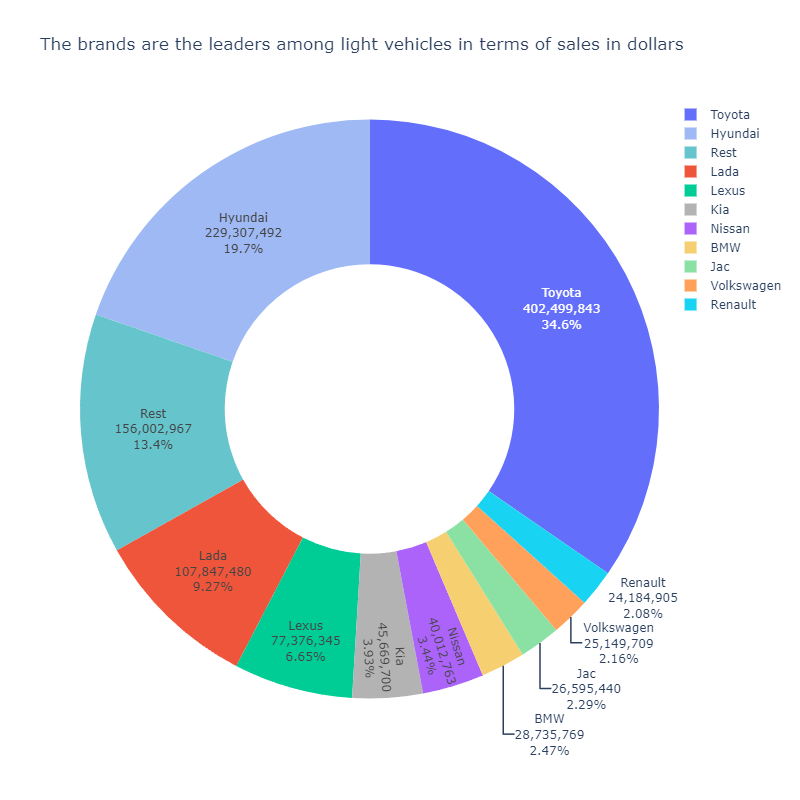

In [34]:
top_brands_count = light_vehicles.pivot_table(index='brand',
                                              values='quantity',
                                              aggfunc='sum').reset_index()

best_brands_count = light_vehicles.pivot_table(index='brand',
                                              values='quantity',
                                              aggfunc='sum').reset_index().nlargest(10, 'quantity')['brand'].tolist()

top_brands_count.loc[~top_brands_count['brand'].isin(best_brands_count), 'brand'] = "Rest"

top_brands_count

,brand,quantity
0,Rest,52.0
1,Rest,438.0
2,Rest,72.0
3,Rest,648.0
4,Rest,3.0
5,Hyundai,10168.0
6,Rest,96.0
7,Rest,73.0
8,Jac,1907.0
9,Rest,37.0


In [35]:
fig = go.Figure(data=[go.Pie(labels=top_brands_count['brand'],
                            values=top_brands_count['quantity'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "The brands are the leaders among light vehicles in terms of sales in units"},
                  height=800,
                  width=800)

fig.show()

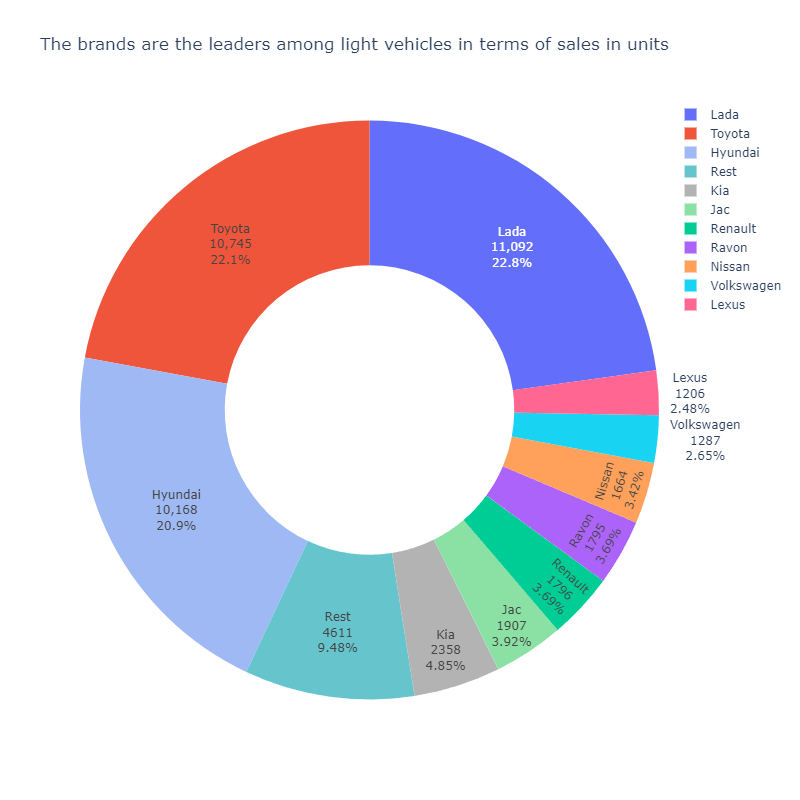

**Conclusion: Lada, Toyota and Hyundai are the leaders of the light vehicles market, both in terms of sales in units and in dollars.**

### Let's analyze the dynamics of the market: general and by segment

#### *General market dynamics*

**Let's write a function that will sort the values in the table in calendar order.**

In [36]:
def order_months(df, month_column):
    month_order = {'January': 1, 'February': 2, 'March': 3,
                   'April': 4, 'May': 5, 'June': 6, 'July': 7, 'August': 8, 'September': 9}

    # Converting the 'Month' column to numeric order
    df[month_column] = df[month_column].map(month_order)

    # Sorting the Data Frame by the 'Month' column
    df = df.sort_values(by=month_column)

    # Restoring the original order of months
    df[month_column] = df[month_column].map({v: k for k, v in month_order.items()})

    return df  

In [37]:
dynamic_total = light_vehicles.pivot_table(index='month',
                                              values=['sell_price_usd', 'quantity'],
                                              aggfunc='sum').reset_index()

dynamic_total = order_months(dynamic_total, 'month')
dynamic_total

,month,quantity,sell_price_usd
3,January,4163.0,103406985.0
2,February,4125.0,100106421.0
6,March,4525.0,109685397.0
0,April,5351.0,132852565.0
7,May,5688.0,137049244.0
5,June,5910.0,144339583.0
4,July,6908.0,157158929.0
1,August,5973.0,138678260.0
8,September,5986.0,140105029.0


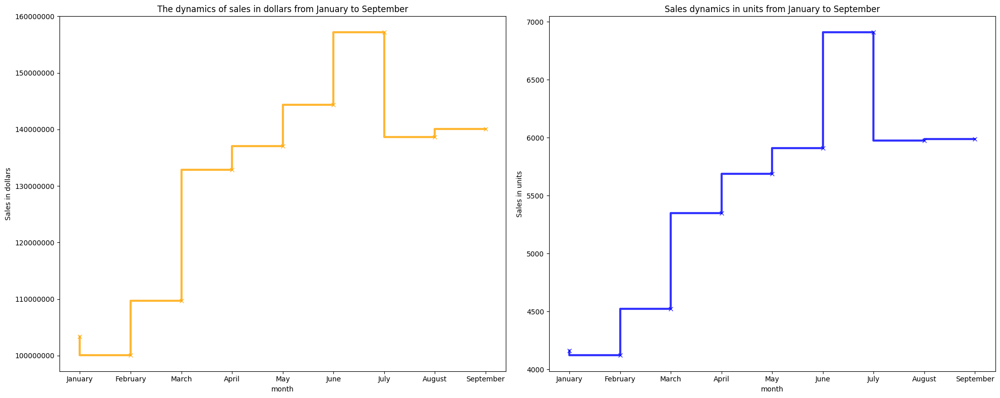

In [38]:
plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = plt.step(x=dynamic_total['month'], y=dynamic_total['sell_price_usd'], marker='x', linewidth=3, alpha=0.8, color='orange')
plt.xlabel('month')
plt.ylabel('Sales in dollars')
plt.title('The dynamics of sales in dollars from January to September')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')


ax2 = plt.subplot(1, 2, 2)
ax2 = plt.step(x=dynamic_total['month'], y=dynamic_total['quantity'], marker='x', linewidth=3, alpha=0.8, color='blue')
plt.xlabel('month')
plt.ylabel('Sales in units')
plt.title('Sales dynamics in units from January to September')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')

plt.tight_layout()
plt.show();

**Conclusion: we see that sales peaked in July, there were practically no sales in the first quarter, which is logical due to the New Year holidays and the beginning of the year in general.**

#### *Market dynamics by car class*

In [39]:
dynamic_segment_light = light_vehicles.pivot_table(index=['month', 'new_class'],
                                              values=['sell_price_usd', 'quantity'],
                                              aggfunc='sum').reset_index()

dynamic_segment_light  = order_months(dynamic_segment_light , 'month')

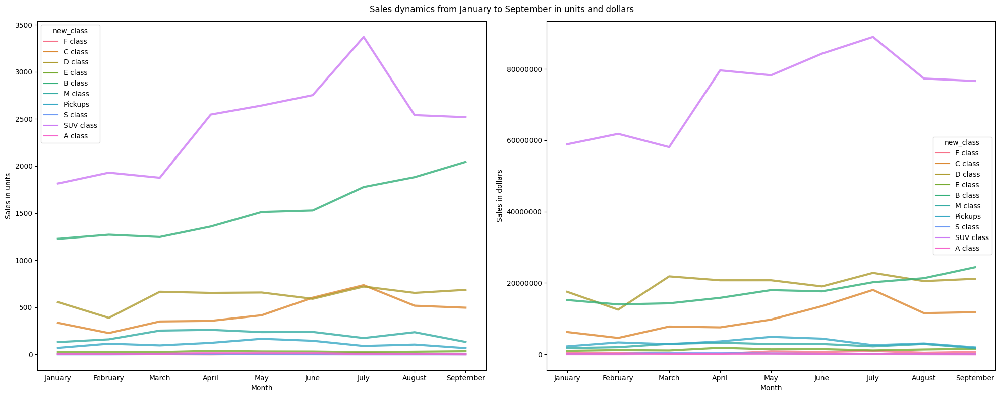

In [40]:
class_names = dynamic_segment_light['new_class'].unique()
class_colors = sns.color_palette("husl", n_colors=len(class_names))

class_color_dict = dict(zip(class_names, class_colors))

plt.figure(figsize=(20, 8))
plt.suptitle('Sales dynamics from January to September in units and dollars')

ax1 = plt.subplot(1, 2, 1)
ax1 = sns.lineplot(y='quantity', x='month', data=dynamic_segment_light, hue='new_class', linewidth=3, alpha=0.8, 
                   palette=class_color_dict)
plt.xlabel('Month')
plt.ylabel('Sales in units')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='new_class')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.lineplot(y='sell_price_usd', x='month', data=dynamic_segment_light, hue='new_class', linewidth=3, alpha=0.8,
                  palette=class_color_dict)
plt.xlabel('Month')
plt.ylabel('Sales in dollars')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='new_class')

plt.tight_layout()
plt.show();

**Conclusion: we see that all classes behave approximately the same in terms of sales dynamics, all of them have been growing since spring with a peak in July. The SUV class is the undisputed market leader.**

### Let's analyze car sales by brand

#### *Проанализируем продажи автомобилей в штуках в разрезе бренд - модель*

**We will consider only the top 10 brands by sales**

In [41]:
brands_model_count = light_vehicles.loc[light_vehicles['brand'].isin(best_brands_count)].pivot_table(index=['brand', 'model'],
                                                                                               values='quantity',
                                                                                               aggfunc='sum').reset_index()

brands_model_count.head(20)

,brand,model,quantity
0,Hyundai,Accent,2211.0
1,Hyundai,Creta,1775.0
2,Hyundai,Elantra,2062.0
3,Hyundai,Santa Fe,639.0
4,Hyundai,Sonata,188.0
5,Hyundai,TQ-1/H-1,22.0
6,Hyundai,Tucson,3271.0
7,Jac,S3,1355.0
8,Jac,S5,486.0
9,Jac,S7,1.0


**Since there are a lot of models, we will rank all models within each brand by sales and visualize only the top 5 models of each brand.**

In [42]:
brands_model_count["rank"] = brands_model_count.groupby("brand")["quantity"].rank(ascending=False)

In [43]:
unique_colors = sns.color_palette("husl", 50)

# Color conversion in the format '#RRGGBB'
marker_color = ['#%02x%02x%02x' % (int(r * 255), int(g * 255), int(b * 255)) for r, g, b in unique_colors]

fig = px.bar(brands_model_count.query('rank < 6').sort_values(by='rank'),
             y='brand',
             x='quantity',
             color='model',
             color_discrete_sequence=marker_color,
            text='model')

# Setting up the layout
fig.update_layout(
    title='Leading brands in sales and their models',
    xaxis_title='Sales in units',
    yaxis_title='Brand',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

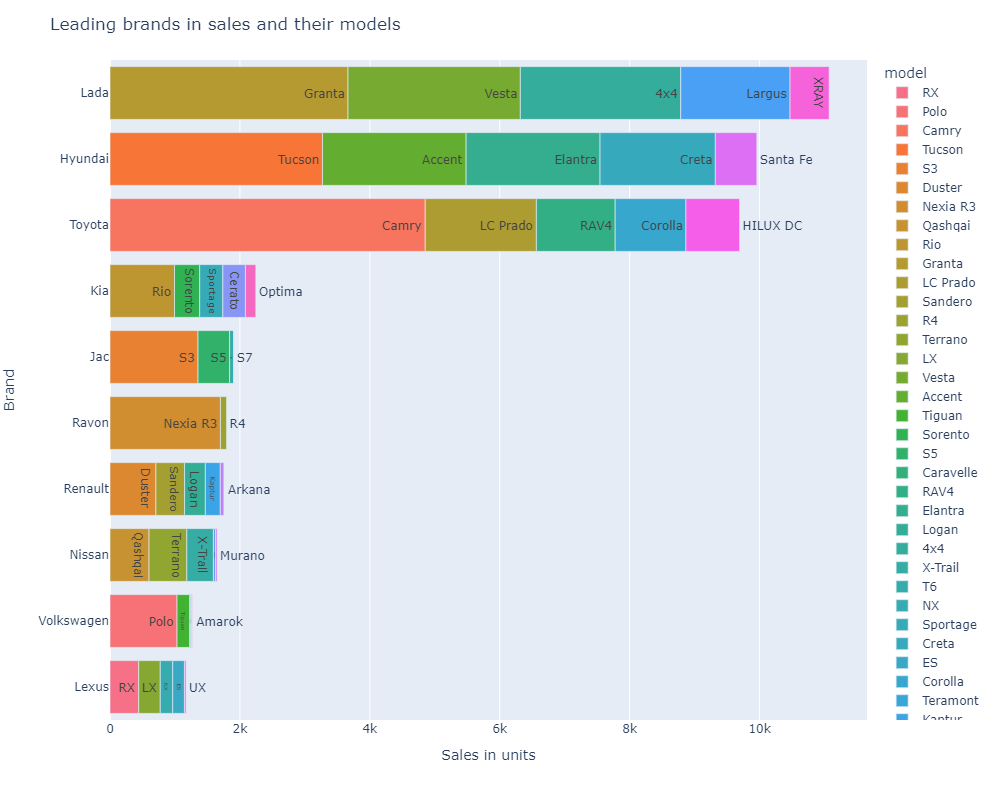

**Conclusion: we see that the market leader in sales in Lada units sells the best Granta and Vesta models, Toyota - Camry and LC Prado, and Hyundai - Tucson, Accent and Elantra.**

#### *Let's analyze car sales in dollars by brand - model*

**We will consider only the top 10 brands by sales**

In [44]:
brands_sales = light_vehicles.loc[light_vehicles['brand'].isin(best_brands_light)].pivot_table(index=['brand', 'model'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()
brands_sales.head(20)

,brand,model,sell_price_usd
0,BMW,3 series,122712.0
1,BMW,5 series,2234831.0
2,BMW,6 series,53491.0
3,BMW,7 series,857866.0
4,BMW,8 series,132584.0
5,BMW,X1,426333.0
6,BMW,X2,436982.0
7,BMW,X3,2238768.0
8,BMW,X4,1051590.0
9,BMW,X5,11760406.0


**Since there are a lot of models, we will rank all models within each brand by sales and visualize only the top 5 models of each brand.**

In [45]:
brands_sales["rank"] = brands_sales.groupby("brand")["sell_price_usd"].rank(ascending=False)

In [46]:
unique_colors = sns.color_palette("husl", 50)

# Color conversion in the format '#RRGGBB'
marker_color = ['#%02x%02x%02x' % (int(r * 255), int(g * 255), int(b * 255)) for r, g, b in unique_colors]

fig = px.bar(brands_sales.query('rank < 6').sort_values(by='rank'),
             y='brand',
             x='sell_price_usd',
             color='model',
             color_discrete_sequence=marker_color,
            text='model')

# Настройка layout
fig.update_layout(
    title='Leading brands in sales and their models',
    xaxis_title='Sales in dollars',
    yaxis_title='Brand',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

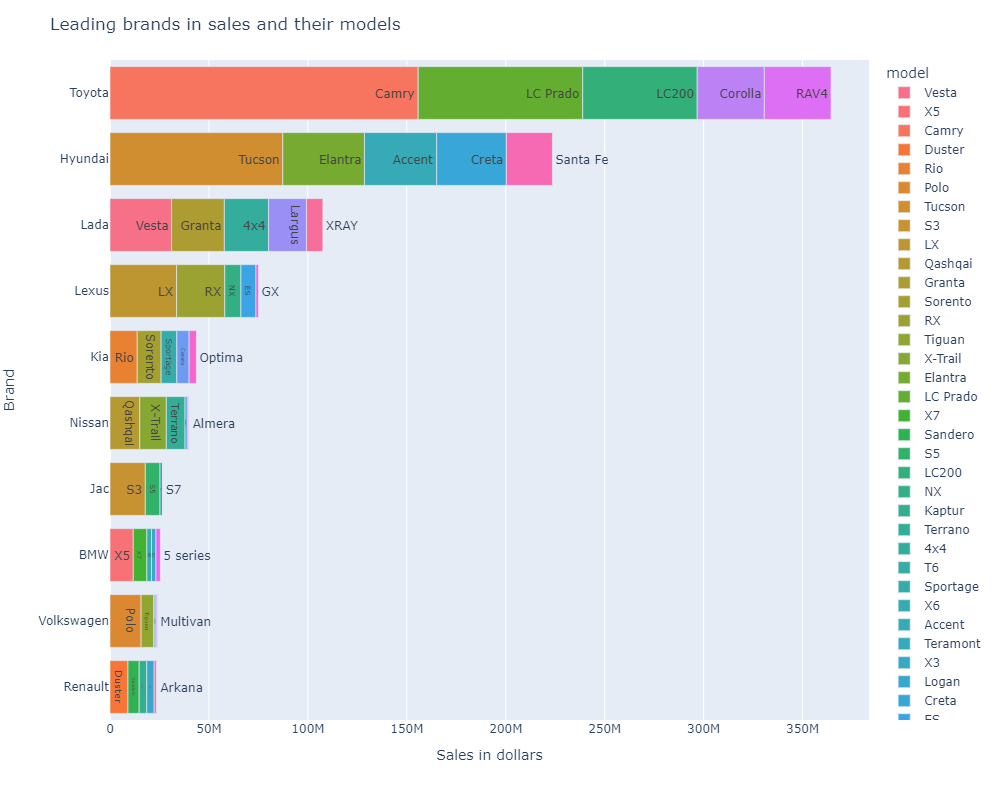

**Conclusion: we see that Toyota, the market leader in dollar sales, has the most profitable models: Camry and LC Prado, while Hyundai has Tucson, Accent and Elantra.**

#### *Let's analyze car sales in pieces in the context of the brand class of the car*

In [47]:
# Let's create a function that will build a bar chart based on the rank column
def function_plotly(table, x, y, color, color_discrete_map, text, title, xaxis_title):
    fig = px.bar(table.sort_values(by='rank'),
             y=y,
             x=x,
             color=color,
             color_discrete_map=color_discrete_map,
            text=text)
    
    fig.update_layout(
    title=title,
    xaxis_title=xaxis_title,
    yaxis_title=y,
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000)

    fig.show();

In [48]:
class_sales_light =\
light_vehicles.loc[light_vehicles['brand'].isin(best_brands_light)].pivot_table(index=['brand', 'new_class'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()

class_sales_light["rank"] = class_sales_light.groupby("brand")["sell_price_usd"].rank(ascending=False)

In [49]:
class_colors = {
    'D class': '#1f77b4',
    'E class': '#ff7f0e',
    'F class': '#2ca02c',
    'S class': '#d62728',
    'SUV class': '#9467bd',
    'B class': '#8c564b',
    'C class': '#e377c2',
    'M class': '#7f7f7f',
    'A class': '#bcbd22',
    'Pickups': '#17becf'
}

function_plotly(table=class_sales_light, x='sell_price_usd', y='brand', 
                color='new_class', color_discrete_map=class_colors, 
                text='sell_price_usd', 
                title='The leading brands in dollar sales and the classes of cars in which they are represented', 
                xaxis_title='Sales in dollars')

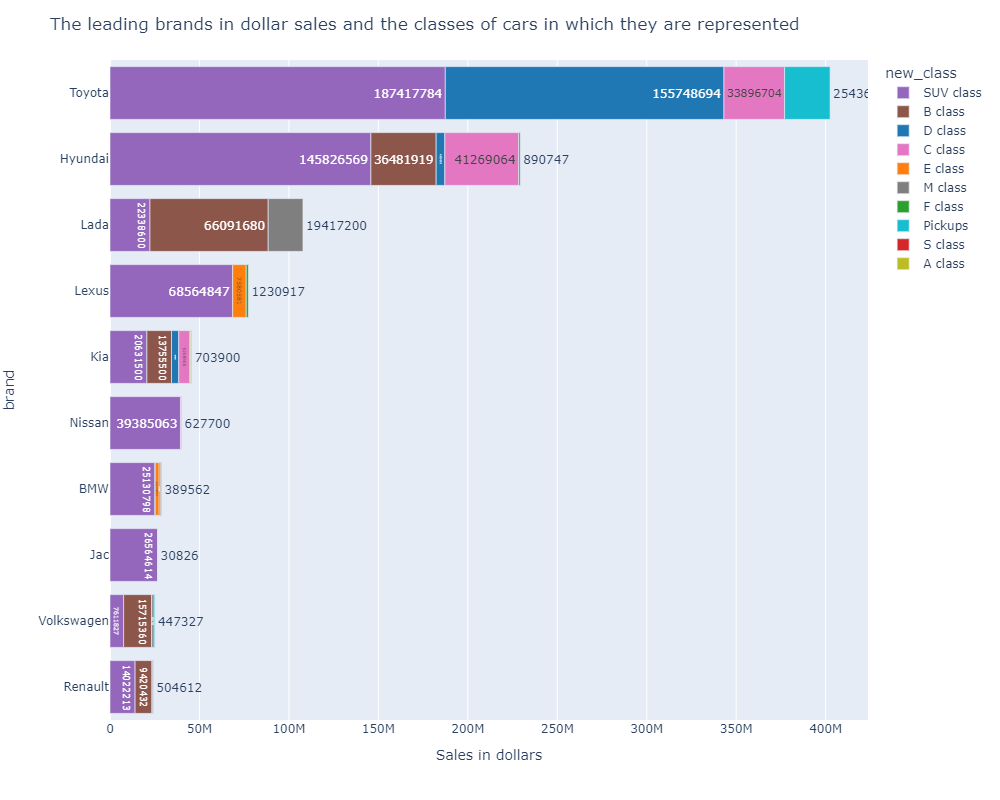

**Conclusion: we see that all market leaders have SUV class cars in their portfolio, and Toyota also sells D-class cars very well, which is not observed in other brands.**

#### *Let's analyze car sales in the context of brand - type drive*

In [50]:
# Let's create a function that will build a bar chart without taking into account the rank column
def function_plotly_without_rank(table, x, y, color, color_discrete_map, text, title, xaxis_title):
    fig = px.bar(table,
             y=y,
             x=x,
             color=color,
             color_discrete_map=color_discrete_map,
            text=text)
    
    fig.update_layout(
    title=title,
    xaxis_title=xaxis_title,
    yaxis_title=y,
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000)

    fig.show();

In [51]:
class_colors = {
    '4WD': '#e377c2',
    'FWD': '#7f7f7f',
    '2WD': '#bcbd22',
    'RWD': '#17becf'
}

car_drive_sales_light =\
light_vehicles.loc[light_vehicles['brand'].isin(best_brands_light)].pivot_table(index=['brand', 'drive_type'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()


function_plotly_without_rank(table=car_drive_sales_light,
                             x='sell_price_usd', y='brand',
                             color='drive_type', 
                             color_discrete_map=class_colors, 
                             text='sell_price_usd', 
                             title='Leading brands in sales and drive types', 
                             xaxis_title='Sales in dollars')

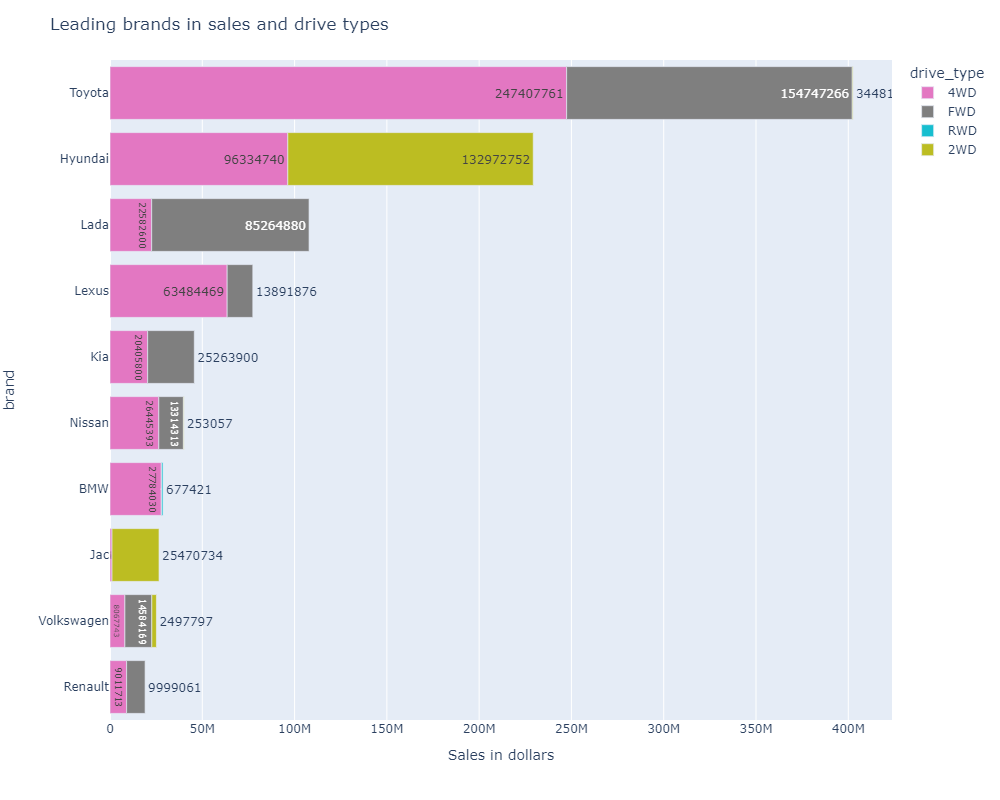

**Conclusion: we see that almost all market leaders have four-wheel drive and front-wheel drive cars in their portfolio, except for H, which, in addition to all-wheel drive, also has cars with plug-in full-wheel drive.**

#### *Let's analyze car sales in the context of brand - engine capacity*

In [52]:
engine_sales_light = light_vehicles.loc[light_vehicles['brand'].isin(best_brands_light)].pivot_table(index=['brand',
                                                                                               'engine_type'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()
engine_sales_light["rank"] = engine_sales_light.groupby("brand")["sell_price_usd"].rank(ascending=False)

In [53]:
tones_palette = {'small class (from 1.2 to 1.8 liters)': 'blue', 
                 'middle class (from 1.8 to 3.5 liters)': 'orange', 
                 'large class (from 3.5 to 6 liters)': 'red',
                 'especially large class (over 6 liters)': 'green', 
                 'especially small class (up to 1.2 liters)': 'purple'}

function_plotly(table=engine_sales_light, x='sell_price_usd', y='brand', 
                color='engine_type', 
                color_discrete_map=tones_palette, 
                text='sell_price_usd', 
                title='Leading brands in sales and engine displacement types', 
                xaxis_title='Sales in dollars')

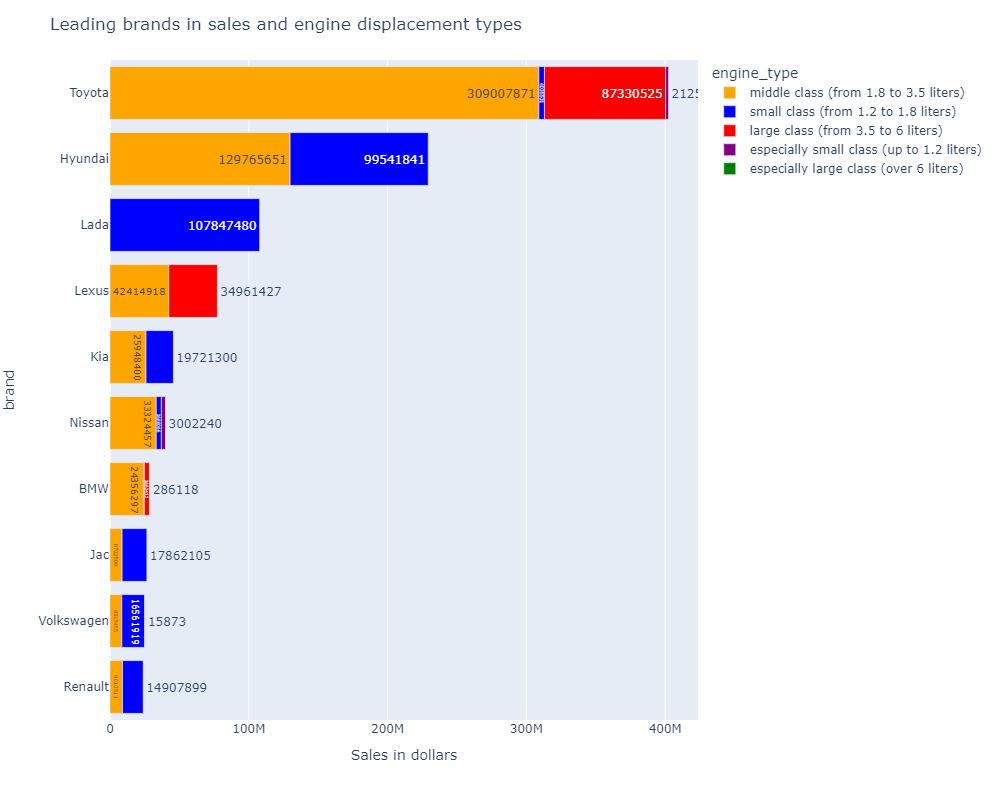

**Conclusion: we see that almost all market leaders, except Lada, Renault, Jac, Volkswagen, have cars with an average engine displacement class in their portfolio. There is also a noticeable difference in the approach of the market leaders Toyota and Hyundai - Toyota also has cars with a large engine class, and Hyundai with a small one. Lada specializes only in cars with a small class of engines.**

### Let's analyze sales by region

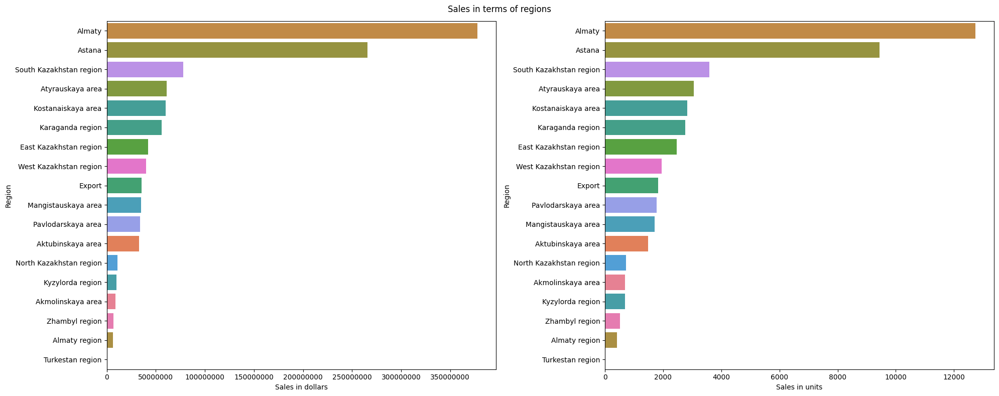

In [54]:
region_sales = light_vehicles.groupby('state', as_index=False)['sell_price_usd'].agg('sum')
region_sales_count = light_vehicles.groupby('state', as_index=False)['quantity'].agg('sum')

region_names = region_sales['state'].unique()
region_colors = sns.color_palette("husl", n_colors=len(region_names))

region_color_dict = dict(zip(region_names, region_colors))


plt.figure(figsize=(20, 8))
plt.suptitle('Sales in terms of regions')

ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "state", x='sell_price_usd',
                 data =region_sales.sort_values(by='sell_price_usd', ascending=False), palette=region_color_dict)
plt.xlabel('Sales in dollars')
plt.ylabel('Region')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "state", x='quantity',
                 data =region_sales_count.sort_values(by='quantity', ascending=False), palette=region_color_dict)
plt.xlabel('Sales in units')
plt.ylabel('Region')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show();

**Conclusion: we see that almost all sales take place in the two largest cities - Almaty and Astana, which is logical.**

#### *Let's analyze sales by region in the context of brands*

In [55]:
region_brands_sales_light = light_vehicles.pivot_table(index=['state', 'brand'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()

region_brands_sales_light["rank"] = region_brands_sales_light.groupby("state")["sell_price_usd"].rank(ascending=False)

fig = px.bar(region_brands_sales_light.query('rank < 6').sort_values(by='rank'),
             y='state',
             x='sell_price_usd',
             color='brand',
            text='sell_price_usd')

fig.update_layout(
    title='Regions and brands are the leaders in sales',
    xaxis_title='Sales in dollars',
    yaxis_title='Region',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

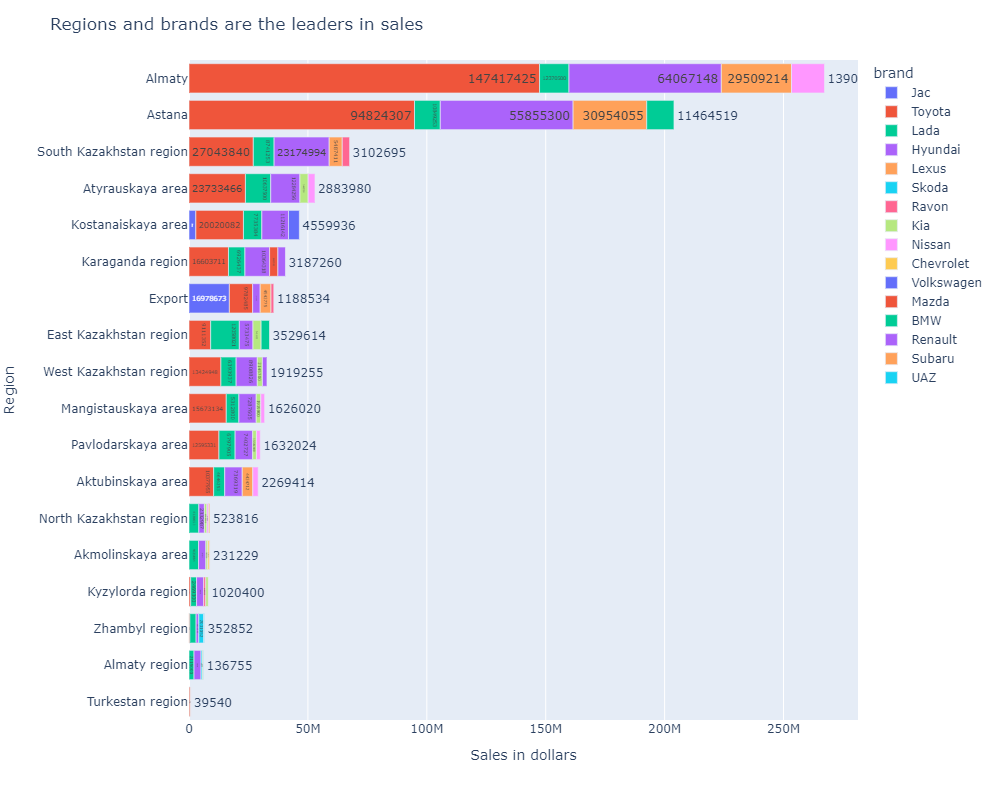

**Conclusion: we see that Toyota and Hyundai are the sales leaders in almost all regions, which is logical. The differences between Astana and Almaty are that in Astana, BMW is included in the list of top brands, but Nissan is not included and vice versa.**

#### *Let's analyze sales by region in terms of engine volumes*

In [56]:
region_engine_sales = light_vehicles.pivot_table(index=['state', 'engine_type'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()
region_engine_sales = region_engine_sales.query("state in ['Astana', 'Almaty']")
region_engine_sales

,state,engine_type,sell_price_usd
8,Almaty,especially large class (over 6 liters),7358286.0
9,Almaty,especially small class (up to 1.2 liters),2229491.0
10,Almaty,large class (from 3.5 to 6 liters),64292114.0
11,Almaty,middle class (from 1.8 to 3.5 liters),233720382.0
12,Almaty,small class (from 1.2 to 1.8 liters),69700956.0
15,Astana,especially large class (over 6 liters),21072.0
16,Astana,especially small class (up to 1.2 liters),1090757.0
17,Astana,large class (from 3.5 to 6 liters),38638118.0
18,Astana,middle class (from 1.8 to 3.5 liters),170914432.0
19,Astana,small class (from 1.2 to 1.8 liters),54124073.0


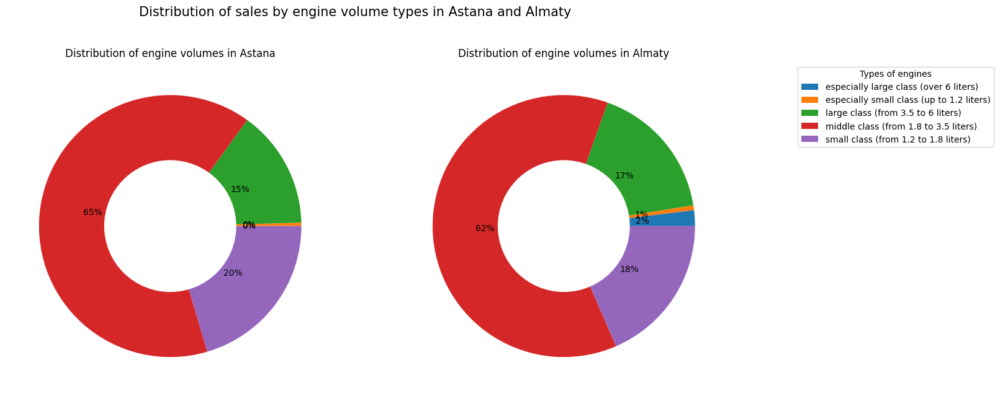

In [57]:
values_1 = region_engine_sales.query('state == "Astana"')['sell_price_usd'].tolist()
labels_1 = region_engine_sales.query('state == "Astana"')['engine_type'].tolist()

values_2 = region_engine_sales.query('state == "Almaty"')['sell_price_usd'].tolist()
labels_2 = region_engine_sales.query('state == "Almaty"')['engine_type'].tolist()

plt.figure(figsize=(15, 10))
plt.suptitle('Distribution of sales by engine volume types in Astana and Almaty', fontsize=15, y=0.85)

plt.subplot(1, 2, 1)
plt.pie(values_1, autopct='%.0f%%', labels=None)
plt.title('Distribution of engine volumes in Astana')
circle_1 = plt.Circle((0, 0), 0.5, color='white')
p = plt.gcf()
p.gca().add_artist(circle_1)

plt.subplot(1, 2, 2)
plt.pie(values_2, autopct='%.0f%%', labels=None)
plt.title('Distribution of engine volumes in Almaty')
circle_2 = plt.Circle((0, 0), 0.5, color='white')
p = plt.gcf()
p.gca().add_artist(circle_2)

plt.legend(labels_1, title='Types of engines', loc='upper left', bbox_to_anchor=(1.2, 1))

plt.show()

**Conclusion: we see that there is no fundamental difference between cities, sales of cars with middle-class engines dominate everywhere.**

### Let's test the hypothesis that the cost of a car depends on the level of development of the region (average salary in the region)

In [58]:
# Let's calculate the median cost of a car for each region
price_light = light_vehicles.pivot_table(index='state',values='price_usd', aggfunc='median').reset_index()

In [59]:
# The task was accompanied by data on the average salary in the regions of Kazakhstan for 2019
salary_dict = {
    'Almaty': 224158,
    'Astana': 226796,
    'East Kazakhstan region': 162182,
    'West Kazakhstan region': 183914,
    'Kostanaiskaya area': 145890,
    'Pavlodarskaya area': 160670,
    'South Kazakhstan region': 110254,
    'Mangistauskaya area': 294099,
    'Atyrauskaya area': 351103,
    'Aktubinskaya area': 156595,
    'Karaganda region': 172239,
    'North Kazakhstan region': 130233,
    'Akmolinskaya area': 140272,
    'Kyzylorda region': 152085,
    'Zhambyl region': 127043,
    'Turkestan region': 123853,
    'Almaty region': 136212
}

salary = pd.DataFrame(list(salary_dict.items()), columns=['state', 'salary'])

In [60]:
price_light_salary = pd.merge(price_light, salary, left_on='state', right_on='state', how='left')
price_light_salary = price_light_salary.query('state != "Export"')
price_light_salary

,state,price_usd,salary
0,Akmolinskaya area,13800.000,140272.0
1,Aktubinskaya area,23237.035,156595.0
2,Almaty,28161.220,224158.0
3,Almaty region,18153.220,136212.0
4,Astana,26805.040,226796.0
5,Atyrauskaya area,24083.740,351103.0
6,East Kazakhstan region,18130.920,162182.0
8,Karaganda region,20081.635,172239.0
9,Kostanaiskaya area,21008.680,145890.0
10,Kyzylorda region,13800.000,152085.0


**Let's check the correlation between the cost of a car and the average salary in the region**

To do this, we will use the Pearson correlation coefficient. It helps to determine the presence of a linear relationship between the values and takes values from -1 to 1. The closer the Pearson correlation coefficient is to the extreme values of 1 or -1, the closer the linear relationship. If the value is close to zero, it means that the linear relationship is weak or absent altogether.

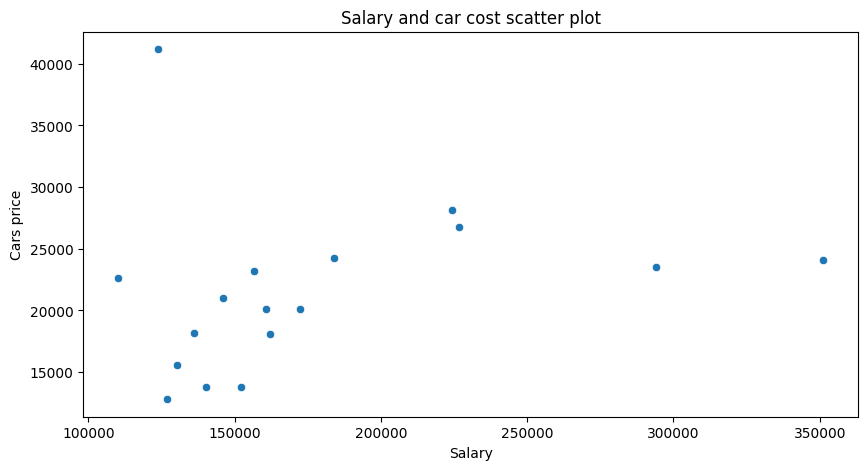

In [61]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.scatterplot(y='price_usd', x='salary', data=price_light_salary)
ax.grid(False)
plt.title('Salary and car cost scatter plot')
plt.xlabel('Salary')
plt.ylabel('Cars price')
plt.show()

In [62]:
# To check, let's calculate the correlation coefficient
print(price_light_salary['price_usd'].corr(price_light_salary['salary']))

0.2208294994959406


**Conclusion: we see that there is no connection between the price of a car and the average salary in the relevant region.**

### Let's analyze the sales of car centers

#### *Let's analyze the total sales of car centers*

In [63]:
dealer_light = light_vehicles.pivot_table(index='company',values='sell_price_usd', aggfunc='sum').reset_index()
dealer_count_light = light_vehicles.pivot_table(index='company',values='quantity', aggfunc='sum').reset_index()

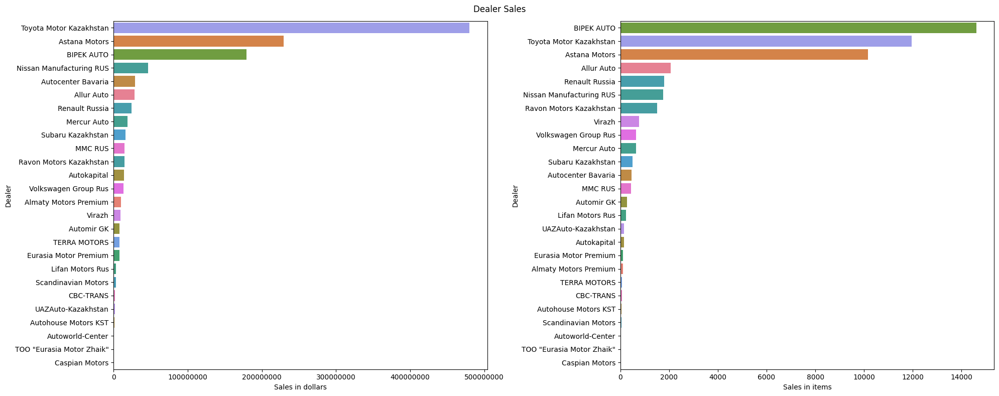

In [64]:
brands = dealer_light['company'].unique()
brand_colors = sns.color_palette("husl", n_colors=len(brands))

brand_color_dict = dict(zip(brands, brand_colors))

plt.figure(figsize=(20, 8))
plt.suptitle('Dealer Sales')
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "company", x='sell_price_usd',
                 data =dealer_light.sort_values(by='sell_price_usd', ascending=False), palette=brand_color_dict)
ax.grid(False)
plt.xlabel('Sales in dollars')
plt.ylabel('Dealer')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "company", x='quantity',
                 data =dealer_count_light.sort_values(by='quantity', ascending=False), palette=brand_color_dict)
ax.grid(False)
plt.xlabel('Sales in items')
plt.ylabel('Dealer')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show();

**Conclusion: we see that three companies dominate the market: Astana Motors , Toyota Motor Kazakhstan, and BIPEK AUTO.**

#### *Let's identify the top 10 dealers by sales in dollars and calculate their market share*

In [65]:
# Let's keep the names of the brands with the best sales in a separate list
best_dealers_light = light_vehicles.pivot_table(index='company',
                                          values='sell_price_usd',
                                          aggfunc='sum').reset_index().nlargest(10, 'sell_price_usd')['company'].tolist()

In [66]:
# We will rename all dealers that are not related to the tops to "Others"
dealer_light.loc[~dealer_light['company'].isin(best_dealers_light), 'company'] = "Others"

In [67]:
pastel_colors = px.colors.qualitative.Pastel

fig = go.Figure(data=[go.Pie(labels=dealer_light['company'],
                            values=dealer_light['sell_price_usd'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "Dealers are the leaders of the light vehicles market"},
                  height=800,
                  width=800)

fig.show()

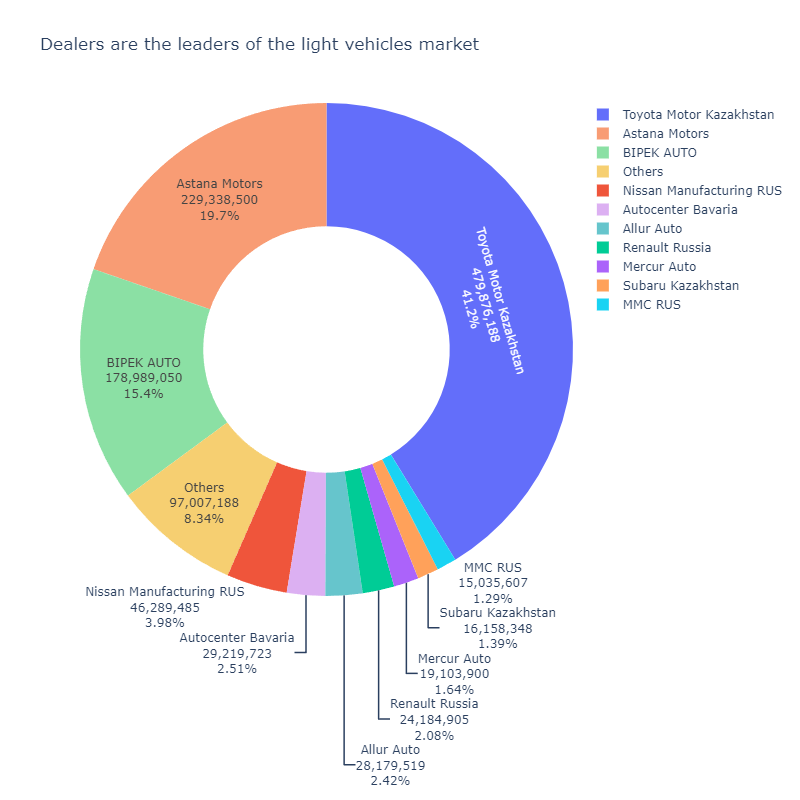

**Conclusion: Toyota Motor Kazakhstan is the undisputed leader of the light vehicles market.**

#### *Let's analyze the sales dynamics of the top 10 dealers*

In [68]:
best = light_vehicles.loc[light_vehicles['company'].isin(best_dealers_light)]

best = best.pivot_table(index=['month', 'company'], values='sell_price_usd',
                                              aggfunc='sum').reset_index()

best = order_months(best , 'month')

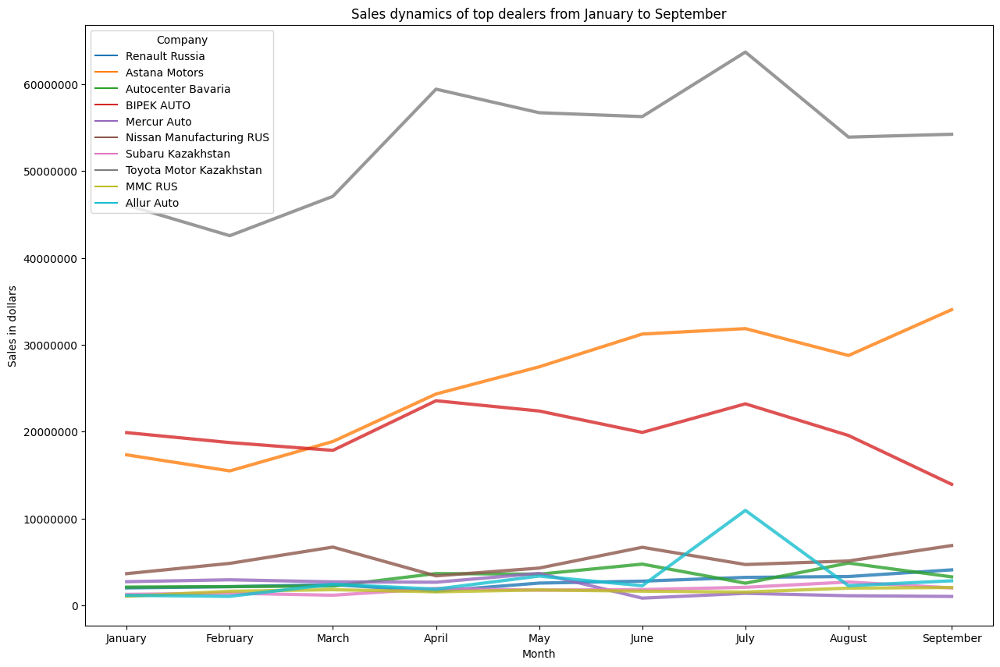

In [69]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.lineplot(y='sell_price_usd', x='month', data=best, hue='company', linewidth=3, alpha=0.8)
plt.xlabel('Month')
plt.ylabel('Sales in dollars')
plt.title('Sales dynamics of top dealers from January to September')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Company')
ax.grid(False)
plt.show()

**Conclusion: Most dealers have peak sales in July and April.**

#### *Проанализируем какими брендами занимаются дилеры*

In [70]:
brand_dealer_light = light_vehicles.pivot_table(index=['brand', 'company'], values='sell_price_usd',
                                              aggfunc='sum').reset_index()

**Visualize the received data. The volume of the circle is equal to the volume of sales: the larger the circle, the higher the sales**

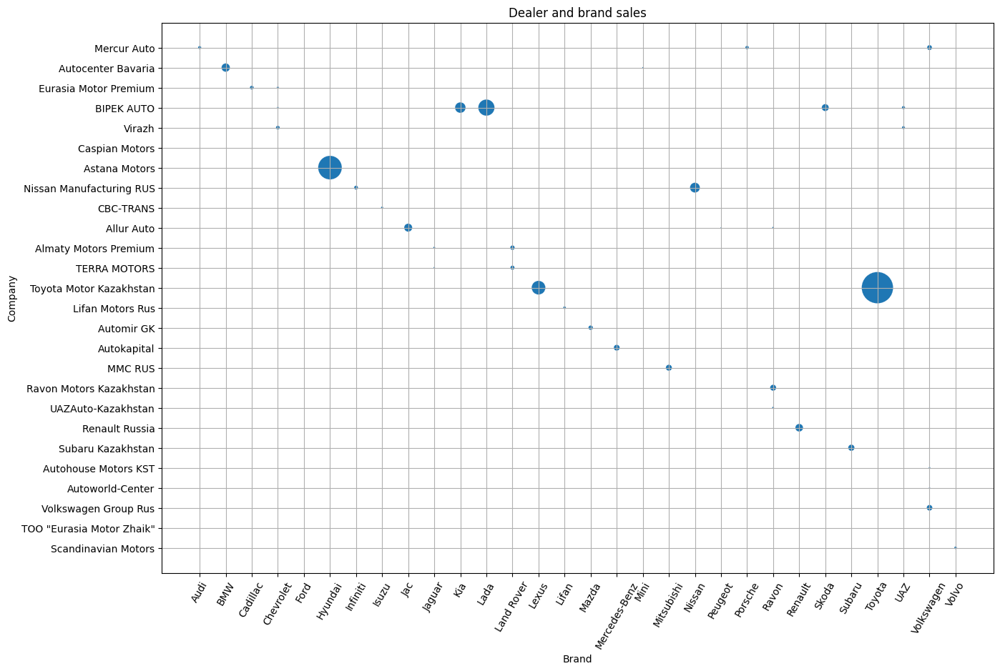

In [71]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.scatterplot(x='brand', y='company', data=brand_dealer_light , size='sell_price_usd', legend=False, sizes=(0, 1000))
plt.xlabel('Brand')
plt.ylabel('Company')
plt.title('Dealer and brand sales')
plt.xticks(rotation=60)
ax.grid(True)
plt.show()

**Conclusion: we see three main players in the market and the brands through which they develop their sales**:
- Toyota Motor Kazakhstan - are engaged in Toyota and Lexus brands
- Astana Motors - engaged in the Hyundai brand
- BIPEK AUTO - deals with Kia, Lada and Renault brands

#### *Let's analyze in which regions the dealers listed in the table trade*

In [72]:
region_dealer_light = light_vehicles.pivot_table(index=['state', 'company'], values='sell_price_usd',
                                              aggfunc='sum').reset_index()

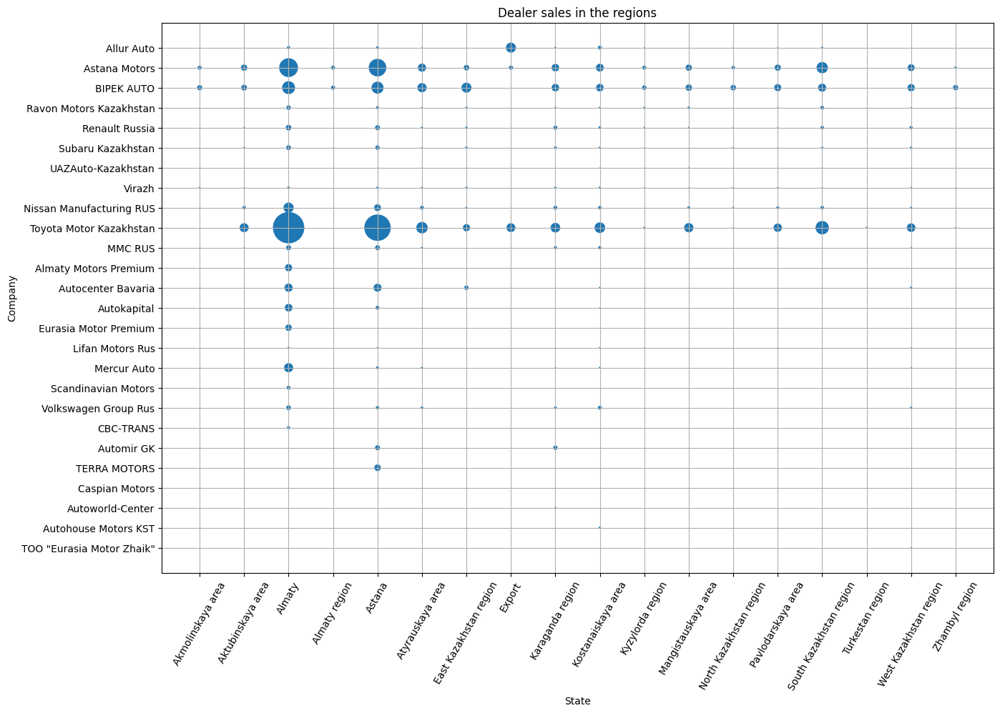

In [73]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.scatterplot(x='state', y='company', data=region_dealer_light, size='sell_price_usd', legend=False, sizes=(0, 1000))
plt.xlabel('State')
plt.ylabel('Company')
plt.title('Dealer sales in the regions')
plt.xticks(rotation=60)
ax.grid(True)
plt.show()

**Conclusion: we see that all three major players in the market sell cars all over the country and have the largest sales in Almaty and Astana, which is logical.
Accordingly, Almaty and Astana are the most saturated regions in terms of dealer representation.**

### Let's highlight the leading models in the market

In [74]:
models = light_vehicles.pivot_table(index='new_model', values='sell_price_usd',
                                              aggfunc='sum').reset_index()
models = models.sort_values(by='sell_price_usd', ascending=False).head(10)
models

,new_model,sell_price_usd
150,Toyota Camry,155748694.0
40,Hyundai Tucson,87315626.0
154,Toyota LC Prado,83134048.0
155,Toyota LC200,57893775.0
36,Hyundai Elantra,41269064.0
34,Hyundai Accent,36481919.0
35,Hyundai Creta,35222303.0
151,Toyota Corolla,33896704.0
156,Toyota RAV4,33725122.0
83,Lexus LX,33640552.0


In [75]:
models_count = light_vehicles.pivot_table(index='new_model', values='quantity',
                                              aggfunc='sum').reset_index()
models_count = models_count.sort_values(by='quantity', ascending=False).head(10)
models_count

,new_model,quantity
150,Toyota Camry,4853.0
68,Lada Granta,3664.0
40,Hyundai Tucson,3271.0
71,Lada Vesta,2653.0
67,Lada 4x4,2469.0
34,Hyundai Accent,2211.0
36,Hyundai Elantra,2062.0
35,Hyundai Creta,1775.0
154,Toyota LC Prado,1711.0
131,Ravon Nexia R3,1700.0


In [76]:
labels_1 = models['new_model'].tolist()
labels_2 = models_count['new_model'].tolist()

# Получение списка уникальных компаний
unique_models = pd.Series(list(set(labels_1) | set(labels_2)))

# Создание словаря цветов только для уникальных компаний
colors = sns.color_palette("husl", n_colors=len(unique_models))
models_color_dict = dict(zip(unique_models, colors))

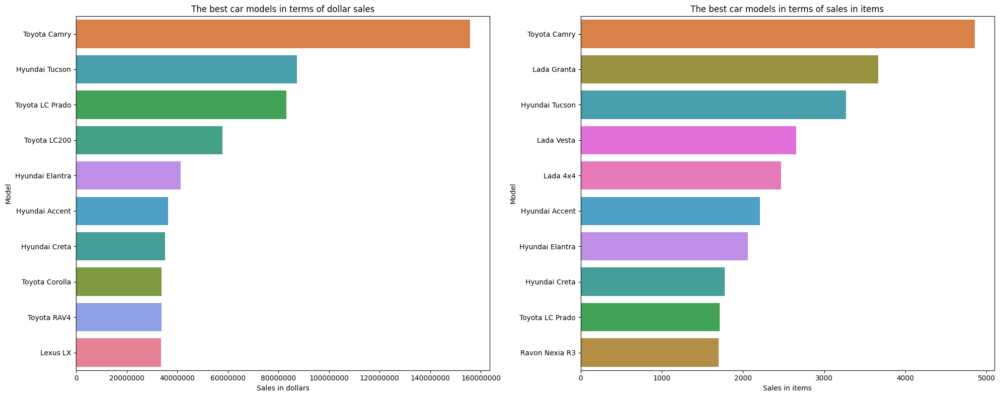

In [77]:
plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "new_model", x='sell_price_usd',
                 data =models.sort_values(by='sell_price_usd', ascending=False), palette=models_color_dict)
ax.grid(False)
plt.xlabel('Sales in dollars')
plt.ylabel('Model')
plt.title('The best car models in terms of dollar sales')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "new_model", x='quantity',
                 data = models_count.sort_values(by='quantity', ascending=False), palette=models_color_dict)
ax.grid(False)
plt.xlabel('Sales in items')
plt.ylabel('Model')
plt.title('The best car models in terms of sales in items')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show();

**Conclusion: Toyota Camry is the undisputed leader of the light vehicles market in terms of sales in dollars and pieces. Lada models have been added to the leaders in sales in units, otherwise Toyota and Hyundai models are still in the lead, which is logical.**

#### *Let's analyze the cost of passenger car brands*

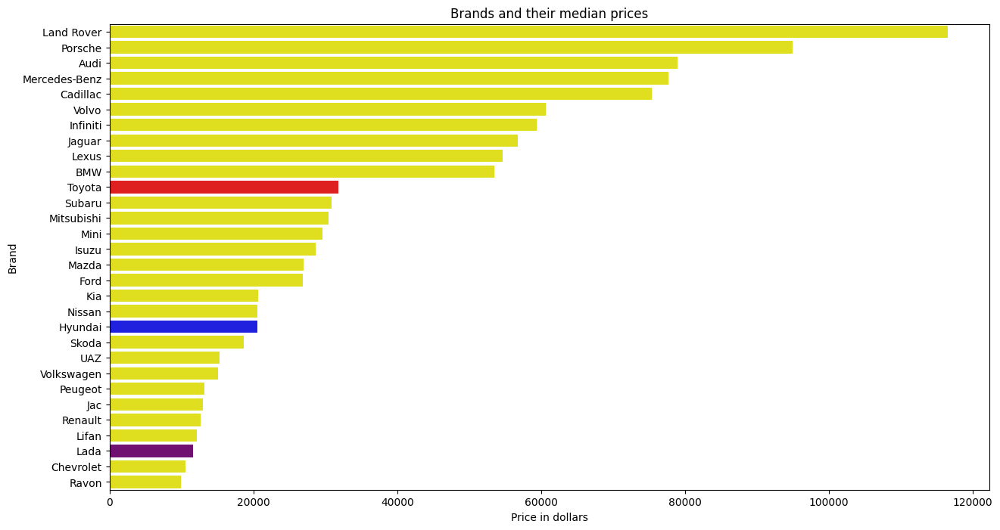

In [78]:
price_light = light_vehicles.pivot_table(index='brand', values='price_usd', aggfunc='median').reset_index()

brand_palette = {brand: 'yellow' for brand in price_light['brand'].unique()}
brand_palette['Toyota'] = 'red'
brand_palette['Hyundai'] = 'blue'
brand_palette['Lada'] = 'purple'

fig, ax = plt.subplots(figsize=(15, 8))
ax = sns.barplot(y="brand", x='price_usd',
                 data=price_light.sort_values(by='price_usd', ascending=False),
                 palette=brand_palette)

ax.grid(False)
plt.xlabel('Price in dollars')
plt.ylabel('Brand')
plt.title('Brands and their median prices')
plt.ticklabel_format(useOffset=False, style='plain', axis='x')
plt.show();

**Conclusion: we see that Lada is one of the market leaders, including due to its relatively low price. Toyota, Hyundai are rather moderate-priced brands. It should also be noted that such a comparison is quite conditional, since each brand deals with its own classes of cars, which differ significantly from each other in terms of specifics and price.**

### Interim conclusion: at this stage, we have conducted an analysis of the passenger car market. We were able to establish the following:
1. the actual capacity of the light vehicles market in Kazakhstan in 2019 as of September is 48,629 units and 1,163,382,320 dollars, respectively.
2. sales peaked in July, there were practically no sales in the first quarter, which is logical due to the New Year holidays and the beginning of the year in general.
3. the market leader in sales in Lada units sells the best Granta and Vesta models, Toyota - Camry and LC Prado, and Hyundai - Tucson, Accent and Elantra.
4. Toyota, the market leader in dollar sales, has the most profitable models: Camry and LC Prado, while Hyundai has Tucson, Accent and Elantra.
5. all classes behave approximately the same in terms of sales dynamics, all of them have been growing since spring with a peak in July. The SUV class is the undisputed market leader.
6. all market leaders have SUV class cars in their portfolio, and Toyota also sells D-class cars very well, which is not observed in other brands.
7. almost all market leaders have four-wheel drive and front-wheel drive cars in their portfolio, except for H, which, in addition to all-wheel drive, also has cars with plug-in full-wheel drive.
8. almost all market leaders, except Lada, Renault, Jac, Volkswagen, have cars with an average engine displacement class in their portfolio. There is also a noticeable difference in the approach of the market leaders Toyota and Hyundai - Toyota also has cars with a large engine class, and Hyundai with a small one. Lada specializes only in cars with a small class of engines.
9. almost all sales take place in the two largest cities - Almaty and Astana, which is logical.
10. Toyota and Hyundai are the sales leaders in almost all regions, which is logical. The differences between Astana and Almaty are that in Astana, BMW is included in the list of top brands, but Nissan is not included and vice versa.
11. there is no fundamental difference between cities, sales of cars with middle-class engines dominate everywhere.
12. there is no connection between the price of a car and the average salary in the relevant region.
13. three companies dominate the market: Astana Motors , Toyota Motor Kazakhstan, and BIPEK AUTO.
14. Toyota Motor Kazakhstan is the undisputed leader of the light vehicles market.
15. Most dealers have peak sales in July and April.
16. three main players in the market and the brands through which they develop their sales:
- Toyota Motor Kazakhstan - are engaged in Toyota and Lexus brands
- Astana Motors - engaged in the Hyundai brand
- BIPEK AUTO - deals with Kia, Lada and Renault brands
17. all three major players in the market sell cars all over the country and have the largest sales in Almaty and Astana, which is logical. Accordingly, Almaty and Astana are the most saturated regions in terms of dealer representation.
18. Toyota Camry is the undisputed leader of the light vehicles market in terms of sales in dollars and pieces. Lada models have been added to the leaders in sales in units, otherwise Toyota and Hyundai models are still in the lead, which is logical.
19. Lada is one of the market leaders, including due to its relatively low price. Toyota, Hyundai are rather moderate-priced brands. It should also be noted that such a comparison is quite conditional, since each brand deals with its own classes of cars, which differ significantly from each other in terms of specifics and price.

## Step 4. Commercial Vehicle Market Analysis

### Let's calculate the capacity of the car market: in monetary and quantitative terms

In [79]:
commercial_vehicles = data_english.query('new_segment == "Commercial vehicle"')

In [80]:
commercial_vehicles['quantity'].sum()

5246.0

In [81]:
commercial_vehicles['sell_price_usd'].sum()

185811897.0

**Conclusion: the actual capacity of the commercial vehicle market in Kazakhstan in 2019 as of September is 5,246 units and 185,811,884 dollars, respectively.**

### We will find the leading brands in the car market

In [82]:
top_brands_commercial = commercial_vehicles.pivot_table(index='brand',
                                              values='sell_price_usd',
                                              aggfunc='sum').reset_index()

best_brands_commercial = commercial_vehicles.pivot_table(index='brand',
                                              values='sell_price_usd',
                                              aggfunc='sum').reset_index().nlargest(10, 'sell_price_usd')['brand'].tolist()

top_brands_commercial.loc[~top_brands_commercial['brand'].isin(best_brands_commercial), 'brand'] = "Others"

In [83]:
fig = go.Figure(data=[go.Pie(labels=top_brands_commercial['brand'],
                            values=top_brands_commercial['sell_price_usd'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "The brands are the leaders among commercial vehicles in sales in dollars"},
                  height=800,
                  width=800)

fig.show()

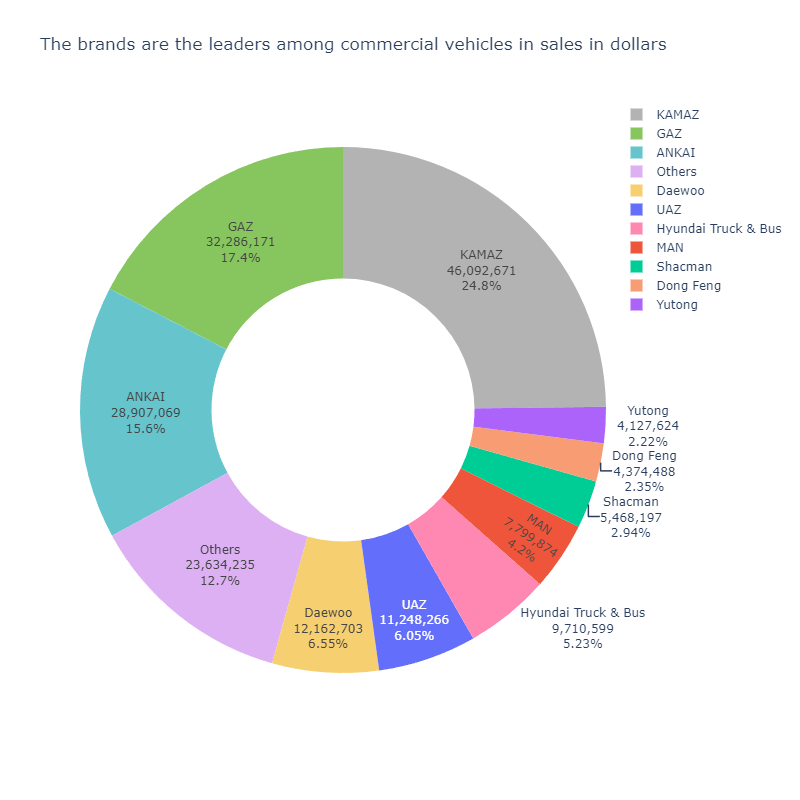

In [84]:
top_brands_count_commercial = commercial_vehicles.pivot_table(index='brand',
                                              values='quantity',
                                              aggfunc='sum').reset_index()

best_brands_count_commercial = commercial_vehicles.pivot_table(index='brand',
                                              values='quantity',
                                              aggfunc='sum').reset_index().nlargest(10, 'quantity')['brand'].tolist()

top_brands_count_commercial.loc[~top_brands_count_commercial['brand'].isin(best_brands_count_commercial), 'brand'] = "Others"

In [85]:
fig = go.Figure(data=[go.Pie(labels=top_brands_count_commercial['brand'],
                            values=top_brands_count_commercial['quantity'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "The brands are the leaders among commercial vehicles in terms of sales in units"},
                  height=800,
                  width=800)

fig.show()

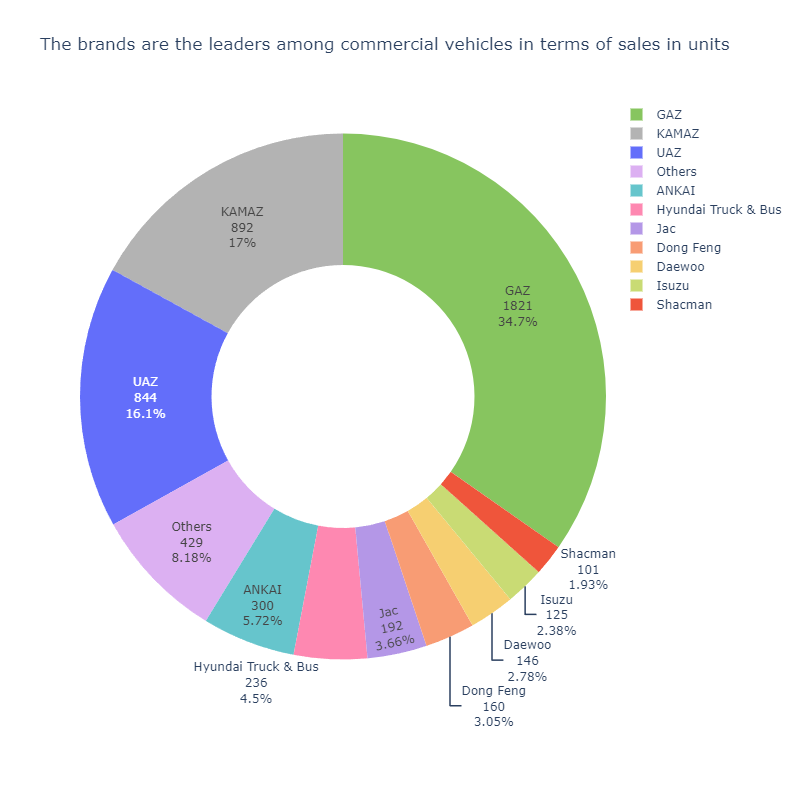

**Conclusion: GAZ and KAMAZ dominate the commercial vehicle market, both in terms of sales in units and in dollars.**

### Let's analyze the dynamics of the market: general and by segment

#### *General market dynamics*

In [86]:
dynamic_total = commercial_vehicles.pivot_table(index='month',
                                              values=['sell_price_usd', 'quantity'],
                                              aggfunc='sum').reset_index()

dynamic_total = order_months(dynamic_total, 'month')

dynamic_total

,month,quantity,sell_price_usd
3,January,354.0,10461058.0
2,February,368.0,10240291.0
6,March,530.0,18381536.0
0,April,517.0,13246767.0
7,May,750.0,27076066.0
5,June,549.0,18424548.0
4,July,870.0,46020985.0
1,August,653.0,19544172.0
8,September,655.0,22416474.0


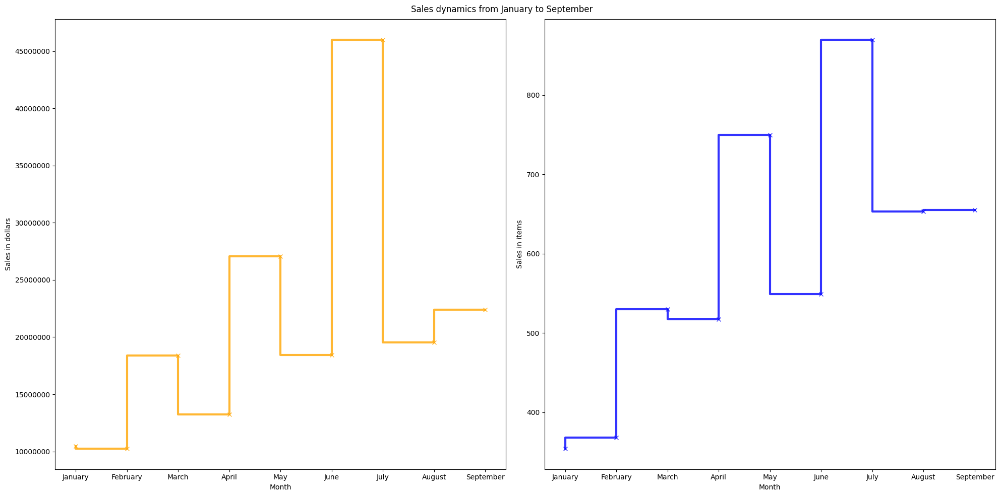

In [87]:
plt.figure(figsize=(20, 10))
plt.suptitle('Sales dynamics from January to September')

ax1 = plt.subplot(1, 2, 1)
ax1 = plt.step(x=dynamic_total['month'], y=dynamic_total['sell_price_usd'], marker='x', linewidth=3, alpha=0.8, color='orange')
plt.xlabel('Month')
plt.ylabel('Sales in dollars')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')


ax2 = plt.subplot(1, 2, 2)
ax2 = plt.step(x=dynamic_total['month'], y=dynamic_total['quantity'], marker='x', linewidth=3, alpha=0.8, color='blue')
plt.xlabel('Month')
plt.ylabel('Sales in items')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')

plt.tight_layout()
plt.show()

**Conclusion: the dynamics of sales in units and dollars are generally the same - there is an increase in sales with a peak in July and a subsequent decrease in August and September.**

#### *Market dynamics by car class*

In [88]:
dynamic_segment_commercial = commercial_vehicles.pivot_table(index=['month', 'new_class'],
                                              values=['sell_price_usd', 'quantity'],
                                              aggfunc='sum').reset_index()

dynamic_segment_commercial = order_months(dynamic_segment_commercial, 'month')

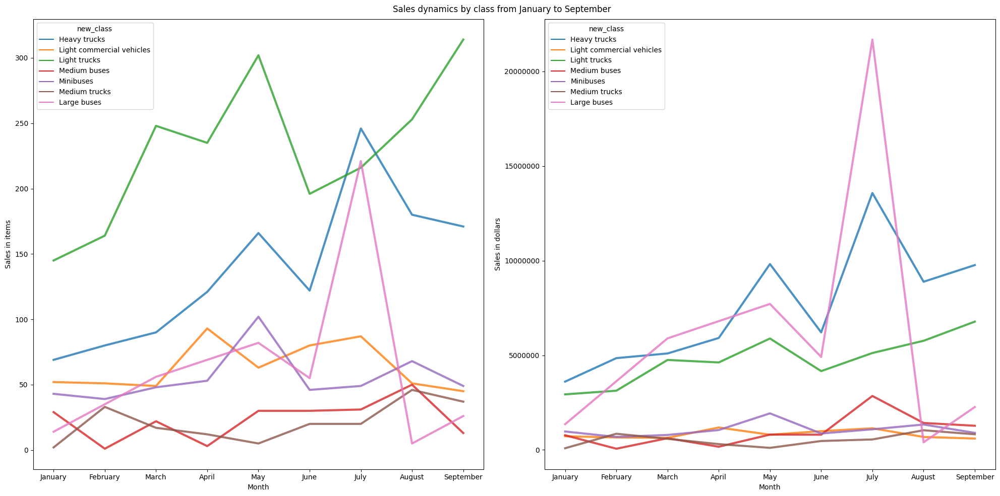

In [89]:
plt.figure(figsize=(20, 10))
plt.suptitle('Sales dynamics by class from January to September')

ax1 = plt.subplot(1, 2, 1)
ax1 = sns.lineplot(y='quantity', x='month', data=dynamic_segment_commercial, hue='new_class', linewidth=3, alpha=0.8)
plt.xlabel('Month')
plt.ylabel('Sales in items')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='new_class')

ax2 = plt.subplot(1, 2, 2)
ax2 = sns.lineplot(y='sell_price_usd', x='month', data=dynamic_segment_commercial, hue='new_class', linewidth=3, alpha=0.8)
plt.xlabel('Month')
plt.ylabel('Sales in dollars')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='new_class')

plt.tight_layout()
plt.show()

**Conclusion: we see that in July there was a sharp increase in sales of the large bus class, while low-tonnage and large-tonnage trucks show the most stable sales in units and dollars for the year.
In general, the market leaders are large buses, low-tonnage and large-tonnage trucks.**

### Let's analyze car sales by brand

#### *Let's analyze car sales in pieces in the context of brand - model*

**We will consider only the top 10 brands by sales**

In [90]:
brands_model_count_commercial = \
commercial_vehicles.loc[commercial_vehicles['brand'].isin(best_brands_count_commercial)].pivot_table(index=['brand', 'model'],
                                                                                               values='quantity',
                                                                                               aggfunc='sum').reset_index()

In [91]:
brands_model_count_commercial["rank"] = brands_model_count_commercial.groupby("brand")["quantity"].rank(ascending=False)

unique_colors = sns.color_palette("husl", 50)

# Преобразование цветов в формат '#RRGGBB'
marker_color = ['#%02x%02x%02x' % (int(r * 255), int(g * 255), int(b * 255)) for r, g, b in unique_colors]

fig = px.bar(brands_model_count_commercial.sort_values(by='rank'),
             y='brand',
             x='quantity',
             color='model',
             color_discrete_sequence=marker_color,
            text='model')

# Настройка layout
fig.update_layout(
    title='The leading brands in sales in pieces and their models',
    xaxis_title='Sales in items',
    yaxis_title='Brand',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

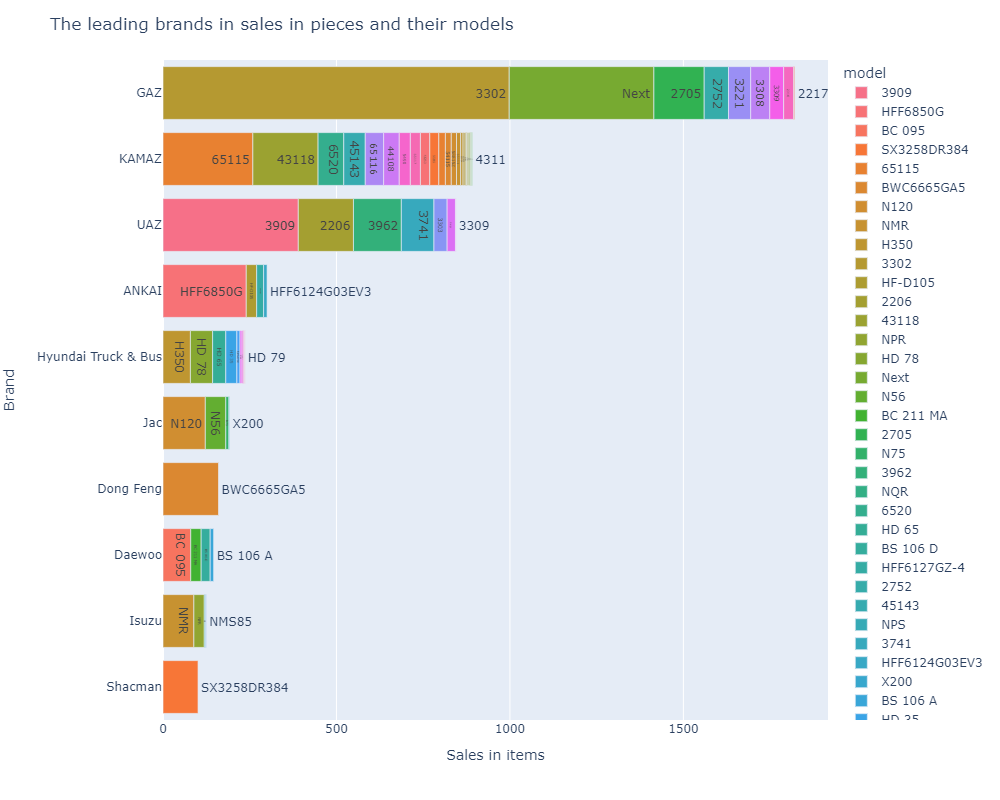

#### *Let's analyze car sales in dollars by brand - model*

In [92]:
brands_sales_commercial =\
commercial_vehicles.loc[commercial_vehicles['brand'].isin(best_brands_commercial)].pivot_table(index=['brand', 'model'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()

In [93]:
brands_sales_commercial["rank"] = brands_sales_commercial.groupby("brand")["sell_price_usd"].rank(ascending=False)

unique_colors = sns.color_palette("husl", 50)

# Преобразование цветов в формат '#RRGGBB'
marker_color = ['#%02x%02x%02x' % (int(r * 255), int(g * 255), int(b * 255)) for r, g, b in unique_colors]

fig = px.bar(brands_sales_commercial.sort_values(by='rank'),
             y='brand',
             x='sell_price_usd',
             color='model',
             color_discrete_sequence=marker_color,
            text='model')

fig.update_layout(
    title='Leading brands in dollar sales and their models',
    xaxis_title='Sales in dollars',
    yaxis_title='Brand',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

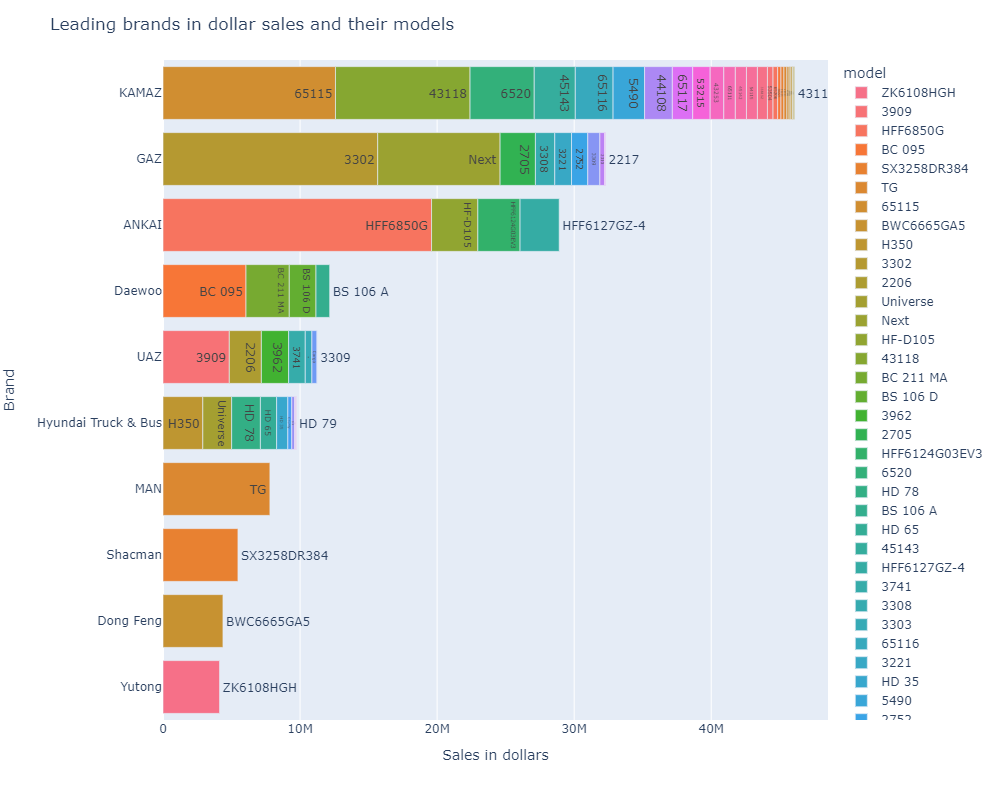

**Conclusion: GAZ's most popular models are 3302 and Next, Kamaz's 65115 and 43118. Also, one of the advantages of Kamaz, in my opinion, is its very wide range compared to other brands.**

#### *Let's analyze car sales in pieces in the context of the brand class of the car*

In [94]:
class_sales_count_commercial =\
commercial_vehicles.loc[commercial_vehicles['brand'].isin(best_brands_count_commercial)].pivot_table(index=['brand',
                                                                                                           'new_class'],
                                                                                                     values='quantity',
                                                                                                     aggfunc='sum').reset_index()

class_sales_count_commercial["rank"] = class_sales_count_commercial.groupby("brand")["quantity"].rank(ascending=False)

In [95]:
class_colors = {
    'Large buses': '#1f77b4',
    'Heavy trucks': '#ff7f0e',
    'Minibuses': '#2ca02c',
    'Light trucks': '#d62728',
    'Medium trucks': '#9467bd',
    'Medium buses': '#8c564b',
    'Light commercial vehicles': '#e377c2',
}

function_plotly(table=class_sales_count_commercial,
                             x='quantity', y='brand',
                             color='new_class', 
                             color_discrete_map=class_colors, 
                             text='quantity', 
                             title='Leading brands in sales and classes', 
                             xaxis_title='Sales in items')

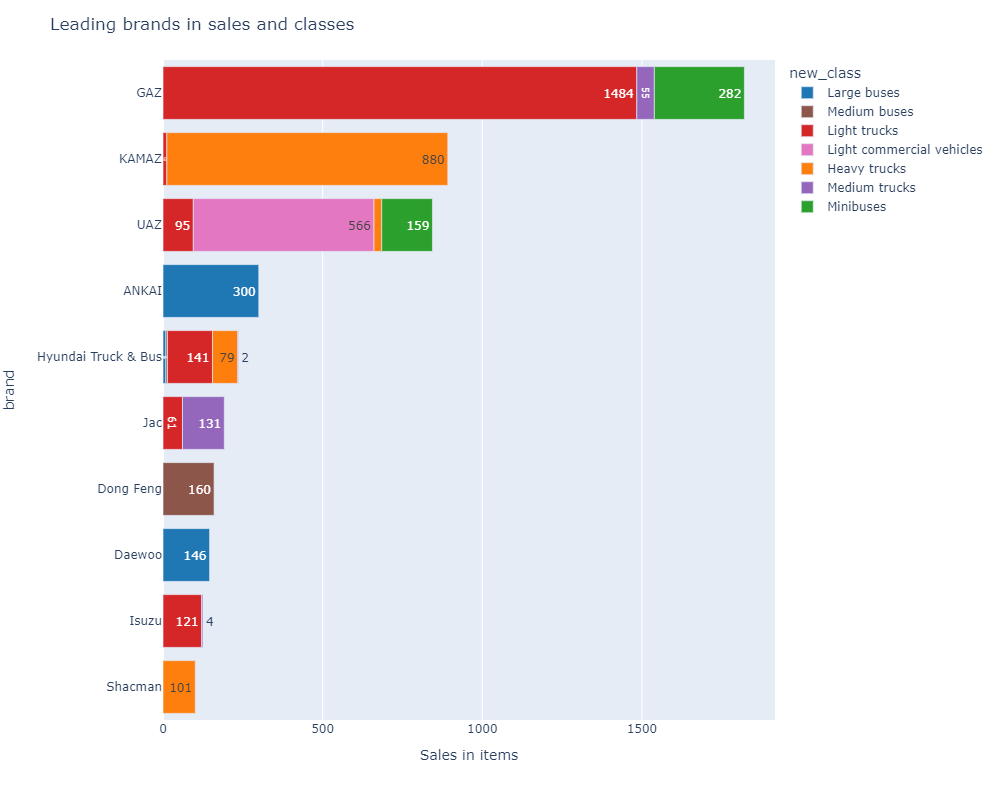

#### *Let's analyze the sales of cars in dollars in the context of the brand class of the car*

In [96]:
class_sales_commercial =\
commercial_vehicles.loc[commercial_vehicles['brand'].isin(best_brands_commercial)].pivot_table(index=['brand',
                                                                                                         'new_class'], 
                                                                                               values='sell_price_usd', 
                                                                                               aggfunc='sum').reset_index()

class_sales_commercial["rank"] = class_sales_commercial.groupby("brand")["sell_price_usd"].rank(ascending=False)

In [97]:
function_plotly(table=class_sales_commercial,
                             x='sell_price_usd', y='brand',
                             color='new_class', 
                             color_discrete_map=class_colors, 
                             text='sell_price_usd', 
                             title='Leading brands in sales and classes', 
                             xaxis_title='Sales in dollars')

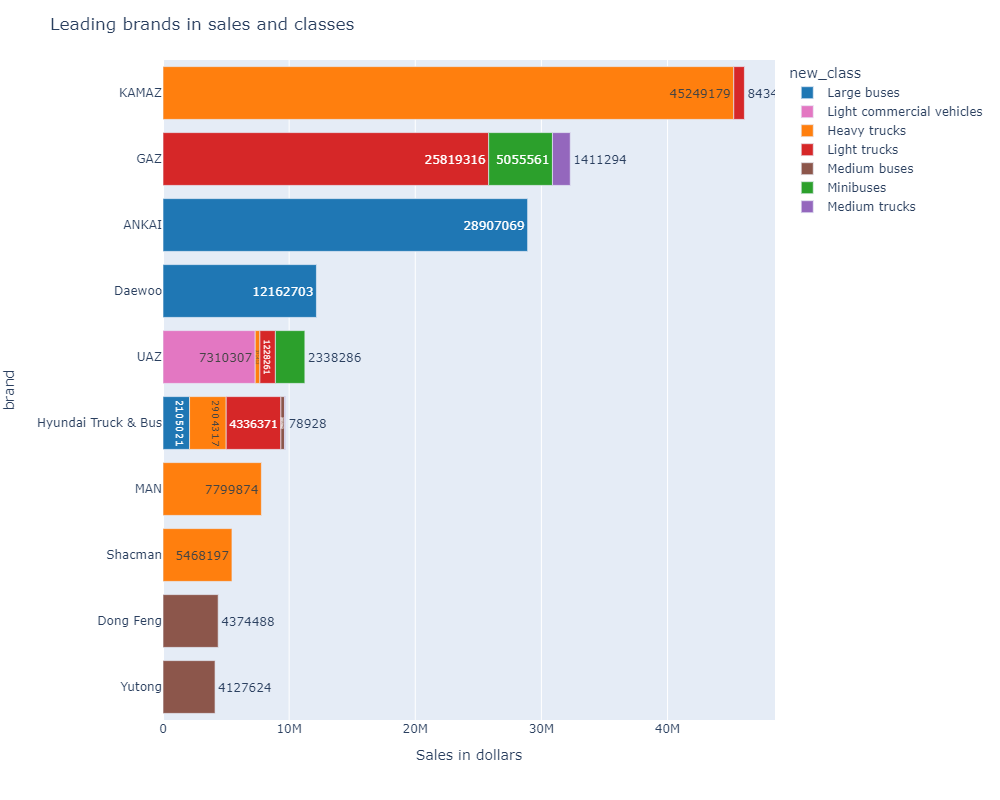

**Conclusion: we see a clear division by specialization within the leading brands.**:
- Kamaz is primarily engaged in large-capacity trucks
- GAS - low-tonnage
- UAZ - easily commercial vehicles
- Akai, Daewoo - big buses

**There are practically no intersections and, accordingly, competition, as in passenger transport.**

### Let's analyze sales by region

In [98]:
region_sales_commercial = commercial_vehicles.groupby('state', as_index=False)['sell_price_usd'].agg('sum')
region_sales_count_commercial = commercial_vehicles.groupby('state', as_index=False)['quantity'].agg('sum')

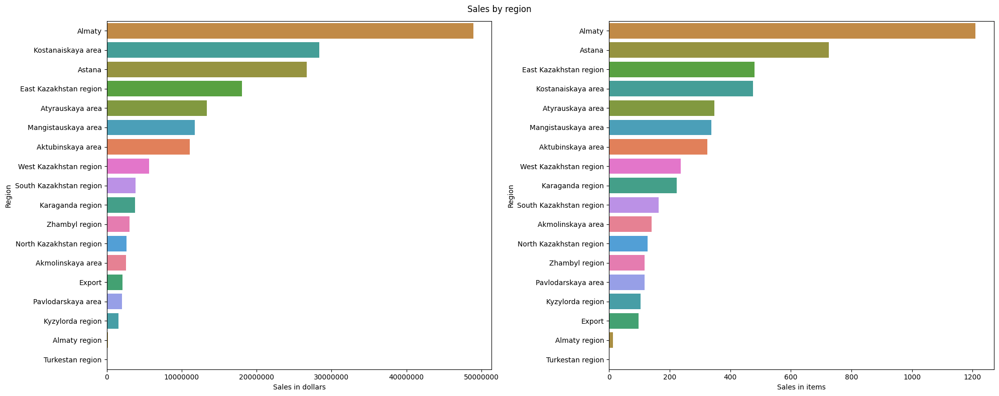

In [99]:
plt.figure(figsize=(20, 8))
plt.suptitle('Sales by region')

ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "state", x='sell_price_usd',
                 data = region_sales_commercial.sort_values(by='sell_price_usd', ascending=False), palette=region_color_dict)
plt.xlabel('Sales in dollars')
plt.ylabel('Region')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y ="state", x='quantity',
                 data=region_sales_count_commercial.sort_values(by='quantity', ascending=False), palette=region_color_dict)
plt.xlabel('Sales in items')
plt.ylabel('Region')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show()

**Conclusion: we see that Almaty is the leader in sales of commercial vehicles. Interestingly, Kostanay region surpasses Astana in sales in dollars.**

#### *Let's analyze sales by region in the context of brands*

In [100]:
region_brands_sales_commercial = commercial_vehicles.pivot_table(index=['state', 'brand'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()

region_brands_sales_commercial["rank"] = region_brands_sales_commercial.groupby("state")["sell_price_usd"].rank(ascending=False)

fig = px.bar(region_brands_sales_commercial.query('rank < 6').sort_values(by='rank'),
             y='state',
             x='sell_price_usd',
             color='brand',
            text='sell_price_usd')

# Настройка layout
fig.update_layout(
    title='Regions and brands are the leaders in sales',
    xaxis_title='Sales in dollars',
    yaxis_title='Region',
    yaxis={'categoryorder':'total ascending'},
    height=800,
    width=1000
)

fig.show()

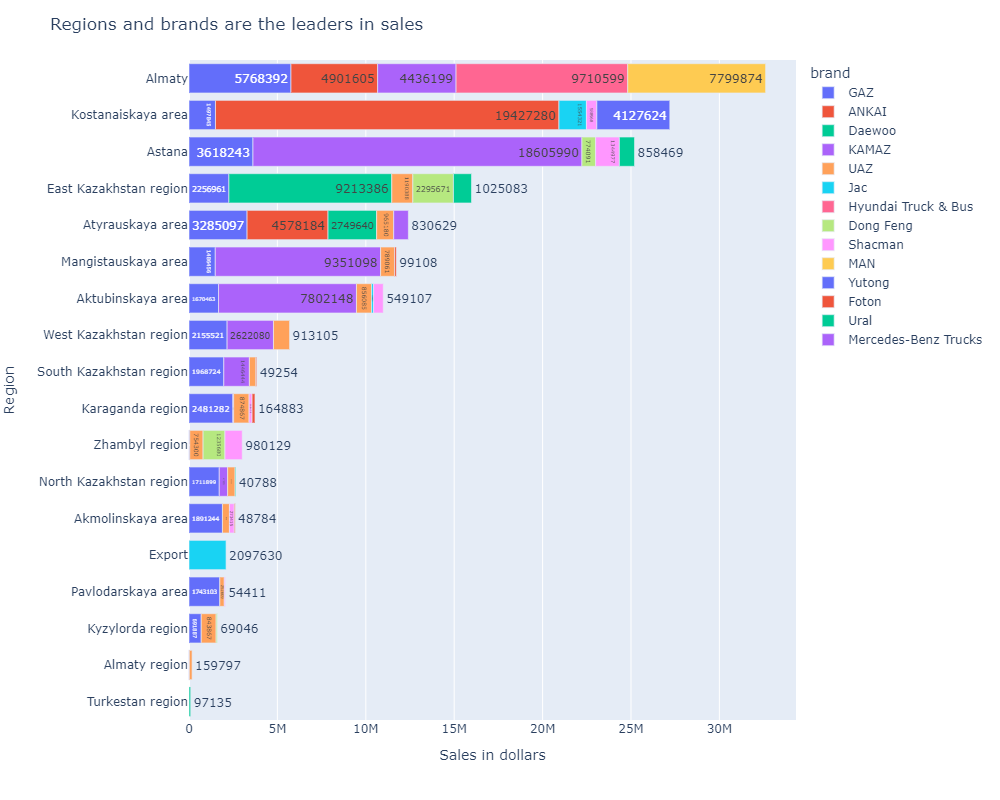

**Conclusion: we see that sales in Almaty are the most balanced - all the leading brands of the market are represented there. In Kostanay region, sales of Ankai prevail, in Astana - Kamaz.**

#### *Let's analyze sales by region in terms of car classes*

In [101]:
region_class_sales_commercial = commercial_vehicles.pivot_table(index=['state', 'new_class'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()
region_class_sales_commercial["rank"] = region_class_sales_commercial.groupby("state")["sell_price_usd"].rank(ascending=False)

In [102]:
class_colors = {
    'Large buses': '#1f77b4',
    'Heavy trucks': '#ff7f0e',
    'Minibuses': '#2ca02c',
    'Light trucks': '#d62728',
    'Medium trucks': '#9467bd',
    'Medium buses': '#8c564b',
    'Light commercial vehicles': '#e377c2',
}

function_plotly(table=region_class_sales_commercial,
                             x='sell_price_usd', y='state',
                             color='new_class', 
                             color_discrete_map=class_colors, 
                             text='sell_price_usd', 
                             title='Regions and classes of vehicles', 
                             xaxis_title='Sales in dollars')

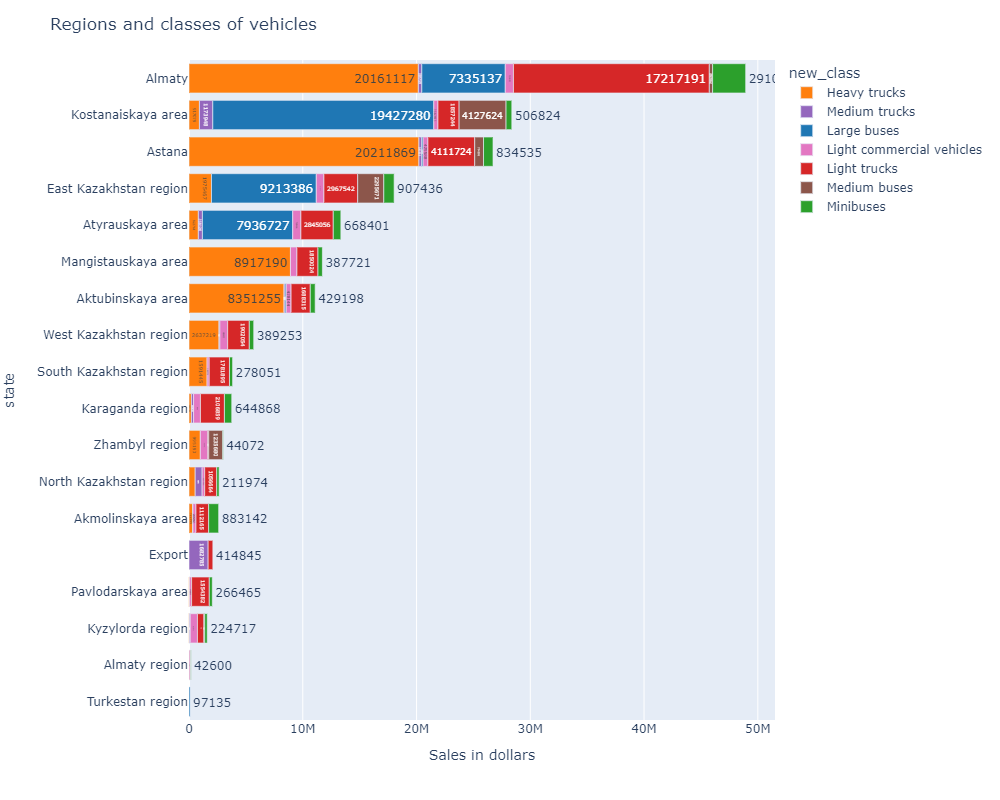

**Conclusion: once again, we are convinced that sales in Almaty are the most balanced - all the leading brands of the market are represented there. Kostanay region may have outperformed Astana in sales due to a jump in bus sales.**

#### *Let's analyze how Kostanay region has overtaken Astana in sales*

**There is an assumption that this was due to a sharp increase in bus sales in July. We will leave the data only on sales in Astana, Almaty, Kostanay region and for these regions we will analyze the dynamics of sales by month.**

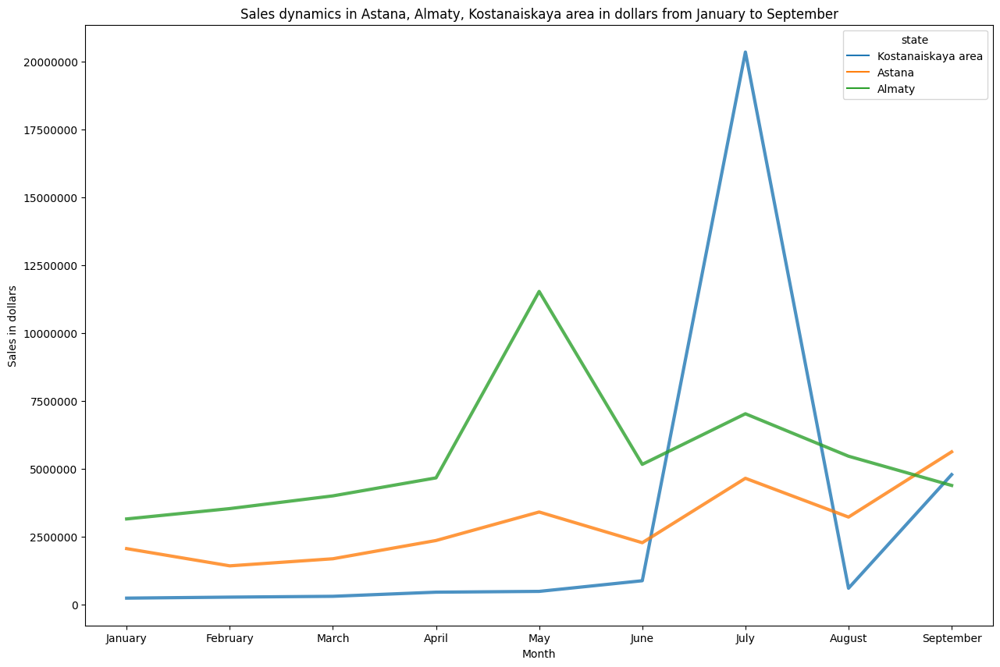

In [103]:
region_correct = commercial_vehicles.query("state in ['Astana', 'Almaty', 'Kostanaiskaya area']")

region_dynamic = region_correct.pivot_table(index=['month', 'state'], values='sell_price_usd', aggfunc='sum').reset_index()

region_dynamic = order_months(region_dynamic , 'month')

fig, ax = plt.subplots(figsize=(15, 10))
sns.lineplot(y='sell_price_usd', x='month', data=region_dynamic, hue='state', linewidth=3, alpha=0.8)
plt.xlabel('Month')
plt.ylabel('Sales in dollars')
plt.title('Sales dynamics in Astana, Almaty, Kostanaiskaya area in dollars from January to September')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='state')
plt.show()

**Conclusion: our hypothesis was confirmed, Kostanay region was ahead of Astana in sales due to a jump in bus sales in July. Since the jump is a one-time one, it seems that in July there was a shipment under some kind of large tender, which had such a strong impact on the distribution of sales.**

### Let's test the hypothesis that the cost of a car depends on the level of development of the region (average salary in the region)

In [104]:
# Let's calculate the median cost of a car for each region
price_commercial = commercial_vehicles.pivot_table(index='state',values='price_usd', aggfunc='median').reset_index()

price_salary_commercial = pd.merge(price_commercial, salary, left_on='state', right_on='state', how='left')
price_salary_commercial = price_salary_commercial.query('state != "Export"')

**Let's check the correlation between the cost of a car and the average salary in the region**

To do this, we will use the Pearson correlation coefficient. It helps to determine the presence of a linear relationship between the values and takes values from -1 to 1. The closer the Pearson correlation coefficient is to the extreme values of 1 or -1, the closer the linear relationship. If the value is close to zero, it means that the linear relationship is weak or absent altogether.

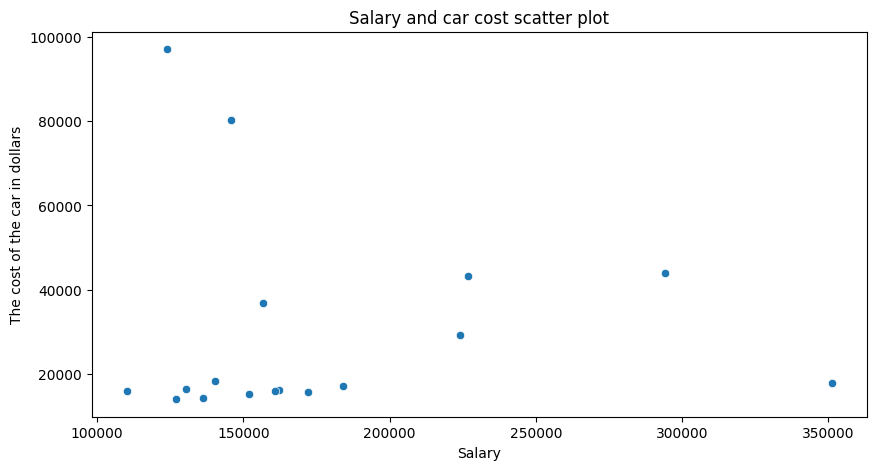

In [105]:
fig, ax = plt.subplots(figsize=(10, 5))
ax = sns.scatterplot(y='price_usd', x='salary', data=price_salary_commercial)
ax.grid(False)
plt.title('Salary and car cost scatter plot')
plt.xlabel('Salary')
plt.ylabel('The cost of the car in dollars')
plt.show()

In [106]:
# To check, let's calculate the correlation coefficient
print(price_salary_commercial['price_usd'].corr(price_salary_commercial['salary']))

-0.03704162599252232


**Conclusion: we see that there is no connection between the price of a car and the average salary in the relevant region.**

### Let's analyze the sales of car centers

#### *Let's analyze the total sales of car centers*

In [107]:
dealer_commercial = commercial_vehicles.pivot_table(index='company',values='sell_price_usd', aggfunc='sum').reset_index()
dealer_count_commercial = commercial_vehicles.pivot_table(index='company',values='quantity', aggfunc='sum').reset_index()

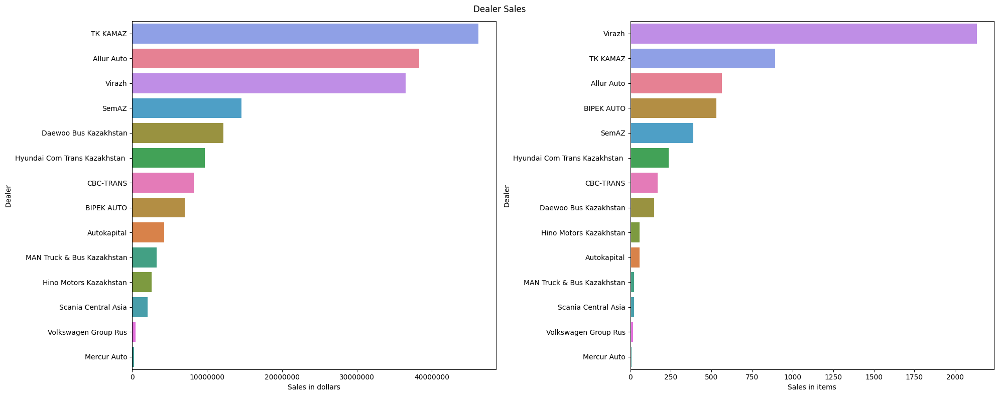

In [108]:
brands_commercial = dealer_commercial['company'].unique()
brand_colors_commercial = sns.color_palette("husl", n_colors=len(brands_commercial))

brand_color_dict_commercial = dict(zip(brands_commercial, brand_colors_commercial))

plt.figure(figsize=(20, 8))
plt.suptitle('Dealer Sales')

ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "company", x='sell_price_usd',
                 data =dealer_commercial.sort_values(by='sell_price_usd', ascending=False), palette=brand_color_dict_commercial)
ax.grid(False)
plt.xlabel('Sales in dollars')
plt.ylabel('Dealer')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "company", x='quantity',
                 data = dealer_count_commercial.sort_values(by='quantity', ascending=False), 
                  palette=brand_color_dict_commercial)
ax.grid(False)
plt.xlabel('Sales in items')
plt.ylabel('Dealer')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show()

**Conclusion: we see three pronounced market leaders - TK KAMAZ, Virazh, Allur Auto.**

#### *Let's identify the top 10 dealers by dollar sales and calculate their market share*

In [109]:
# Let's keep the names of the brands with the best sales in a separate list
best_dealers_commercial = commercial_vehicles.pivot_table(index='company',
                                          values='sell_price_usd',
                                          aggfunc='sum').reset_index().nlargest(10, 'sell_price_usd')['company'].tolist()

In [110]:
# We will rename all dealers that are not related to the tops to the Others
dealer_commercial.loc[~dealer_commercial['company'].isin(best_dealers_commercial), 'company'] = "Others"

In [111]:
pastel_colors = px.colors.qualitative.Pastel

fig = go.Figure(data=[go.Pie(labels=dealer_commercial['company'],
                            values=dealer_commercial['sell_price_usd'],
                            hole=0.5,
                            textinfo='label+value+percent',
                            marker=dict(colors=pastel_colors))])

fig.update_layout(title={'text': "Dealers are the leaders of the commercial vehicle market"},
                  height=800,
                  width=800)

fig.show()

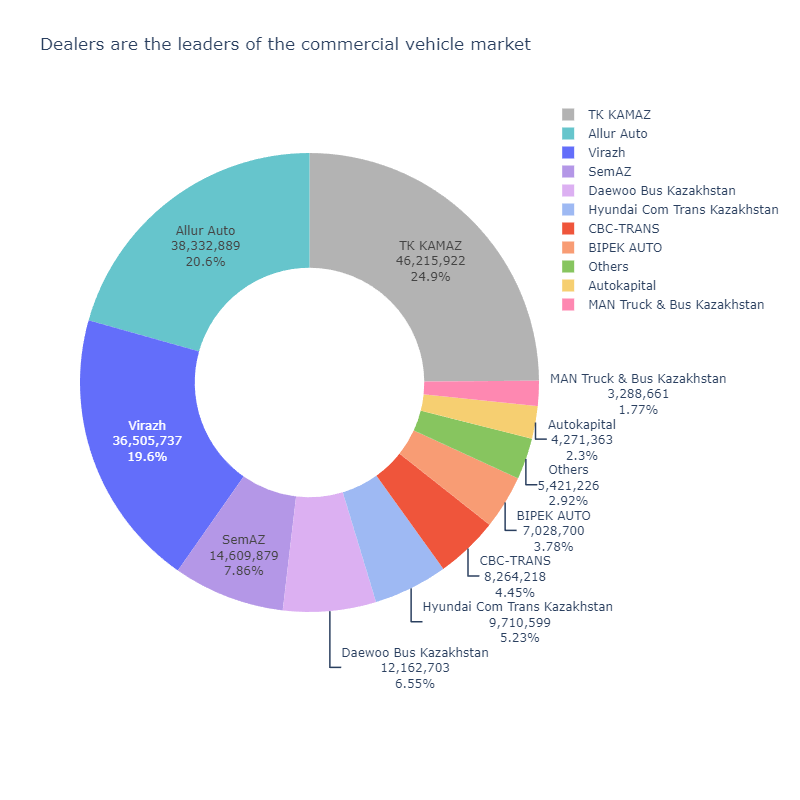

**Conclusion: we can say that the market is essentially divided between 3 companies - TK KAMAZ, Virazh, Allur Auto.**

#### *Let's analyze the sales dynamics of the top 10 dealers*

In [112]:
best_commercial = commercial_vehicles.loc[commercial_vehicles['company'].isin(best_dealers_commercial)]

best_commercial = best_commercial.pivot_table(index=['month', 'company'], values='sell_price_usd',
                                              aggfunc='sum').reset_index()

best_commercial = order_months(best_commercial, 'month')

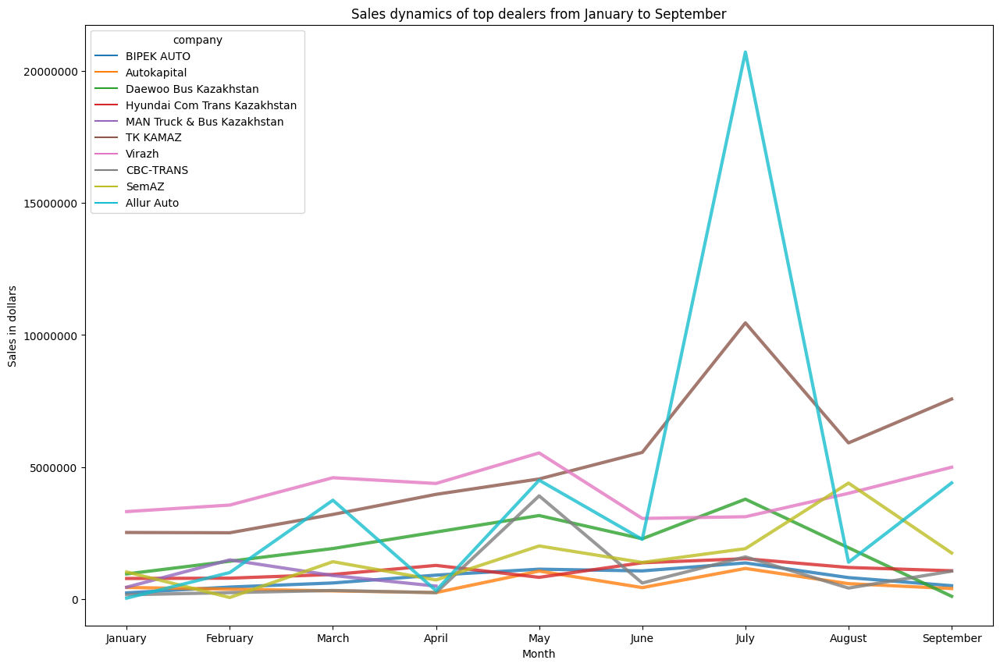

In [113]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.lineplot(y='sell_price_usd', x='month', data=best_commercial, hue='company', linewidth=3, alpha=0.8)
plt.xlabel('Month')
plt.ylabel('Sales in dollars')
plt.title('Sales dynamics of top dealers from January to September')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='company')
ax.grid(False)
plt.show()

**Conclusion: TK KAMAZ and Allur Auto have sales peaks in July, and Virazh has sales peaks in May.**

#### *Let's analyze which brands dealers deal with*

In [114]:
brand_dealer_commercial = commercial_vehicles.pivot_table(index=['brand', 'company'], values='sell_price_usd',
                                              aggfunc='sum').reset_index()

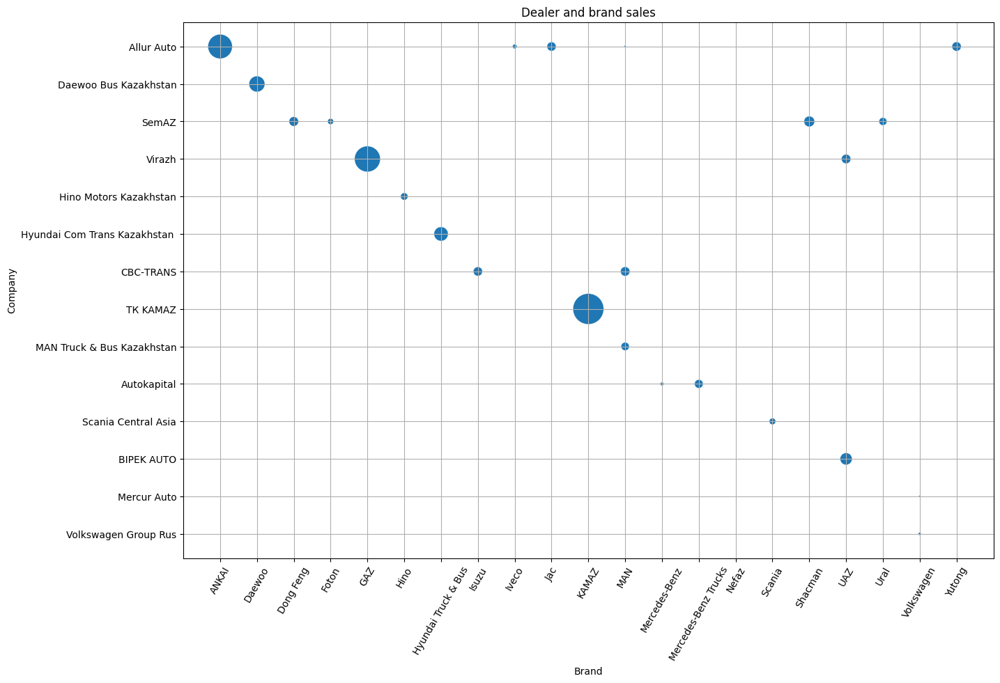

In [115]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.scatterplot(x='brand', y='company', data=brand_dealer_commercial, size='sell_price_usd', legend=False, sizes=(0, 1000))
plt.xlabel('Brand')
plt.ylabel('Company')
plt.title('Dealer and brand sales')
plt.xticks(rotation=60)
ax.grid(True)
plt.show()

**Conclusion: we see three main players in the market and the brands through which they develop their sales**:
- Allur Auto - engaged in the brands Ankai and Jac
- Virazh - they are engaged in the GAZ brand
- TK Kamaz - engaged in the Kamaz brand

**We also make sure once again that there is practically no competition, each company is engaged in its own brand.**

#### *Let's analyze in which regions the dealers listed in the table trade*

In [116]:
region_dealer_commercial = commercial_vehicles.pivot_table(index=['state', 'company'], values='sell_price_usd',
                                              aggfunc='sum').reset_index()

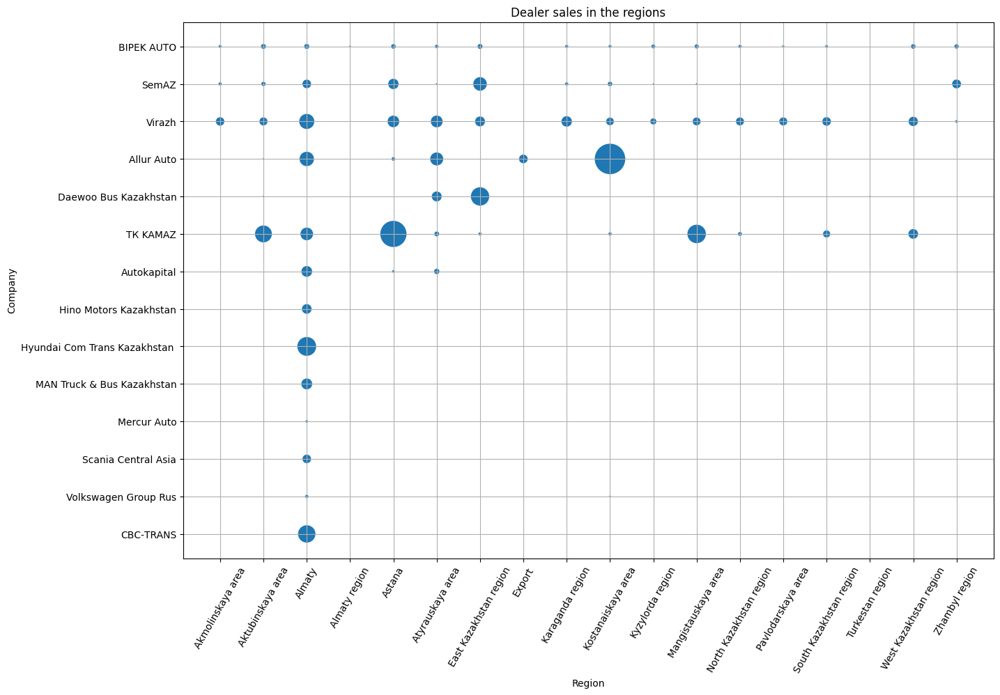

In [117]:
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.scatterplot(x='state', y='company', data=region_dealer_commercial, 
                     size='sell_price_usd', legend=False, sizes=(0, 1000))
plt.xlabel('Region')
plt.ylabel('Company')
plt.title('Dealer sales in the regions')
plt.xticks(rotation=60)
ax.grid(True)
plt.show()

**Conclusion: we see that the three main players have a different distribution of sales by region:**
- at the Virazh, sales are distributed almost evenly across the country
- TK KAMAZ has its main sales concentrated in Aktobe and Mangystau regions and in Astana
- Allur Auto has almost all sales concentrated in the Kostanay region

**Obviously, this difference in the distribution of sales is directly related to the brands that companies are engaged in**

### Let's highlight the leading models in the market

In [118]:
models_commercial = commercial_vehicles.pivot_table(index='new_model', values='sell_price_usd',
                                              aggfunc='sum').reset_index()
models_commercial = models_commercial.sort_values(by='sell_price_usd', ascending=False).head(10)
models_commercial

,new_model,sell_price_usd
3,ANKAI HFF6850G,19592919.0
16,GAZ 3302,15664502.0
62,KAMAZ 65115,12584272.0
48,KAMAZ 43118,9818025.0
19,GAZ Next,8929638.0
70,MAN TG,7799874.0
4,Daewoo BC 095,6055574.0
83,Shacman SX3258DR384,5468197.0
88,UAZ 3909,4838732.0
65,KAMAZ 6520,4683704.0


In [119]:
models_count_commercial = commercial_vehicles.pivot_table(index='new_model', values='quantity',
                                              aggfunc='sum').reset_index()
models_count_commercial = models_count_commercial.sort_values(by='quantity', ascending=False).head(10)
models_count_commercial

,new_model,quantity
16,GAZ 3302,998.0
19,GAZ Next,417.0
88,UAZ 3909,390.0
62,KAMAZ 65115,259.0
3,ANKAI HFF6850G,240.0
48,KAMAZ 43118,188.0
8,Dong Feng BWC6665GA5,160.0
84,UAZ 2206,159.0
13,GAZ 2705,145.0
89,UAZ 3962,138.0


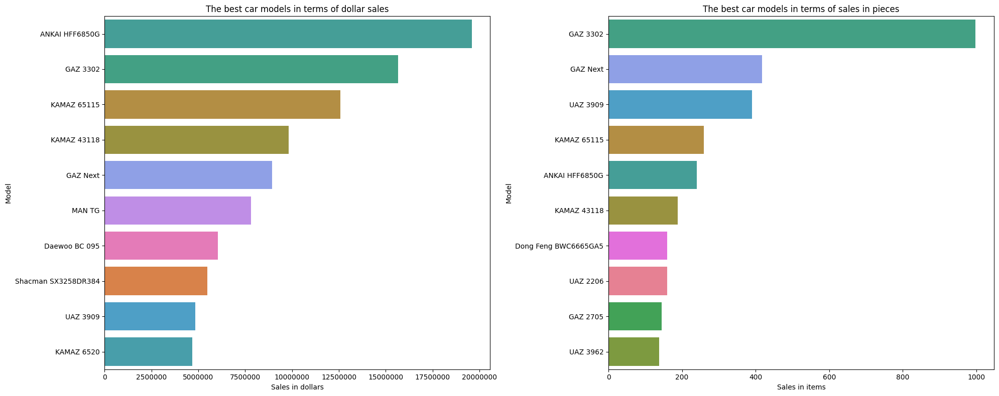

In [120]:
labels_1 = models_commercial['new_model'].tolist()
labels_2 = models_count_commercial['new_model'].tolist()

unique_models_commercial = pd.Series(list(set(labels_1) | set(labels_2)))

colors_commercial = sns.color_palette("husl", n_colors=len(unique_models_commercial))
models_color_dict_commercial = dict(zip(unique_models_commercial, colors_commercial))

plt.figure(figsize=(20, 8))
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "new_model", x='sell_price_usd',
                 data = models_commercial.sort_values(by='sell_price_usd', ascending=False), 
                  palette=models_color_dict_commercial)
ax.grid(False)
plt.xlabel('Sales in dollars')
plt.ylabel('Model')
plt.title('The best car models in terms of dollar sales')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "new_model", x='quantity',
                 data = models_count_commercial.sort_values(by='quantity', ascending=False), 
                  palette=models_color_dict_commercial)
ax.grid(False)
plt.xlabel('Sales in items')
plt.ylabel('Model')
plt.title('The best car models in terms of sales in pieces')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show()

**Conclusion: we see that GAZ 3302, GAZ Next, KAMAZ 65115, KAMAZ 43118, ANKAI HFF6850G are the leaders of the commercial vehicle market in terms of sales in units and dollars.**

### Let's highlight the most expensive and cheapest brands on the market

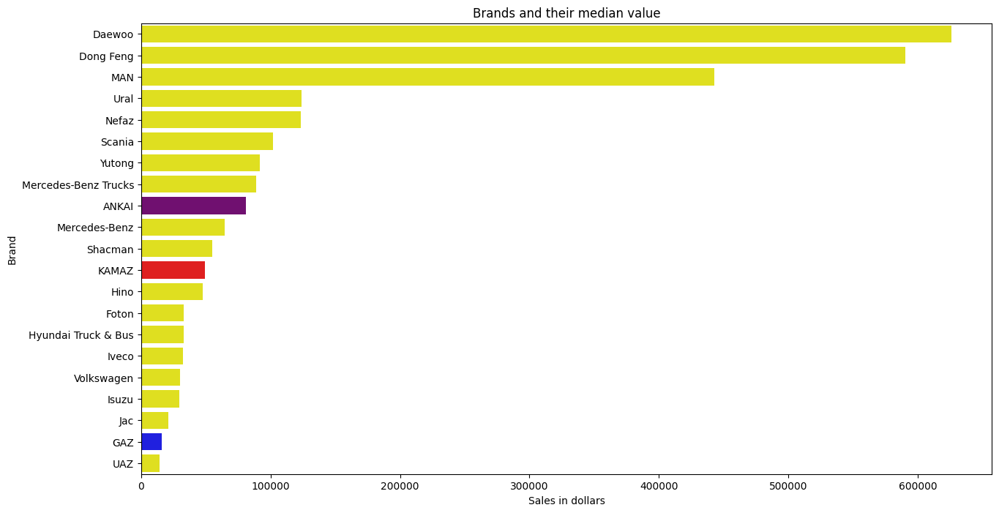

In [121]:
price_commercial = commercial_vehicles.pivot_table(index='brand', values='sell_price_usd', aggfunc='median').reset_index()

brand_palette = {brand: 'yellow' for brand in price_commercial['brand'].unique()}
brand_palette['KAMAZ'] = 'red'
brand_palette['GAZ'] = 'blue'
brand_palette['ANKAI'] = 'purple'

# Строим график
fig, ax = plt.subplots(figsize=(15, 8))
ax = sns.barplot(y="brand", x='sell_price_usd',
                 data=price_commercial.sort_values(by='sell_price_usd', ascending=False),
                 palette=brand_palette)

ax.grid(False)
plt.xlabel('Sales in dollars')
plt.ylabel('Brand')
plt.title('Brands and their median value')
plt.ticklabel_format(useOffset=False, style='plain', axis='x')
plt.show();

**Conclusion: we see that GAZ is one of the market leaders, including due to its relatively low price. KAMAZ is rather a moderately priced brand, while ANKAI is closer to the expensive ones. It should also be noted that such a comparison is quite conditional, since each brand deals with its own classes of cars, which differ significantly from each other in terms of specifics and price.**

### Interim conclusion: at this stage, we have conducted an analysis of the commercial vehicle market. We were able to establish the following:
1. the actual capacity of the commercial vehicle market in Kazakhstan in 2019 as of September is 5,246 units and 185,811,884 dollars, respectively.
2. GAZ and KAMAZ dominate the commercial vehicle market, both in terms of sales in units and in dollars.
3. the dynamics of sales in units and dollars are generally the same - there is an increase in sales with a peak in July and a subsequent decrease in August and September.
4. in July there was a sharp increase in sales of the large bus class, while low-tonnage and large-tonnage trucks show the most stable sales in units and dollars for the year.
5. In general, the market leaders are large buses, low-tonnage and large-tonnage trucks.
6. GAZ's most popular models are 3302 and Next, Kamaz's 65115 and 43118. Also, one of the advantages of Kamaz, in my opinion, is its very wide range compared to other brands.
7. we see a clear division by specialization within the leading brands:
- Kamaz is primarily engaged in large-capacity trucks
- GAS - low-tonnage
- UAZ - easily commercial vehicles
- Akai, Daewoo - big buses
There are practically no intersections and, accordingly, competition, as in light vehicles market.
8. Almaty is the leader in sales of commercial vehicles. Interestingly, Kostanay region surpasses Astana in sales in dollars.
9. sales in Almaty are the most balanced - all the leading brands of the market are represented there. In Kostanay region, sales of Ankai prevail, in Astana - Kamaz.
10. Almaty are the most balanced - all the leading brands of the market are represented there. Kostanay region may have outperformed Astana in sales due to a jump in bus sales.
11. Kostanay region was ahead of Astana in sales due to a jump in bus sales in July. Since the jump is a one-time one, it seems that in July there was a shipment under some kind of large tender, which had such a strong impact on the distribution of sales.
12. there is no connection between the price of a car and the average salary in the relevant region.
13. we see three pronounced market leaders - TK KAMAZ, Virazh, Allur Auto.
14. the market is essentially divided between 3 companies - TK KAMAZ, Virazh, Allur Auto.
15. TK KAMAZ and Allur Auto have sales peaks in July, and Virazh has sales peaks in May.
16. we see three main players in the market and the brands through which they develop their sales:
- Allur Auto - engaged in the brands Ankai and Jac
- Virazh - they are engaged in the GAZ brand
- TK Kamaz - engaged in the Kamaz brand
17. we see that the three main players have a different distribution of sales by region:
- at the Virazh, sales are distributed almost evenly across the country
- TK KAMAZ has its main sales concentrated in Aktobe and Mangystau regions and in Astana
- Allur Auto has almost all sales concentrated in the Kostanay region
18. GAZ 3302, GAZ Next, KAMAZ 65115, KAMAZ 43118, ANKAI HFF6850G are the leaders of the commercial vehicle market in terms of sales in units and dollars.
19. GAZ is one of the market leaders, including due to its relatively low price. KAMAZ is rather a moderately priced brand, while ANKAI is closer to the expensive ones. It should also be noted that such a comparison is quite conditional, since each brand deals with its own classes of cars, which differ significantly from each other in terms of specifics and price.

## Step 5. Analyzing the position of Mercur Auto

### Let's analyze the company's revenue: total, by brand, average, monthly, monthly by brand

#### *Let's analyze the total revenue of the company*

In [122]:
mercur = data_english.query('company == "Mercur Auto"')

In [123]:
mercur['sell_price_usd'].sum()

19355311.0

**Conclusion: the total revenue of the company is 19 355 310 dollars**

#### *Let's analyze the company's revenue by brand*

In [124]:
mercur_brands = mercur.pivot_table(index='brand', values='sell_price_usd',
                                              aggfunc='sum').reset_index()
mercur_brands

,brand,sell_price_usd
0,Audi,4059490.0
1,Porsche,5113514.0
2,Volkswagen,10182307.0


**Conclusion: the company deals with Audi, Porsche, Volkswagen brands. The most profitable brand is Volkswagen.**

#### *Let's analyze the company's monthly revenue*

In [125]:
mercur_dynamic = mercur.pivot_table(index='month', values='sell_price_usd',
                                              aggfunc='sum').reset_index()

mercur_dynamic = order_months(mercur_dynamic, 'month')

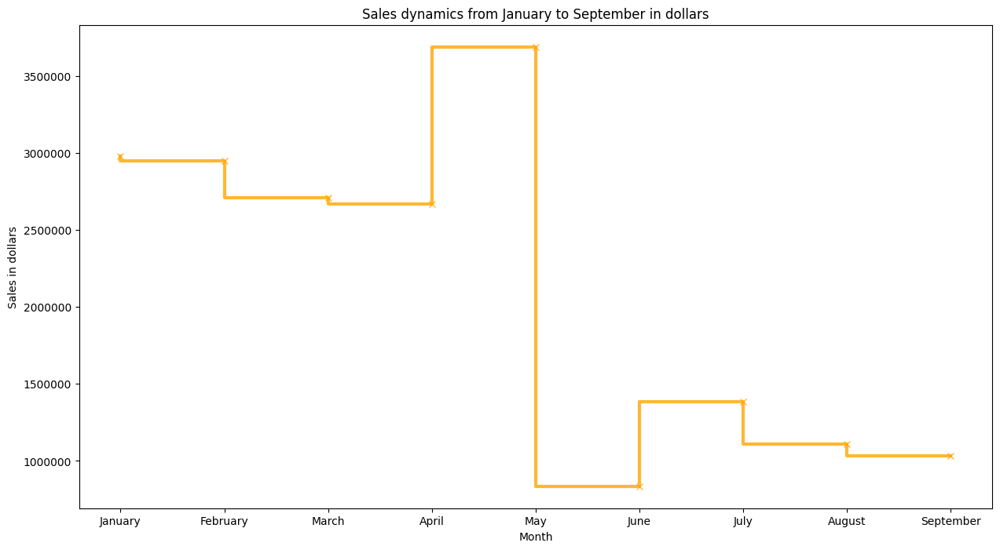

In [126]:
fig, ax = plt.subplots(figsize=(15, 8))

ax = plt.step(x=mercur_dynamic['month'], y=mercur_dynamic['sell_price_usd'], marker='x', linewidth=3, alpha=0.8, color='orange')
plt.xlabel('Month')
plt.ylabel('Sales in dollars')
plt.title('Sales dynamics from January to September in dollars')
plt.ticklabel_format(useOffset=False,style='plain', axis='y')

**Conclusion: the dynamics of sales is very different from the general market. After the winter, the market has seen growth peak in July. Here, on the contrary, after the peak in May, by the summer there is a sharp decline in sales.**

#### *Let's analyze the company's monthly revenue by brand*

In [127]:
mercur_brand_dynamic = mercur.pivot_table(index=['month', 'brand'], values='sell_price_usd',
                                              aggfunc='sum').reset_index()

mercur_brand_dynamic = order_months(mercur_brand_dynamic, 'month')

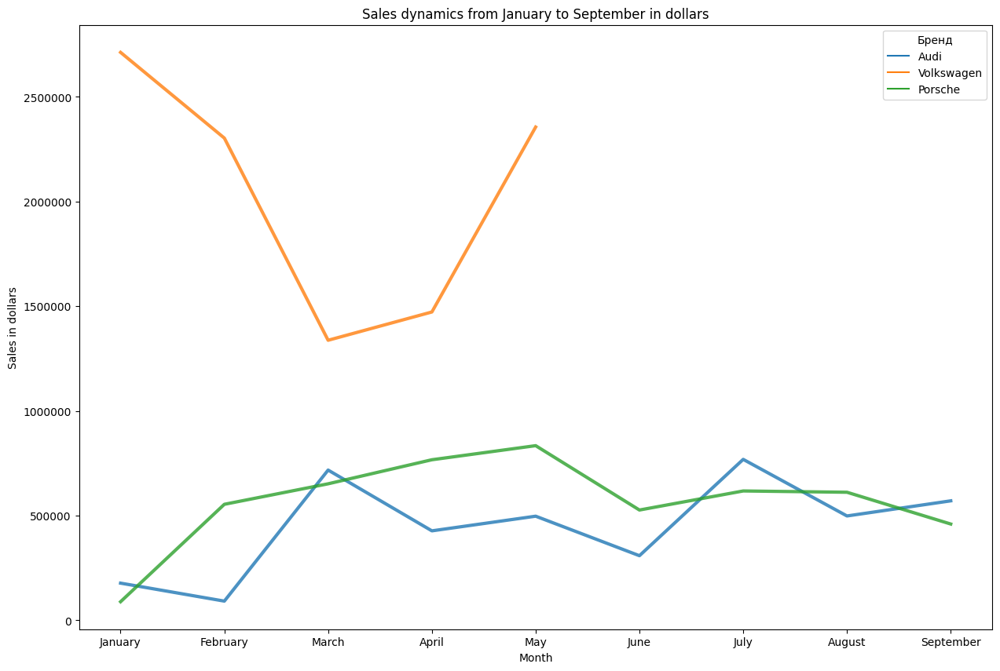

In [128]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.lineplot(y='sell_price_usd', x='month', data=mercur_brand_dynamic, hue='brand', linewidth=3, alpha=0.8)
plt.xlabel('Month')
plt.ylabel('Sales in dollars')
plt.title('Sales dynamics from January to September in dollars')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='Бренд')
plt.show()

**Conclusion: apparently, the company was going to bet primarily on Volkswagen, but for some reason sales began to fall from the very beginning of the year, and stopped after May. There may have been problems on the manufacturer's side - lack of cars, lack of components, etc. Porsche and Audi have been selling steadily throughout the year.**

#### *Let's analyze the company's monthly revenue by segment*

In [129]:
mercur_segment_dynamic = mercur.pivot_table(index=['month', 'new_segment'], values='sell_price_usd',
                                              aggfunc='sum').reset_index()

mercur_segment_dynamic = order_months(mercur_segment_dynamic, 'month')
mercur_segment_dynamic

,month,new_segment,sell_price_usd
3,January,Commercial vehicle,251411.0
4,January,Light vehicle,2728013.0
2,February,Light vehicle,2949389.0
7,March,Light vehicle,2707622.0
0,April,Light vehicle,2667282.0
8,May,Light vehicle,3687797.0
6,June,Light vehicle,835751.0
5,July,Light vehicle,1386826.0
1,August,Light vehicle,1110374.0
9,September,Light vehicle,1030846.0


**Conclusion: apparently, the company specializes in light vehicles, but in January there was a one-time sale of commercial vehicles, which makes the sales dynamics look different from the market.**

### Let's analyze sales by region: general, by brand

#### *Let's analyze the total sales by region*

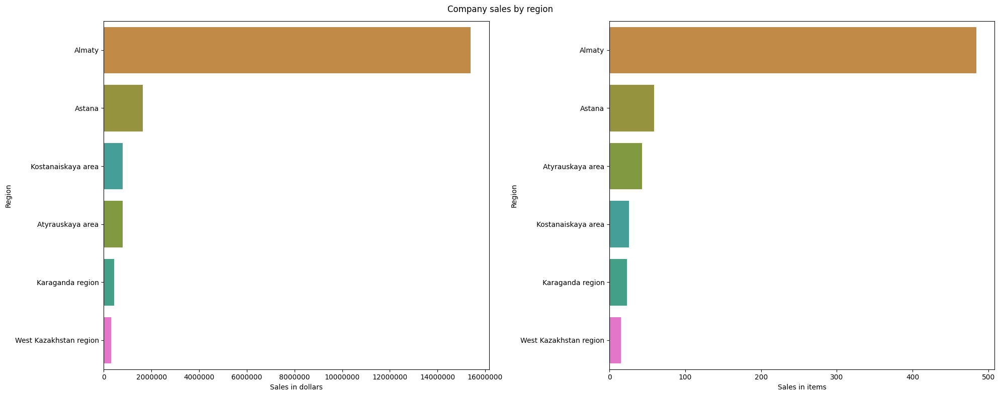

In [130]:
mercur_region_sales = mercur.groupby('state', as_index=False)['sell_price_usd'].agg('sum')
mercur_region_sales_count = mercur.groupby('state', as_index=False)['quantity'].agg('sum')

plt.figure(figsize=(20, 8))
plt.suptitle('Company sales by region')

ax1 = plt.subplot(1, 2, 1)
ax1 = sns.barplot(y = "state", x='sell_price_usd',
                 data = mercur_region_sales.sort_values(by='sell_price_usd', ascending=False), palette=region_color_dict)
plt.xlabel('Sales in dollars')
plt.ylabel('Region')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')


ax2 = plt.subplot(1, 2, 2)
ax2 = sns.barplot(y = "state", x='quantity',
                 data =mercur_region_sales_count.sort_values(by='quantity', ascending=False), palette=region_color_dict)
plt.xlabel('Sales in items')
plt.ylabel('Region')
plt.ticklabel_format(useOffset=False,style='plain', axis='x')

plt.tight_layout()
plt.show()

**Conclusion: almost all of the company's sales are concentrated in Almaty. The extremely small sales in Astana are surprising, in my opinion this is one of the growth points of the company.**

#### *Let's analyze sales by region in the context of brands*

In [131]:
mercur_brand_region_sales = mercur.pivot_table(index=['state', 'brand'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()

function_plotly_without_rank(table=mercur_brand_region_sales,
                             x='sell_price_usd', y='state',
                             color='brand', 
                             color_discrete_map=class_colors, 
                             text='sell_price_usd', 
                             title='Regions and car brands', 
                             xaxis_title='Sales in dollars')

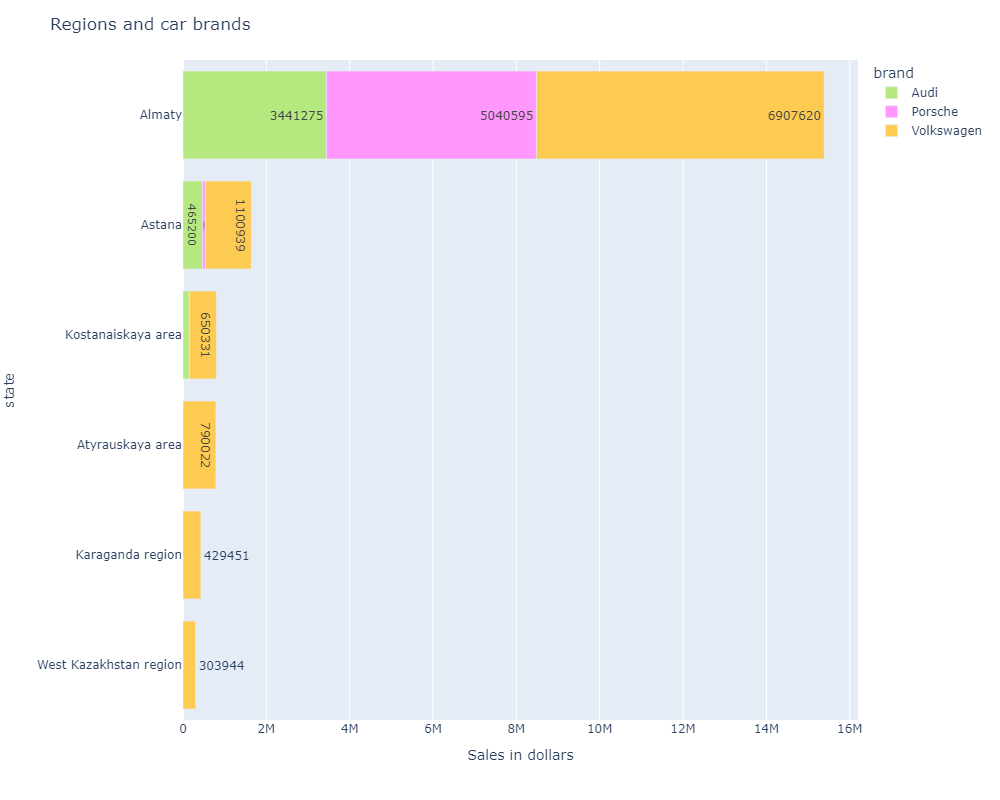

**Conclusion: we see that in all regions except Almaty, the company is betting on the sale of Volkswagen. However, given the problems with Volkswagen in the second half of the year, it turns out that the company is in an extremely vulnerable position. The company also sells Audi and Porsche quite well in Almaty.**

### Let's conduct a competitive analysis

#### *Let's analyze the competitors for the Volkswagen brand*

In [132]:
competitors = light_vehicles.query('brand == "Volkswagen"')
competitors['company'].unique()

array(['Mercur Auto', 'Volkswagen Group Rus', 'Autohouse Motors KST',
       'Autoworld-Center', 'ТОО "Eurasia Motor Zhaik"'], dtype=object)

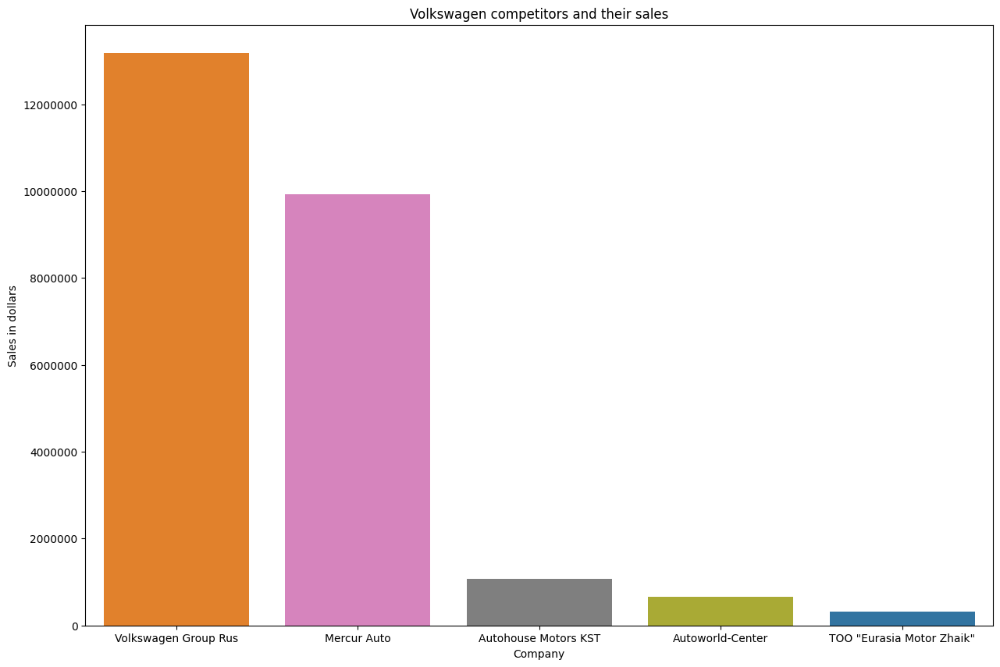

In [133]:
competitors_vw = competitors.pivot_table(index='company', values='sell_price_usd', aggfunc='sum').reset_index()
colors_competitors = {
    'ТОО "Eurasia Motor Zhaik"': '#1f77b4',
    'Volkswagen Group Rus': '#ff7f0e',
    'Mercur Auto': '#e377c2',
    'Autohouse Motors KST': '#7f7f7f',
    'Autoworld-Center': '#bcbd22'}

fig, ax = plt.subplots(figsize=(15, 10))
sns.barplot(y='sell_price_usd', x='company',
            data=competitors_vw.sort_values(by='sell_price_usd', ascending=False), palette=colors_competitors)
plt.xlabel('Company')
plt.ylabel('Sales in dollars')
plt.title('Volkswagen competitors and their sales')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.show()

In [134]:
competitors_dynamic = competitors.pivot_table(index=['month', 'company'], values='sell_price_usd',
                                              aggfunc='sum').reset_index()

competitors_dynamic = order_months(competitors_dynamic, 'month')

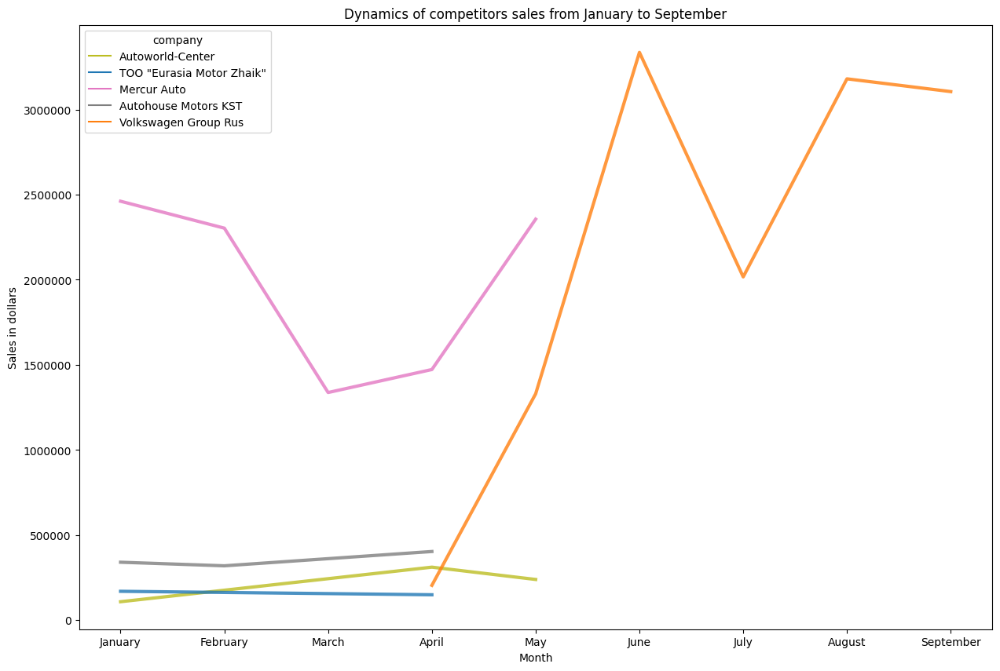

In [135]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.lineplot(y='sell_price_usd', x='month', data=competitors_dynamic, hue='company', linewidth=3, alpha=0.8, 
             palette=colors_competitors)
plt.xlabel('Month')
plt.ylabel('Sales in dollars')
plt.title('Dynamics of competitors sales from January to September')
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.legend(title='company')
plt.show()

**Conclusion: we see that the Volkswagen manufacturer has decided to replace 4 old dealers with one that is clearly affiliated with it. This is due to the sharp decline in sales of the Merkur Auto company after May. Until May, Mercur Auto was Volkswagen's sales leader.**

In [136]:
competitors_region_sales = competitors.pivot_table(index=['state', 'company'],
                                              values='sell_price_usd',
                                 aggfunc='sum').reset_index()

function_plotly_without_rank(table=competitors_region_sales,
                             x='sell_price_usd', y='state',
                             color='company', 
                             color_discrete_map=colors_competitors, 
                             text='sell_price_usd', 
                             title='Regions and companies competing in Volkswagen sales', 
                             xaxis_title='Sales in dollars')

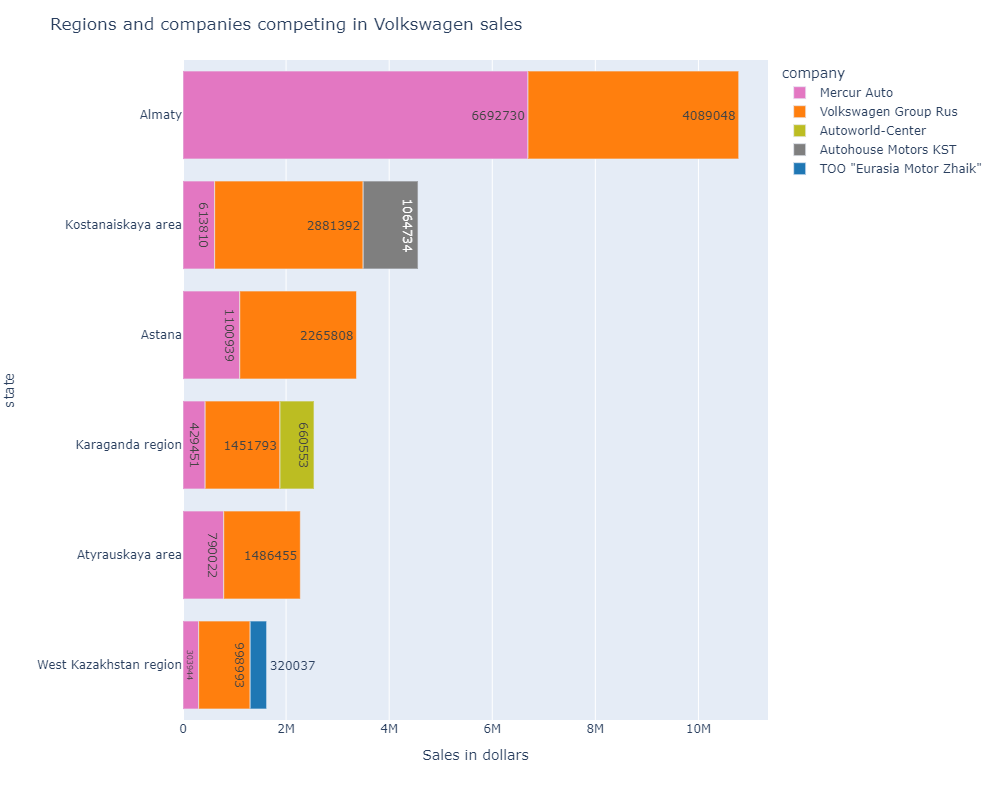

**We see that the new dealer was able to surpass the old ones in all regions except the most key one - Almaty. In this region, the Mercur Auto company is still the leader in sales.**

#### *Let's analyze the competitors for the Porsche brand*

In [137]:
competitors_porsche = light_vehicles.query('brand == "Porsche"')
competitors_porsche['company'].unique()

array(['Mercur Auto'], dtype=object)

#### *Let's analyze the competitors for the Audi brand*

In [138]:
competitors_audi = light_vehicles.query('brand == "Audi"')
competitors_audi['company'].unique()

array(['Mercur Auto'], dtype=object)

**We see that Mercur Auto is the only dealer in Kazakhstan for the Porsche and Audi brands.**

#### *Let's analyze competitors by car class*

**We will find the classes of cars that the Mercur Auto company is engaged in**

In [139]:
def function_seaborn_2(table, x, y, ytitle):
    fig, ax = plt.subplots(figsize=(15, 10))
    ax = sns.barplot(x = x, y=y,
                 data = table.sort_values(by=y, ascending=False), palette=sns.color_palette("Set2"))
    plt.ylabel(f'{ytitle}')
    plt.xlabel(f'{x}')
    plt.title(f'Bar chart of distribution {x}')
    plt.xticks(rotation=45)
    plt.ticklabel_format(useOffset=False, style='plain', axis='y')
    plt.show();

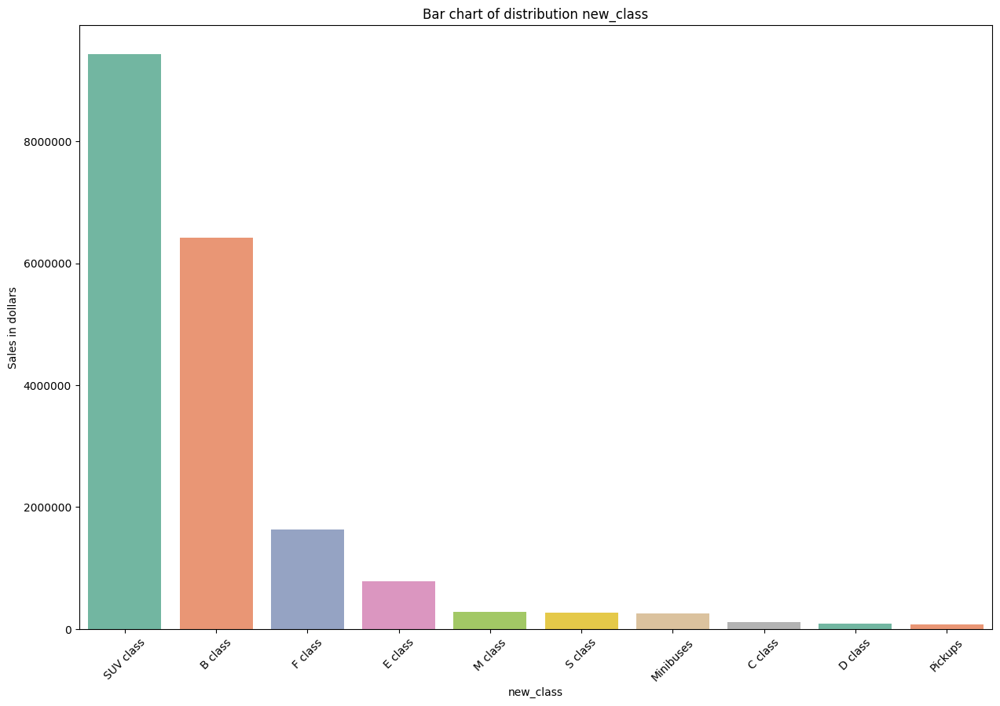

In [140]:
mercur_class = mercur.groupby('new_class', as_index=False)['sell_price_usd'].agg('sum')
function_seaborn_2(table=mercur_class, x='new_class', y='sell_price_usd', ytitle='Sales in dollars')

**We see that the company sells the most SUV and B class cars, which is fully consistent with the market situation.**

**Let's take a separate look at the competitors in the SUV class**

In [141]:
competitors_suv = light_vehicles.query('new_class == "SUV class"')

In [142]:
companies_suv = competitors_suv.pivot_table(index='company', values='sell_price_usd', aggfunc='sum').reset_index()
best_suv = companies_suv.sort_values(by='sell_price_usd', ascending=False).head(11)

best_suv['percentage'] = round(100 * (best_suv['sell_price_usd'] / best_suv['sell_price_usd'].sum()), 2)

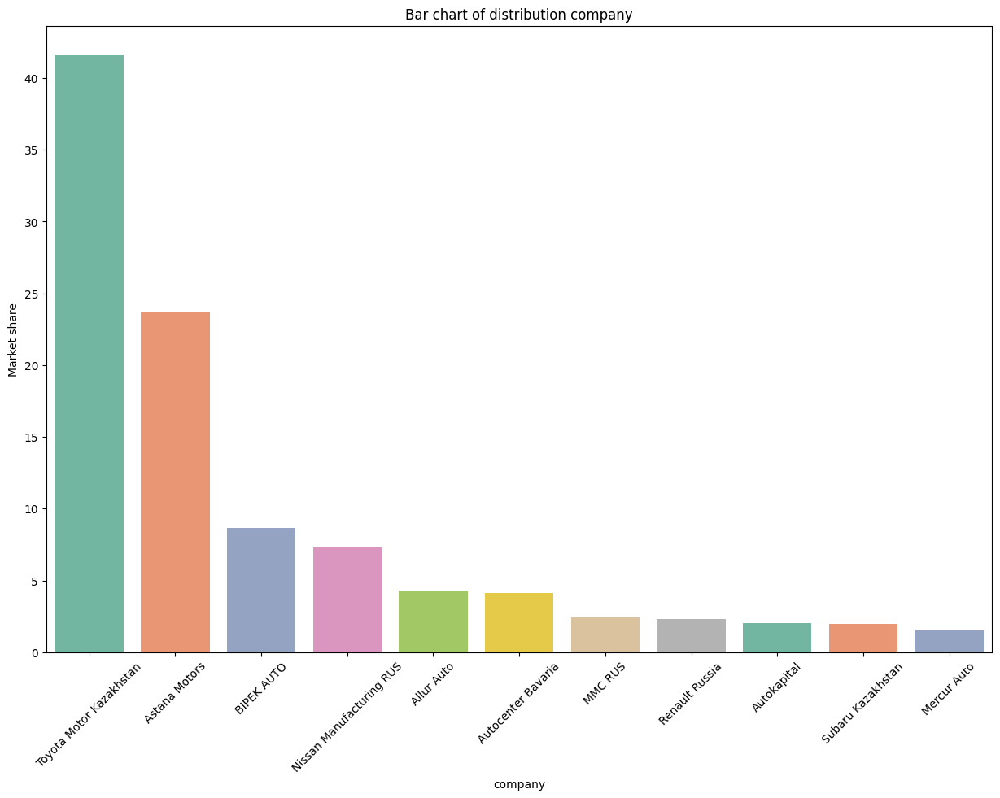

In [143]:
function_seaborn_2(table=best_suv, x='company', y='percentage', ytitle='Market share')

**Conclusion: in the SUV class, the Mercur Auto company occupies about 2% of the market, which on the one hand is extremely small, on the other hand, given the problems with Volkswagen in the second half of the year, it is not bad at all. The main competitors with similar market shares are Subaru Kazakhstan, Renault Russia, MMC Rus, Autocenter-Bavaria, Allur Auto, Autokapital.**

**For each company, we will find the SUV class models that they are engaged in, and for each model we will calculate the amount of sales.**

**Let's compare the sales of the models of the company Mercur Auto with the models of the market leaders. To do this, we will first save the sales related to Mercur Auto separately, then we will leave the top 15 models by sales excluding Merkur Auto. Finally, we will combine the resulting tables into the final final_suv.**

In [144]:
medium_suv = competitors_suv.pivot_table(index=['company',  'new_model'],
                                         values='sell_price_usd', aggfunc='sum').reset_index()

In [145]:
mercur_suv = medium_suv.query('company == "Mercur Auto"')

In [146]:
medium_suv = medium_suv.query('company !="Mercur Auto"').sort_values(by='sell_price_usd', ascending=False).head(15)

In [147]:
final_suv = pd.concat([medium_suv, mercur_suv], axis=0)
final_suv

,company,new_model,sell_price_usd
15,Astana Motors,Hyundai Tucson,87315626.0
96,Toyota Motor Kazakhstan,Toyota LC Prado,83134048.0
97,Toyota Motor Kazakhstan,Toyota LC200,57893775.0
13,Astana Motors,Hyundai Creta,35222303.0
98,Toyota Motor Kazakhstan,Toyota RAV4,33725122.0
89,Toyota Motor Kazakhstan,Lexus LX,33640552.0
91,Toyota Motor Kazakhstan,Lexus RX,24363832.0
14,Astana Motors,Hyundai Santa Fe,23288640.0
43,BIPEK AUTO,Lada 4x4,22338600.0
0,Allur Auto,Jac S3,17847506.0


**We will build a hitmap where you can immediately see the dealers-market leaders, their best models and models of the company Mercur Auto.
To do this, expand the final_suv table and present the company names as column names.**

In [148]:
suv_full = final_suv.pivot_table(index='new_model', columns='company',
                           values='sell_price_usd', aggfunc='sum').fillna(0).astype('int')

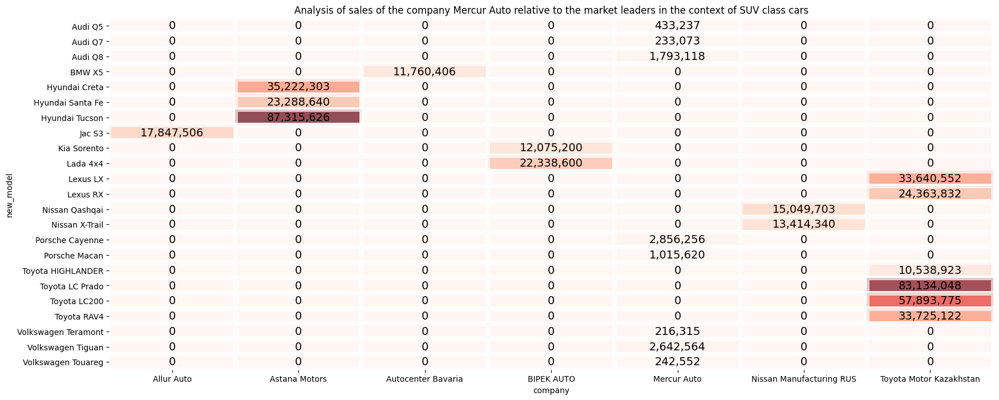

In [149]:
plt.figure(figsize=(20, 8))

annot_kws = {"ha": 'center', "va": 'center', "fontsize": 14, "color": 'black'}

sns.heatmap(suv_full, annot=True, cbar=False, cmap='Reds', fmt=',.0f', linewidth=5, alpha=0.7, annot_kws=annot_kws)

plt.title('Analysis of sales of the company Mercur Auto relative to the market leaders in the context of SUV class cars')
plt.show()

**Conclusion: Toyota LC Prado, LC200, Hyundai Tucson are market leaders in the SUV class. There are 8 models in the Mercur Auto portfolio in this class, the Porsche Cayenne and Volkswagen Tiguan are best sold. Given the problems with Volkswagen, perhaps the company should take a dealership for a new brand. If it does not work out with the market leaders Toyota, Hyundai, Lada, then in my opinion you can look at brands such as Jac, Nissan, Kia.**

**Let's take a separate look at the competitors in the B class**

In [150]:
competitors_b = light_vehicles.query('new_class == "B class"')

In [151]:
companies_b = competitors_b.pivot_table(index='company', values='sell_price_usd', aggfunc='sum').reset_index()
best_b = companies_b.sort_values(by='sell_price_usd', ascending=False).head(10)
best_b['percentage'] = round(100 * (best_b['sell_price_usd'] / best_b['sell_price_usd'].sum()), 2)
best_b

,company,sell_price_usd,percentage
5,BIPEK AUTO,81290280.0,50.59
1,Astana Motors,36481919.0,22.70
8,Ravon Motors Kazakhstan,14938185.0,9.30
9,Renault Russia,9420432.0,5.86
11,Volkswagen Group Rus,8154598.0,5.07
7,Mercur Auto,6418799.0,3.99
10,UAZAuto-Kazakhstan,1531552.0,0.95
0,Allur Auto,1444409.0,0.90
3,Autohouse Motors KST,588373.0,0.37
4,Autoworld-Center,423971.0,0.26


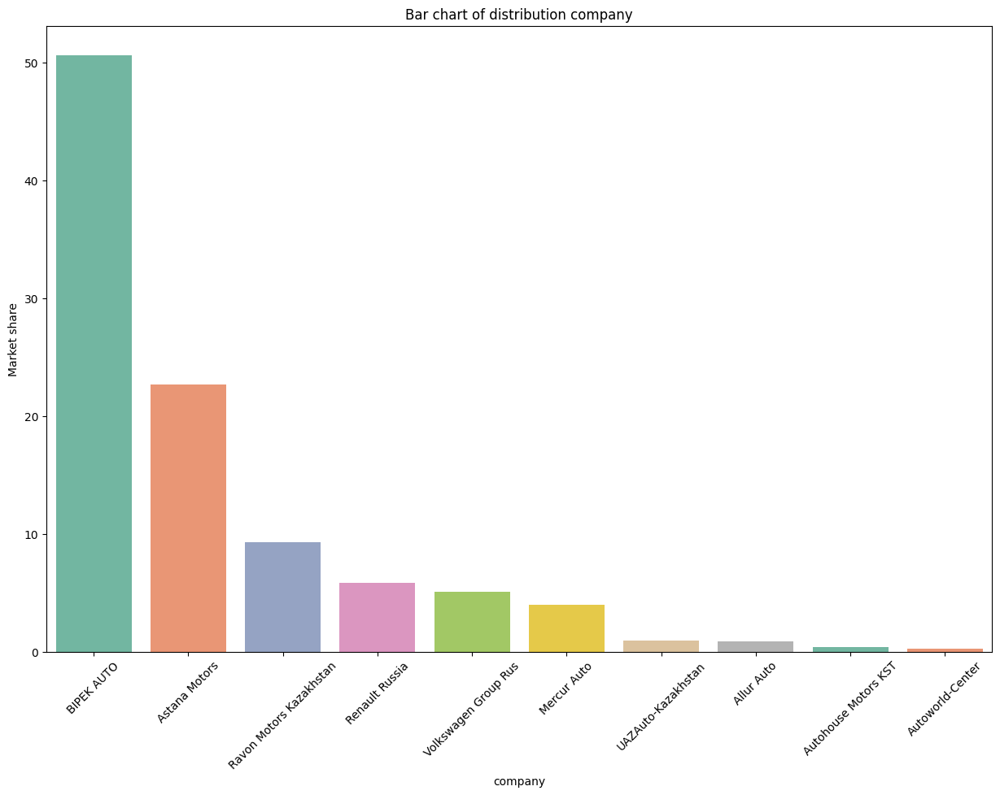

In [152]:
function_seaborn_2(table=best_b, x='company', y='percentage', ytitle='Market share')

**Conclusion: in the class, the Mercur Auto company occupies about 4% of the market, which on the one hand is extremely small, on the other hand, given the problems with Volkswagen in the second half of the year, it is not bad at all. The main competitors with similar market shares are Volkswagen Group Rus (which took over the Volkswagen dealership), Renault Russia, Ravon Motors Kazakhstan.**

In [153]:
companies_b = competitors_b.pivot_table(index=['company',  'new_model'],
                                         values='sell_price_usd', aggfunc='sum').reset_index()

In [154]:
mercur_b = companies_b.query('company == "Mercur Auto"')

In [155]:
companies_b = companies_b.query('company !="Mercur Auto"').sort_values(by='sell_price_usd', ascending=False).head(15)

In [156]:
final_b = pd.concat([companies_b, mercur_b], axis=0)

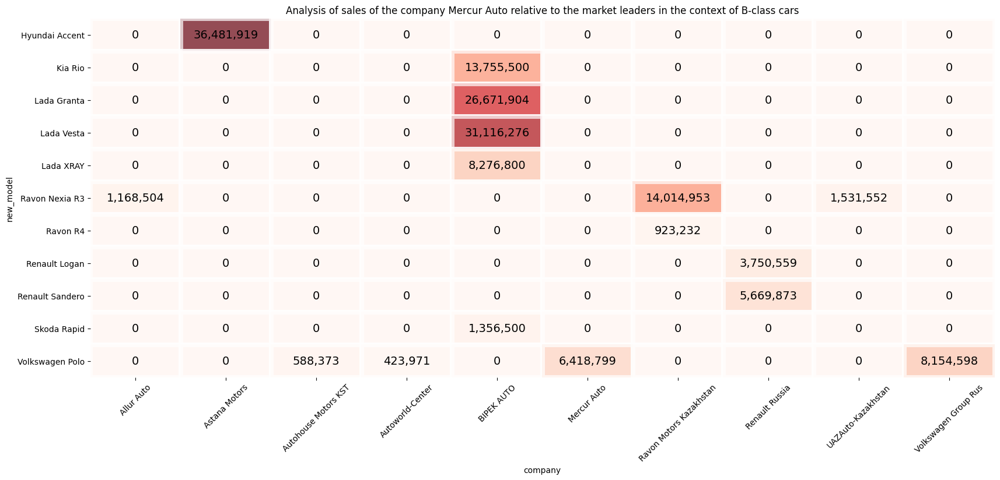

In [157]:
b_full = final_b.pivot_table(index='new_model', columns='company',
                           values='sell_price_usd', aggfunc='sum').fillna(0).astype('int')

plt.figure(figsize = (20, 8))
annot_kws = {"ha": 'center', "va": 'center', "fontsize": 14, "color": 'black'}

sns.heatmap(b_full, annot=True, cbar=False, cmap='Reds', fmt=',.0f', linewidth=5, alpha=0.7, annot_kws=annot_kws)

plt.title('Analysis of sales of the company Merсur Auto relative to the market leaders in the context of B-class cars')
plt.xticks(rotation='45')
plt.show()

**Conclusion: Lada Granta, Vesta, Hyundai Accent are the market leaders in class B. The Merсur Auto portfolio in this class includes 1 model - Volkswagen Polo. The new Volkswagen Group Rus dealer surpassed Mercur Auto in sales of this model. Given the problems with Volkswagen, perhaps the company should take a dealership for a new brand. If it does not work out with the market leaders Hyundai and Lada, then in my opinion you can look at brands such as Ravon, Renault.**

#### *Let's analyze the competitors in the city of Astana*

**As we noted earlier, the Mercur Auto company has fairly low sales in Astana, one of the key cities for car sales. Let's check which models and leaders are represented in this city in classes B and SUV.**

In [158]:
competitors_astana = light_vehicles.query('state == "Astana"')

In [159]:
astana_suv = competitors_astana.query('new_class == "SUV class"').pivot_table(index='company',
                                         values='sell_price_usd', aggfunc='sum').reset_index()
astana_suv.sort_values(by='sell_price_usd', ascending=False).head()

,company,sell_price_usd
12,Toyota Motor Kazakhstan,67960617.0
1,Astana Motors,34702072.0
2,Autocenter Bavaria,10194886.0
8,Nissan Manufacturing RUS,8771250.0
5,BIPEK AUTO,8385300.0


In [160]:
astana_b = competitors_astana.query('new_class == "B class"').pivot_table(index='company',
                                         values='sell_price_usd', aggfunc='sum').reset_index()
astana_b.sort_values(by='sell_price_usd', ascending=False).head()

,company,sell_price_usd
3,BIPEK AUTO,9774053.0
1,Astana Motors,8029728.0
5,Ravon Motors Kazakhstan,1806659.0
6,Renault Russia,1710499.0
8,Volkswagen Group Rus,1074807.0


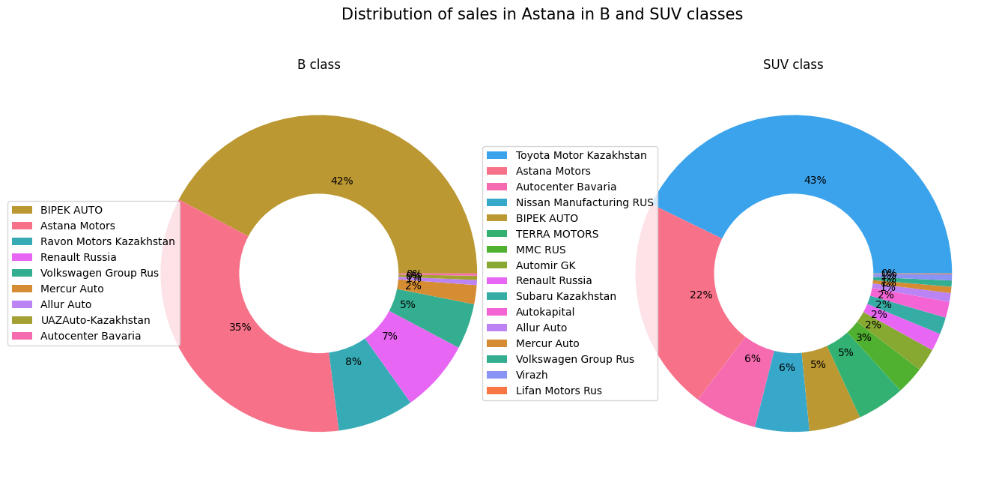

In [161]:
values_1 = astana_b['sell_price_usd'].tolist()
labels_1 = astana_b['company'].tolist()

values_2 = astana_suv['sell_price_usd'].tolist()
labels_2 = astana_suv['company'].tolist()

# Getting a list of unique companies
unique_companies = pd.Series(list(set(labels_1) | set(labels_2)))

# Creating a dictionary of colors only for unique companies
colors = sns.color_palette("husl", n_colors=len(unique_companies))
company_color_dict = dict(zip(unique_companies, colors))

# Sorting values and labels
sorted_data_1 = sorted(zip(values_1, labels_1), reverse=True)
sorted_values_1, sorted_labels_1 = zip(*sorted_data_1)

sorted_data_2 = sorted(zip(values_2, labels_2), reverse=True)
sorted_values_2, sorted_labels_2 = zip(*sorted_data_2)

# Plotting
plt.figure(figsize=(15, 10))
plt.suptitle('Distribution of sales in Astana in B and SUV classes', fontsize=15, y=0.85)

plt.subplot(1, 2, 1)
plt.pie(sorted_values_1, autopct='%.0f%%', labels=None, colors=[company_color_dict[label] for label in sorted_labels_1])
plt.title('B class')
circle_1 = plt.Circle((0, 0), 0.5, color='white')
p = plt.gcf()
p.gca().add_artist(circle_1)
plt.legend(sorted_labels_1, loc='center left', bbox_to_anchor=(-0.3, 0.5))

plt.subplot(1, 2, 2)
plt.pie(sorted_values_2, autopct='%.0f%%', labels=None, colors=[company_color_dict[label] for label in sorted_labels_2])
plt.title('SUV class')
circle_2 = plt.Circle((0, 0), 0.5, color='white')
p = plt.gcf()
p.gca().add_artist(circle_2)
plt.legend(sorted_labels_2, loc='center left', bbox_to_anchor=(-0.3, 0.5))

plt.show()

**Conclusion: we see that in the SUV class, the Merсur Auto company in Astana has the same share as in the whole market - about 2%, and in the class there is a serious drawdown - only 1% compared to 4% in the general market.**

**Now let's compare the sales of models of the Merсur Auto company in Astana with the indicators of the leaders in this city. Separately for B and SUV classes.**

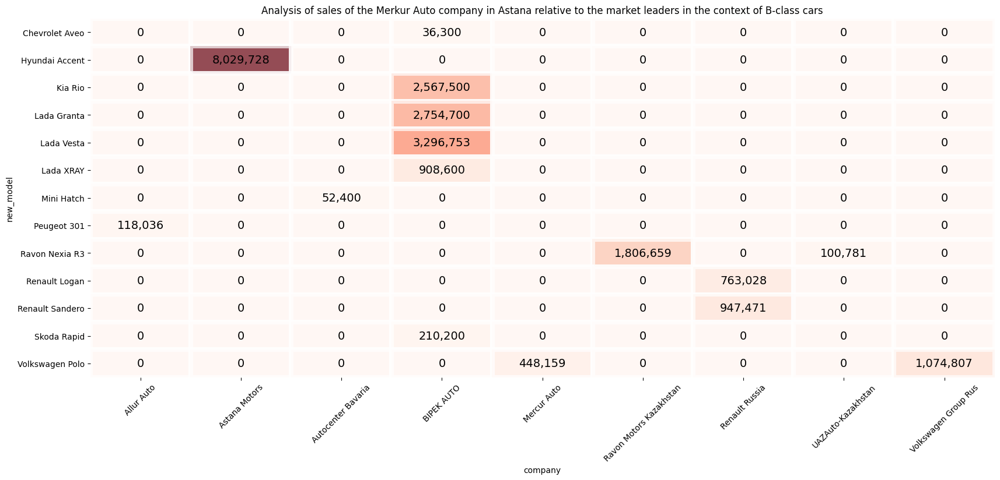

In [162]:
b_astana = competitors_astana.query('new_class == "B class"').pivot_table(index='new_model', columns='company',
                           values='sell_price_usd', aggfunc='sum').fillna(0).astype('int')

plt.figure(figsize = (20, 8)) 
annot_kws = {"ha": 'center', "va": 'center', "fontsize": 14, "color": 'black'}

sns.heatmap(b_astana, annot=True, cbar=False, cmap='Reds', fmt=',.0f', linewidth=5, alpha=0.7, annot_kws=annot_kws)

plt.title('Analysis of sales of the Merkur Auto company in Astana relative to the market leaders in the context of B-class cars')
plt.xticks(rotation='45')
plt.show()

**Conclusion: we see that if in the whole market Volkswagen Group Rus surpassed Mercur Auto in sales in B class by 1.27 times, then specifically in Astana the difference is 2.39 times. In general, the sales structure in Astana is almost the same as in the whole market: Lada Granta, Vesta, Hyundai Accent are the leaders. The difference is that the Kia Rio sells better in Astana than in the whole market and overtakes the Ravon Nexia R3. Accordingly, if we return to the question of a new dealership, then in addition to the above-mentioned Hyundai, Lada, Ravon, Renault, we can also recommend taking a dealership for Kia. This will significantly increase the company's sales in Astana in the B class**

In [163]:
suv_astana = competitors_astana.query('new_class == "SUV class"').pivot_table(index=['company',  'new_model'],
                                         values='sell_price_usd', aggfunc='sum').reset_index()

suv_mercur = suv_astana.query('company == "Mercur Auto"')

suv_astana = suv_astana.query('company !="Mercur Auto"').sort_values(by='sell_price_usd', ascending=False).head(15)

suv_final = pd.concat([suv_mercur, suv_astana], axis=0)
suv_final

,company,new_model,sell_price_usd
32,Mercur Auto,Audi Q5,107823.0
33,Mercur Auto,Audi Q7,72215.0
34,Mercur Auto,Audi Q8,154525.0
35,Mercur Auto,Porsche Cayenne,72919.0
36,Mercur Auto,Volkswagen Tiguan,530884.0
37,Mercur Auto,Volkswagen Touareg,81676.0
6,Astana Motors,Hyundai Tucson,20613979.0
68,Toyota Motor Kazakhstan,Toyota LC Prado,17126359.0
61,Toyota Motor Kazakhstan,Lexus LX,12914991.0
69,Toyota Motor Kazakhstan,Toyota LC200,11660846.0


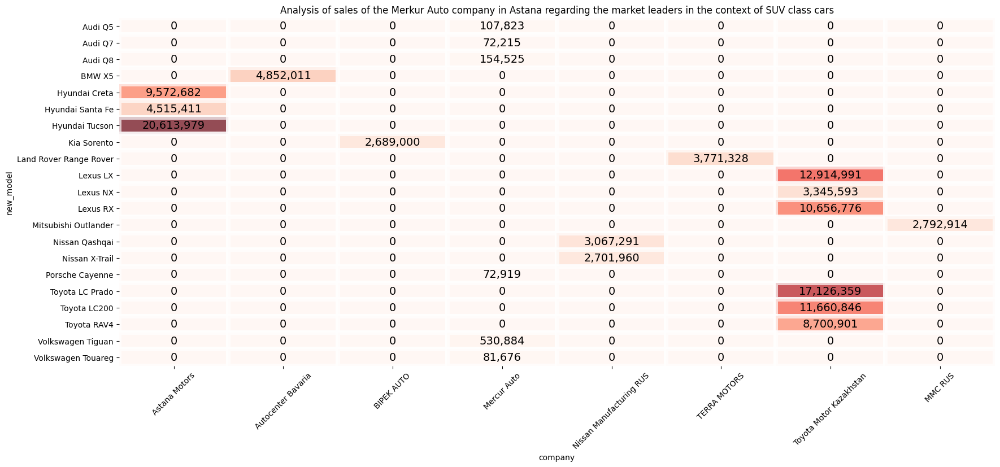

In [164]:
full_suv = suv_final.pivot_table(index='new_model', columns='company',
                           values='sell_price_usd', aggfunc='sum').fillna(0).astype('int')

plt.figure(figsize = (20, 8)) 
annot_kws = {"ha": 'center', "va": 'center', "fontsize": 14, "color": 'black'}

sns.heatmap(full_suv, annot=True, cbar=False, cmap='Reds', fmt=',.0f', linewidth=5, alpha=0.7, annot_kws=annot_kws)

plt.title('Analysis of sales of the Merkur Auto company in Astana regarding the market leaders in the context of SUV class cars')
plt.xticks(rotation='45')
plt.show()

**Conclusion: we see that compared to the market as a whole, in Astana, the Merсur Auto company practically does not sell Porsche Cayenne, the Volkswagen Tiguan is best sold. In general, we see that in Astana, the sales structure in the SUV class is slightly different from the market - Lexus LX, RX. Hyundai Creta are sold much better here, and Lada 4x4 is not on the list of leaders. If we consider the issue of a new dealership, then the recommendations remain unchanged - if it does not work out with market leaders Toyota, Hyundai, Lada, then in my opinion you can look at brands such as Jac, Nissan, Kia.**

### Let's conduct a BCG analysis of the brands that the Mercur Auto company sells

The BCG Matrix method (Boston Consulting Group) is a tool for strategic management of a company's product portfolio or business units. Developed by business consultants in the 1970s, this method is a two-dimensional matrix based on an analysis of market share and the growth rate of a product or business unit. The four quadrants of the BCG matrix define the strategic position of a product or business: "Stars", "Difficult Children", "Cash Cows" and "Dead Dogs".
- The stars have a high market share and a high growth rate, requiring additional investments.
- Difficult children are new products with high growth and uncertain market share.
- Cash cows are well–established products with a high market share and a low growth rate.
- Dead Dogs are products with a low market share and low growth rate that require careful consideration to determine their future contribution to the company's portfolio.

This method helps companies make strategic decisions regarding the allocation of resources and investments in accordance with the potential for growth and profit.

**For BCG analysis, we will calculate monthly sales and total sales for each model. This will allow for each model to find its market share within the Mercur Auto. Next, we will find the first and last sales for each model, this will allow us to calculate the sales growth rate for each model.**

In [165]:
bcg = mercur.pivot_table(index=['month', 'model'], values='sell_price_usd', aggfunc='sum').reset_index()
bcg.fillna(0, inplace=True)
bcg = order_months(bcg, 'month')
bcg['final sales'] = bcg.groupby('model')['sell_price_usd'].transform('sum')
bcg['market share'] = round(100 * (bcg['final sales'] / bcg['final sales'].sum()), 3)
bcg['last sale'] = bcg.groupby('model')['sell_price_usd'].transform('last')
bcg['first sale'] = bcg.groupby(['model'])['sell_price_usd'].transform('first')
bcg['growth rate'] = round(100 * ((bcg['last sale'] / bcg['first sale']) - 1), 3)
bcg.head()

,month,model,sell_price_usd,final sales,market share,last sale,first sale,growth rate
26,January,Multivan,70395.0,211161.0,0.204,70371.0,70395.0,-0.034
24,January,Cayenne,89000.0,2856256.0,2.755,334009.0,89000.0,275.291
23,January,A8,129935.0,557799.0,0.538,245600.0,129935.0,89.018
28,January,Q5,47836.0,433237.0,0.418,58723.0,47836.0,22.759
25,January,Jetta,53434.0,53434.0,0.052,53434.0,53434.0,0.000


In [166]:
# Using the example of the Panamera model, let's check that all calculations are done correctly
bcg.query('model == "Panamera"')

,month,model,sell_price_usd,final sales,market share,last sale,first sale,growth rate
3,April,Panamera,152442.0,1079062.0,1.041,126037.0,152442.0,-17.321
59,May,Panamera,436131.0,1079062.0,1.041,126037.0,152442.0,-17.321
41,June,Panamera,364452.0,1079062.0,1.041,126037.0,152442.0,-17.321
68,September,Panamera,126037.0,1079062.0,1.041,126037.0,152442.0,-17.321


In [167]:
# We will leave only those columns that we will need to build the BCG matrix
final = bcg.pivot_table(index='model', values=['market share', 'growth rate', 'final sales'],
                     aggfunc={'market share': 'max', 'growth rate': 'max', 'final sales' : 'sum'}).reset_index()
final.sort_values(by='growth rate', ascending=False)

,model,final sales,growth rate,market share
3,A6,3038465.0,313.204,0.586
7,Cayenne,25706304.0,275.291,2.755
2,A4,191716.0,99.556,0.092
5,A8,1673397.0,89.018,0.538
18,Tiguan,13212820.0,62.872,2.549
14,Q7,466146.0,62.617,0.225
9,Macan,6093720.0,48.837,0.979
13,Q5,1732948.0,22.759,0.418
1,A3,120724.0,14.697,0.058
0,911 Carrera S,162576.0,0.000,0.157


In [168]:
# For each model, depending on the market share and growth rate, we assign a value according to the BCG classification
final['classification'] = 'Другие'
final.loc[(final['market share'] >= 5.0) & (final['growth rate'] >= 50.0), 'classification'] = 'The stars'
final.loc[(final['market share'] >= 5.0) & (final['growth rate'] < 50.0), 'classification'] = 'Cash cows'
final.loc[(final['market share'] < 5.0) & (final['growth rate'] >= 50.0), 'classification'] = 'Difficult children'
final.loc[(final['market share'] < 5.0) & (final['growth rate'] < 50.0), 'classification'] = 'Dead dogs'
final

,model,final sales,growth rate,market share,classification
0,911 Carrera S,162576.0,0.000,0.157,Dead dogs
1,A3,120724.0,14.697,0.058,Dead dogs
2,A4,191716.0,99.556,0.092,Difficult children
3,A6,3038465.0,313.204,0.586,Difficult children
4,A7,171100.0,0.000,0.165,Dead dogs
5,A8,1673397.0,89.018,0.538,Difficult children
6,Amarok,73042.0,0.000,0.070,Dead dogs
7,Cayenne,25706304.0,275.291,2.755,Difficult children
8,Jetta,53434.0,0.000,0.052,Dead dogs
9,Macan,6093720.0,48.837,0.979,Dead dogs


In [169]:
fig = px.scatter(final[final['market share'] > 0.5],
                 x="market share",
                 y="growth rate",
                 size="final sales",
                 color="classification",  
                 size_max=75,
                 text='model',
                 title="BCG matrix for Mercur Auto company (for models with a market share of more than 0.5%)",
                 width=1000,
                 height=600,
                 category_orders={"classification": ["The stars", "Cash cows", "Dead dogs", "Difficult children"]})

fig.show()

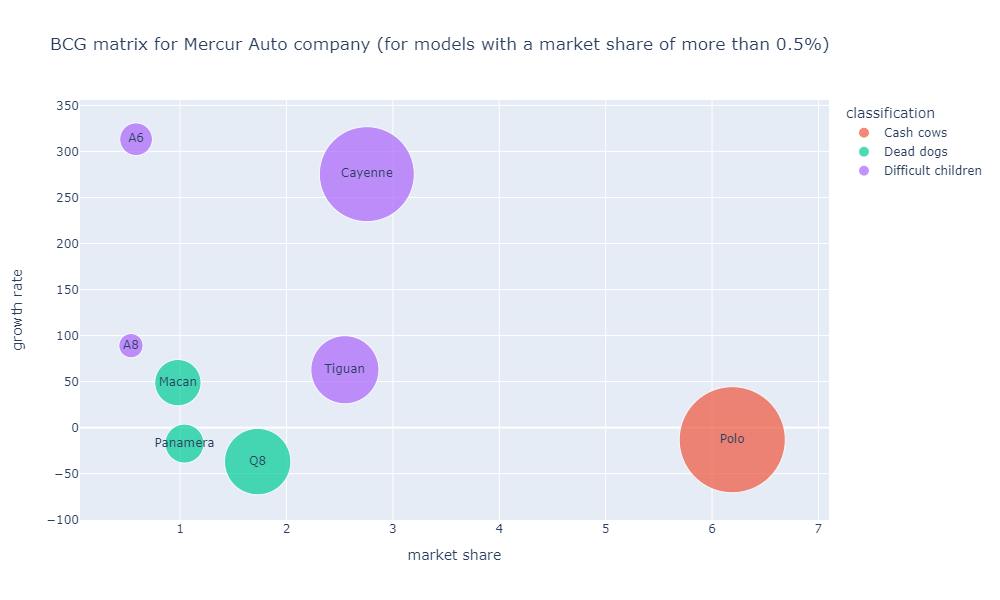

**Conclusion: we have built a BCG matrix for the best-selling models of the Mercur Auto company. It should be noted that the Volkswagen brand was sold only in the first 5 months of the year, which directly affected the distribution of categories. At the moment, we see the following:**
- There is no "Star" category, which in my opinion is extremely bad, but it can be explained by problems with Volkswagen during the year.
- Only 1 model got into the "Cash cows" category, which also, in my opinion, is a wake-up call for the company.
- 2 Porsche models and 1 Audi model were included in the "Dead Dogs" category. In my opinion, it is not necessary to remove them from the portfolio, since Mercur Auto has an exclusive for these brands. Perhaps it is worth conducting some marketing campaigns with the participation of these brands.

### Interim conclusion: at this stage, we have analyzed the position of the Mercur Auto company in the market. We were able to establish the following:
1. The company's total revenue is 19 355 310 dollars.
2. The company deals with Audi, Porsche, Volkswagen brands. The most profitable brand is Volkswagen. Mercur Auto is the only dealer in Kazakhstan for the Porsche and Audi brands.
3. The dynamics of the company's sales is very different from the general market. After the winter, the market has seen growth peak in July. On the contrary, after the peak in May, the company experienced a sharp decline in sales by the summer. This is due to the fact that the Volkswagen manufacturer decided to replace 4 old dealers with one that is clearly affiliated with it. Until May, Mercur Auto was Volkswagen's sales leader.
4. The new dealer was able to surpass the old ones in all regions except the most key one - Almaty. In this region, the Merkur Auto company is still the leader in sales.
5. Almost all of the company's sales are concentrated in Almaty. The company has extremely small sales in Astana, this is one of the company's growth points.
6. The company sells the most SUV and B class cars, which fully corresponds to the market situation.
7. In the SUV class, the Mercur Auto company occupies about 2% of the market. The main competitors with similar market shares are Subaru Kazakhstan, Renault Russia, MMC Rus, Autocenter-Bavaria, Allur Auto.
8. Toyota LC Prado, LC200, Hyundai Tucson are market leaders in the SUV class. There are 8 models in the Mercur Auto portfolio in this class, the Porsche Cayenne and Volkswagen Tiguan are best sold.
9. in the B class, Mercur Auto occupies about 4% of the market. The main competitors with similar market shares are Volkswagen Group Rus (which took over the Volkswagen dealership), Renault Russia, Ravon Motors Kazakhstan.
10. Lada Granta, Vesta, Hyundai Accent are the market leaders in class B. The Mercur Auto portfolio in this class includes 1 model - Volkswagen Polo. The new Volkswagen Group Rus dealer surpassed Mercur Auto in sales of this model.
11. We see that in the SUV class, the Mercur Car in Astana has the same share as in the whole market - about 2%, and in the class there is a serious drawdown - only 1% compared to 4% in the general market.
12. In Astana, the sales structure in the B class is almost the same as in the whole market: Lada Granta, Vesta, Hyundai Accent are the leaders. The difference is that the Kia Rio sells better in Astana than in the whole market and overtakes the Ravon Nexia R3.
13. In Astana, the sales structure in the SUV class is slightly different from the market - Lexus LX, RX, Hyundai Creta are sold much better here, and Lada 4x4 is not on the list of leaders. Compared to the market as a whole, in Astana, the Porsche Cayenne is practically not sold in Merkur Cars, the Volkswagen Tiguan is best sold.
14. BCG conducted an analysis of Mercury Auto models, and the following was found:
- There is no "Star" category, which is extremely bad, but it can be explained by problems with Volkswagen during the year.
- Only 1 model got into the "Cash cows" category, which is also a wake-up call for the company.
- 2 Porsche models and 1 Audi model were included in the "Dead Dogs" category. It is not necessary to remove them from the portfolio, since Merkur Auto has an exclusive for these brands. Perhaps it is worth conducting some marketing campaigns with the participation of these brands.

## Recommendations that can be given to Mercur Auto company for business development:
1. Try to return the Volkswagen dealership, as this is the most profitable brand of the company. One of the arguments for the return of the dealership: The new dealer cannot cope with maintaining the sales level in Almaty, a key city for car sales.
2. If it is not possible to reach an agreement with Volkswagen, then in order to maintain and increase market share, the company needs to take a dealership for some new brand (or several brands). If it does not work out with the market leaders - Toyota, Hyundai, Lada, then in my opinion you can look at brands such as Jac, Nissan, Kia, Ravon, Renault.
3. In my opinion, the best solution would be to choose the Kia brand, as it will significantly increase sales in the class, especially in Astana, where the company is clearly not getting ahead in potential sales. Of course, this proposal is based on the assumption that it will not work with any of the leaders - Toyota, Hyundai, Lada. These brands have divided the market among themselves and are unlikely to be interested in the appearance of new dealers.
4. In order to increase sales, the company may begin to develop the direction of commercial transport. If it does not work out with the market leaders - Kamaz, GAZ, then in my opinion you can look at brands such as Daewoo, UAZ, Hyundai Truck, MAN.
5. In my opinion, the best solution would be to choose the Hyundai Truck or MAN brand, since these brands sell well in Almaty, where Merсur Auto has the strongest positions. If the company decides to increase sales in Astana, including counting the commercial segment, then in this case it is necessary to take a Kamaz dealership, since this brand is best sold in this city.

AttributeError: 'list' object has no attribute 'mean'